In [2]:
import os
import re
import sys
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [4]:
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df = pd.read_excel(file)

In [5]:
df.shape

(106950, 85)

In [47]:
# サンプルの散布図 ---
def scatter_with_dist(df, x_label, y_label, outfile):
    #file = r'C:\Users\T22178\Desktop\test/BG_k9.xlsx'
    #df = pd.read_excel(file)

    #file = r'C:\Users\T22178\Desktop\test/BG_k9_top100.xlsx'
    #df_top = pd.read_excel(file)
    #top100_xy = df[df['Seq'].isin(df_top['Seq'].to_list())]

    left, width = 0.1, 0.65 #散布図の左余白と、幅を定義
    bottom, height = 0.1, 0.65 #散布図の下余白と、高さを定義
    spacing = 0.05 #散布図とヒストグラムの間隔
    fig_scatter = [left, bottom, width, height] #散布図の定義
    fig_histx = [left, bottom + height + spacing, width, 0.2] #上のヒストグラムの定義
    fig_histy = [left + width + spacing, bottom, 0.2, height] #右のヒストグラムの定義

    fig = plt.figure(figsize=(8, 8)) #描写領域を正方形で生成

    ax = fig.add_axes(fig_scatter) #図1として散布図領域を生成
    ax_histx = fig.add_axes(fig_histx, sharex=ax) #上のヒストグラム領域を生成
    ax_histy = fig.add_axes(fig_histy, sharey=ax) #右のヒストグラム領域を生成
    ax_histx.tick_params(axis="x", labelbottom=False) #x軸ラベル無し
    ax_histy.tick_params(axis="y", labelleft=False) #y軸ラベル無し

    x = df[x_label].to_numpy()
    y = df[y_label].to_numpy()
    xymax = max(np.max(x), np.max(y)) + 1 #xとyの最大値を定義
    binwidth = 0.1 #binの値幅を定義。
    bins = np.arange(0, xymax, binwidth) #binの個数を定義

    ax.set_xlim([0, xymax])
    ax.set_ylim([0, xymax])
    ax.scatter(x, y, color='gray', s=2.0)
    #ax.scatter(top100_xy[x_label], top100_xy[y_label], color='red', s=2.0, label='top100')
    ax.plot([0, xymax], [0, xymax], color='darkturquoise', linestyle='--', label='FC=1')
    ax.plot(bins, 1.5*bins, color='dodgerblue', linestyle='--', label='FC=1.5')
    ax.plot(bins, 2.0*bins, color='blue', linestyle='--', label='FC=2')

    #r = df.loc[:, x_label:y_label].corr(method='pearson').iloc[0, 1]
    #lm = LinearRegression().fit(x.reshape(-1, 1), y)
    #ax.plot(x, lm.predict(x.reshape(-1, 1)), color='purple', linestyle='--', label='r='+str(round(r, 2)))

    ax_histx.hist(x, bins=bins, color='gray') #xについてのヒストグラム作成
    ax_histy.hist(y, bins=bins, orientation='horizontal', color='gray') #yについてのヒストグラム作成

    #ax.set_xlabel(x_label)
    #ax.set_ylabel(y_label)
    ax.set_xlabel(f'log10(({x_label})x10000)')
    ax.set_ylabel(f'log10(({y_label})x10000)')

    ax.legend(
        bbox_to_anchor=(1.3, 1.4),
        loc='upper right',
        #borderaxespad=0,
        fontsize=8
    )

    plt.tick_params(labelsize=8)
    plt.show()
    #plt.savefig(outfile)

In [21]:
# rep1 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
FC_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: FC_col_1.append(cols)
info = df_rep1.loc[:, 'Header_ID']
freq = df_rep1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

# rep2 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
df_rep2 = pd.read_excel(file, sheet_name='200-231')
FC_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: FC_col_2.append(cols)
info = df_rep2.loc[:, 'Header_ID']
freq = df_rep2.loc[:, FC_col_2]
rep2 = pd.concat([info, freq], axis=1)

In [22]:
rep1

,Header_ID,PG4699_01_a_Freq,PG4699_02_a_Freq,PG4699_03_a_Freq,PG4699_04_a_Freq,PG4699_05_a_Freq,PG4699_06_a_Freq,PG4699_07_a_Freq,PG4699_08_a_Freq,PG4699_09_a_Freq,...,PG4699_12_a_Freq,PG4699_13_a_Freq,PG4699_14_a_Freq,PG4699_15_a_Freq,PG4699_16_a_Freq,PG4699_17_a_Freq,PG4699_18_a_Freq,PG4699_19_a_Freq,PG4699_20_a_Freq,PG4699_43_a_Freq
0,Seq_1555,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07
1,Seq_2558,1.306474e-06,0.000050,0.000000e+00,1.103056e-06,5.839075e-07,0.000000e+00,0.0,1.767359e-06,0.000001,...,0.000003,0.000001,0.000000e+00,1.582847e-06,0.000001,0.000001,0.000003,6.176050e-07,0.0,6.807454e-07
2,Seq_2981,6.532370e-07,0.000002,0.000000e+00,1.103056e-06,0.000000e+00,1.420603e-06,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000002,0.000001,0.000000,6.176050e-07,0.0,1.361491e-06
3,Seq_3576,0.000000e+00,0.000000,0.000000e+00,5.515279e-07,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,7.914235e-07,0.000000,0.000000,0.000000,6.176050e-07,0.0,6.807454e-07
4,Seq_5419,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,Seq_10752376,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,6.176050e-07,0.0,1.361491e-06
106946,Seq_10752392,6.532370e-07,0.000000,5.780410e-07,0.000000e+00,0.000000e+00,7.103014e-07,0.0,5.891197e-07,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000001,0.000000,0.000000e+00,0.0,6.807454e-07
106947,Seq_10752402,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,7.011364e-07,0.000000e+00,0.000000,0.000000,0.000000,4.940840e-06,0.0,2.042236e-06
106948,Seq_10752795,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07


In [23]:
df_10000 = rep1.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)

In [24]:
df_10000_m

,PG4699_01_a_Freq,PG4699_02_a_Freq,PG4699_03_a_Freq,PG4699_04_a_Freq,PG4699_05_a_Freq,PG4699_06_a_Freq,PG4699_07_a_Freq,PG4699_08_a_Freq,PG4699_09_a_Freq,PG4699_10_a_Freq,...,PG4699_12_a_Freq,PG4699_13_a_Freq,PG4699_14_a_Freq,PG4699_15_a_Freq,PG4699_16_a_Freq,PG4699_17_a_Freq,PG4699_18_a_Freq,PG4699_19_a_Freq,PG4699_20_a_Freq,PG4699_43_a_Freq
0,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807
1,0.013065,0.501878,1.00000,0.011031,0.005839,1.000000,1.0,0.017674,0.012648,0.011829,...,0.026907,0.014649,1.000000,0.015828,0.011488,0.01211,0.025823,0.006176,1.0,0.006807
2,0.006532,0.023899,1.00000,0.011031,1.000000,0.014206,1.0,1.000000,1.000000,0.029572,...,1.000000,1.000000,1.000000,1.000000,0.022977,0.01211,1.000000,0.006176,1.0,0.013615
3,1.000000,1.000000,1.00000,0.005515,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,0.007914,1.000000,1.00000,1.000000,0.006176,1.0,0.006807
4,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.006176,1.0,0.013615
106946,0.006532,1.000000,0.00578,1.000000,1.000000,0.007103,1.0,0.005891,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.01211,1.000000,1.000000,1.0,0.006807
106947,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.007011,1.000000,1.000000,1.00000,1.000000,0.049408,1.0,0.020422
106948,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807


In [32]:
outdir = 'A:/PROJECT/PG4699/200_INFO/03_ratio'

df_10000 = rep1.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)
df_log10 = np.log10(df_10000_m)
data = pd.concat([rep1.iloc[:, 0],df_log10], axis=1)

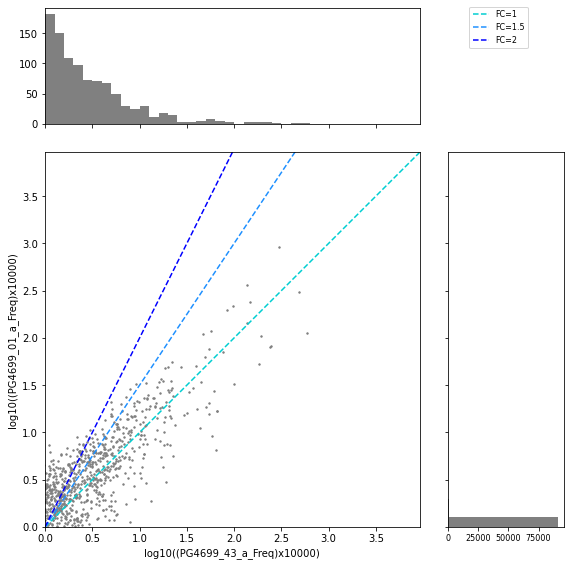

In [48]:
x_label = 'PG4699_43_a_Freq'
y_label = 'PG4699_01_a_Freq'
name1 = re.compile(r'(.*)_a').search(y_label).group(1)
name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
name = name1 + '_' + name2 + '_scatter.png'
outfile = os.path.join(outdir, name)
scatter_with_dist(data, x_label, y_label, outfile)

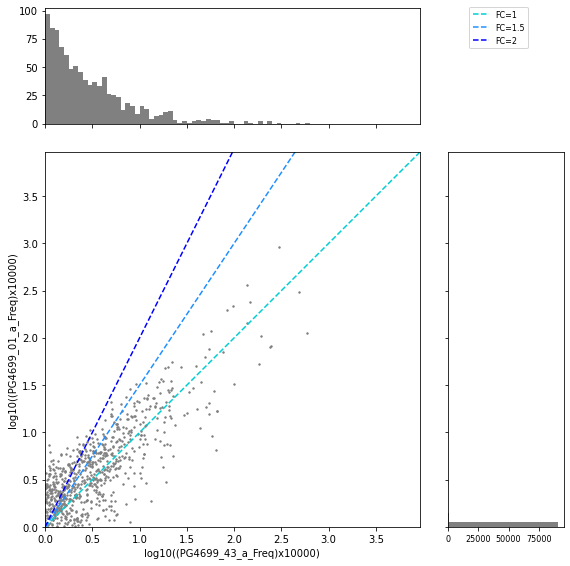

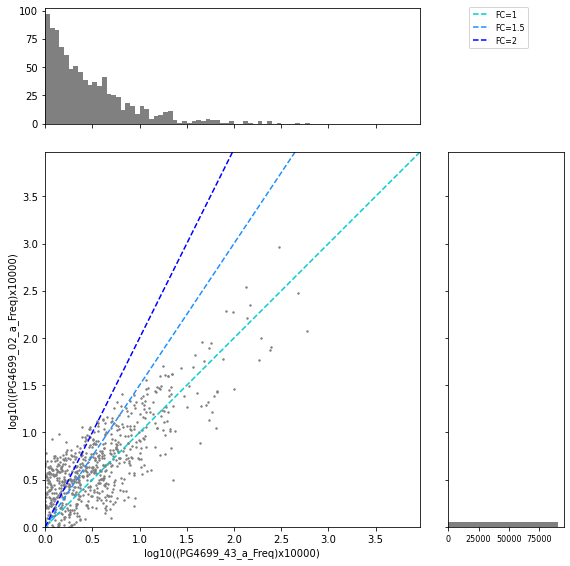

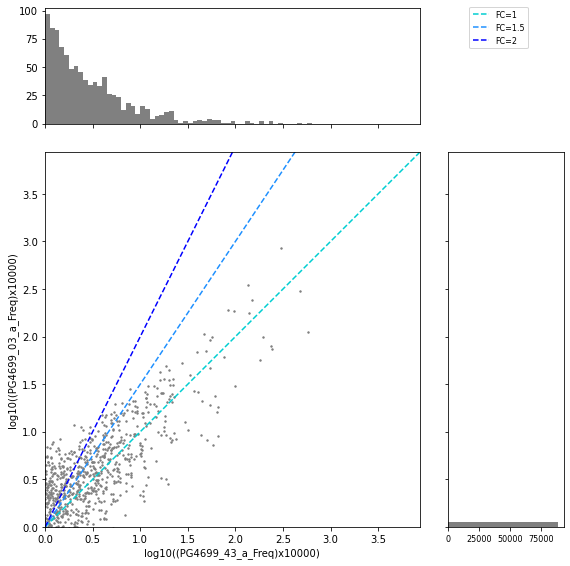

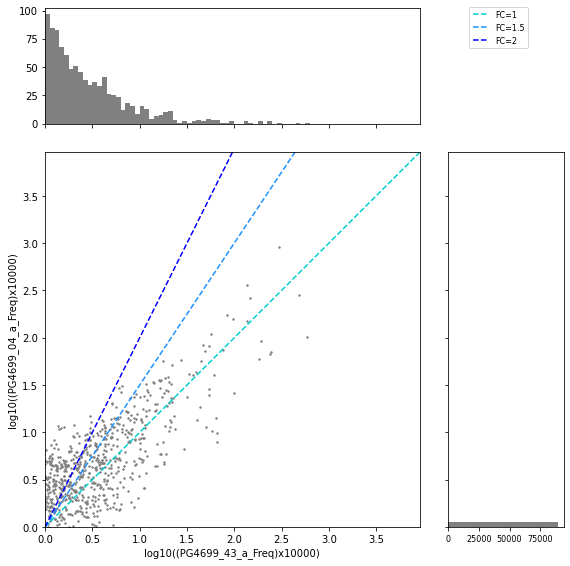

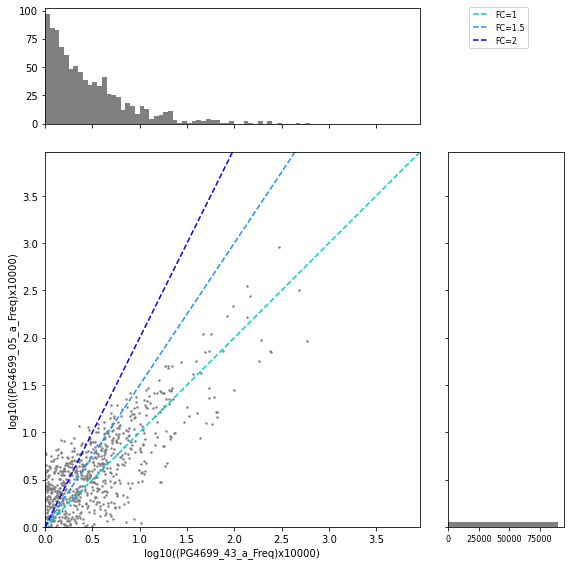

...

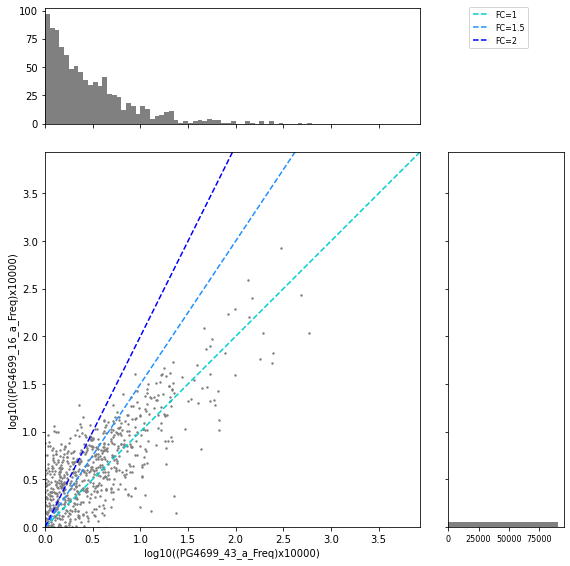

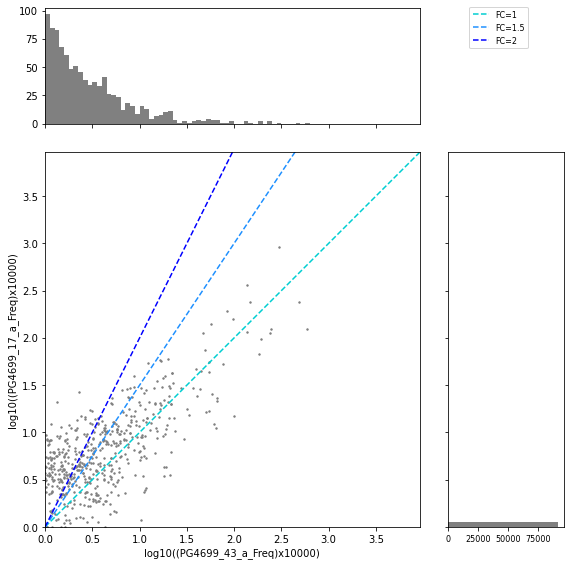

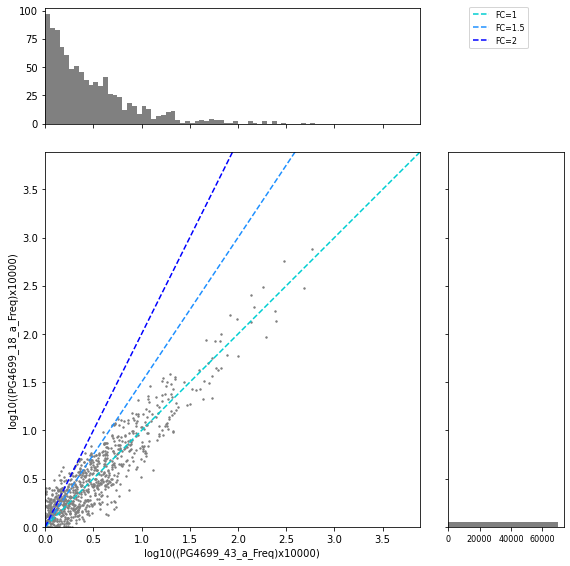

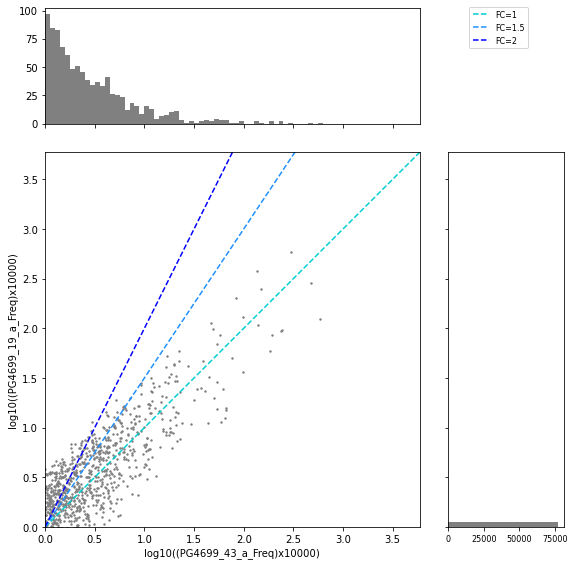

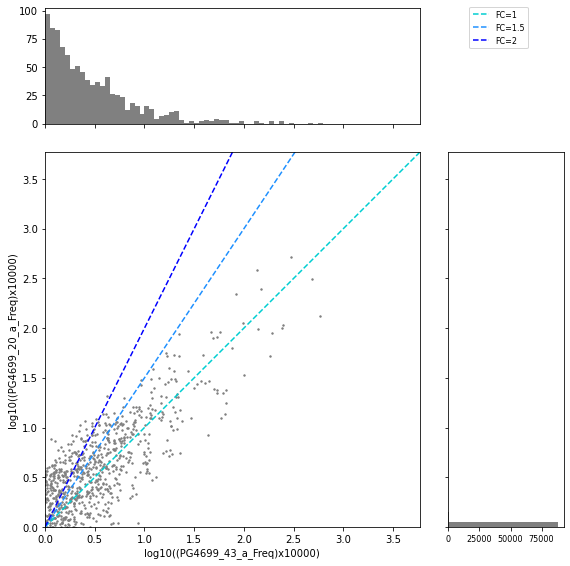

In [30]:
x_label = 'PG4699_43_a_Freq'
for i, label in enumerate(FC_col_1):
    if i < len(FC_col_1) -1:
        y_label = label
        name1 = re.compile(r'(.*)_a').search(y_label).group(1)
        name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
        name = name1 + '_' + name2 + '_scatter.png'
        outfile = os.path.join(outdir, name)
        scatter_with_dist(data, x_label, y_label, outfile)
    

In [50]:
df_10000 = rep2.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)
df_log10 = np.log10(df_10000_m)
data = pd.concat([rep2.iloc[:, 0],df_log10], axis=1)

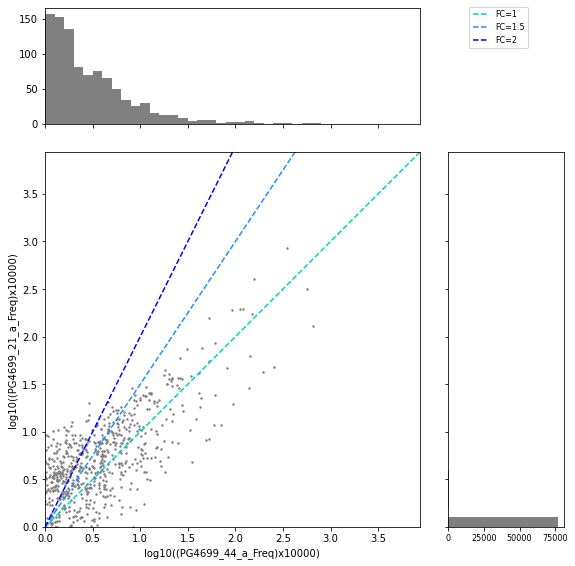

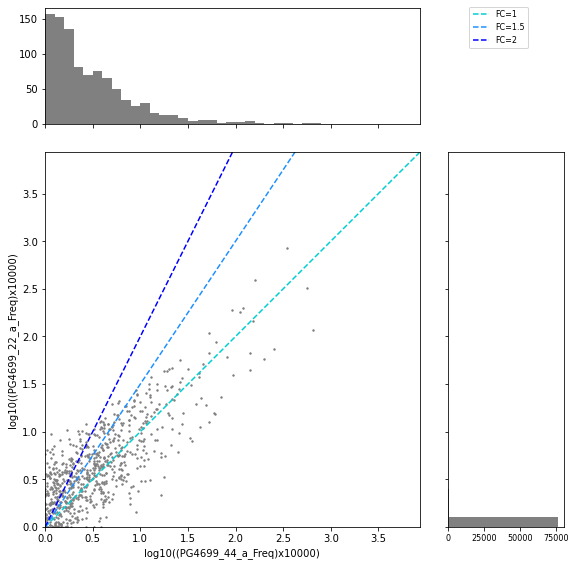

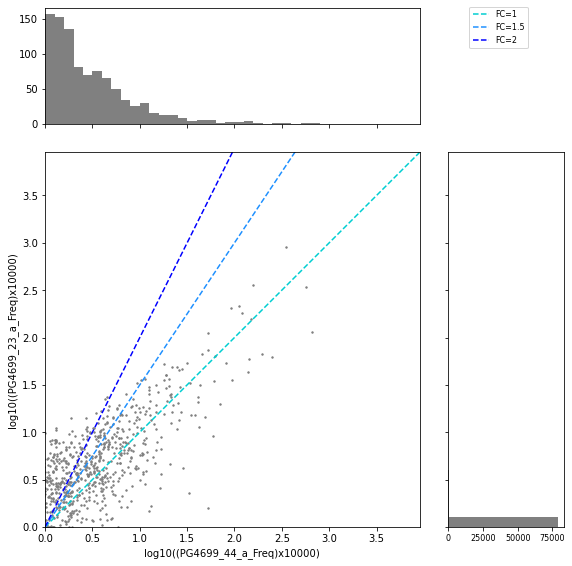

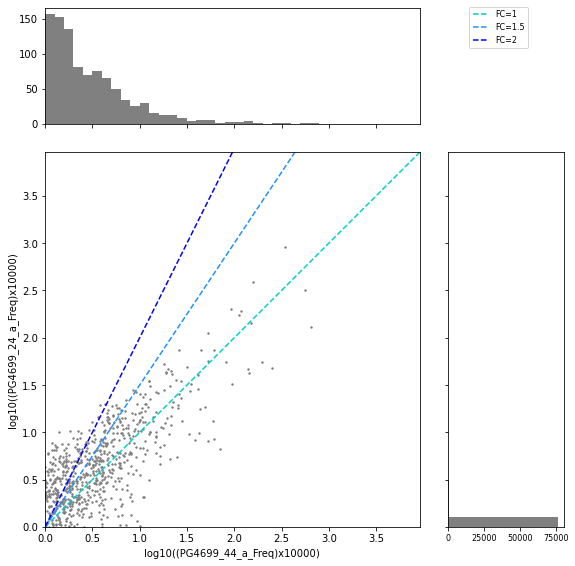

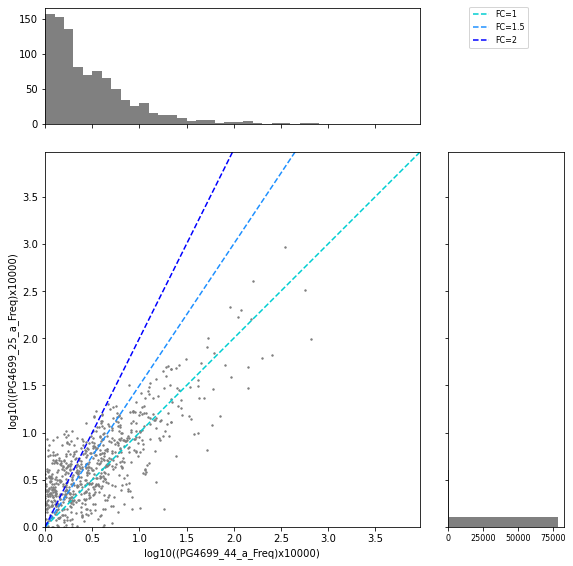

...

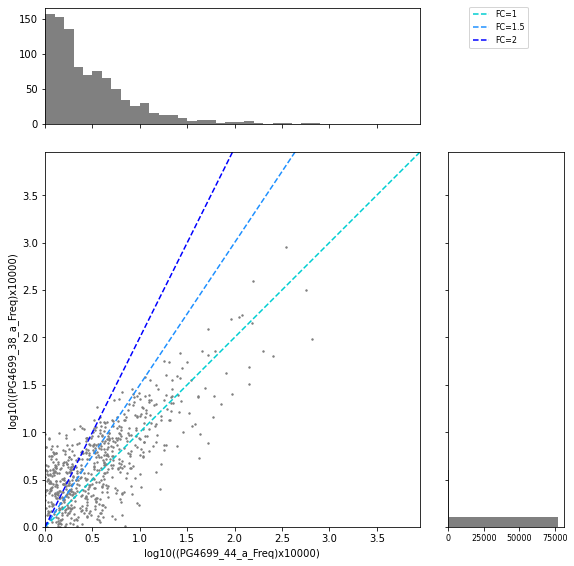

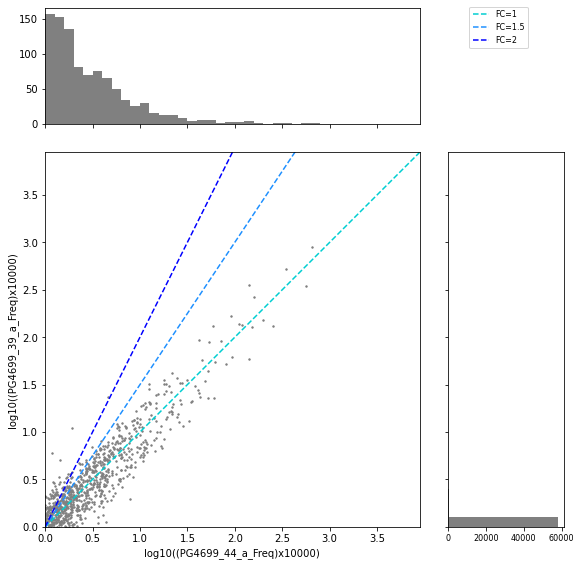

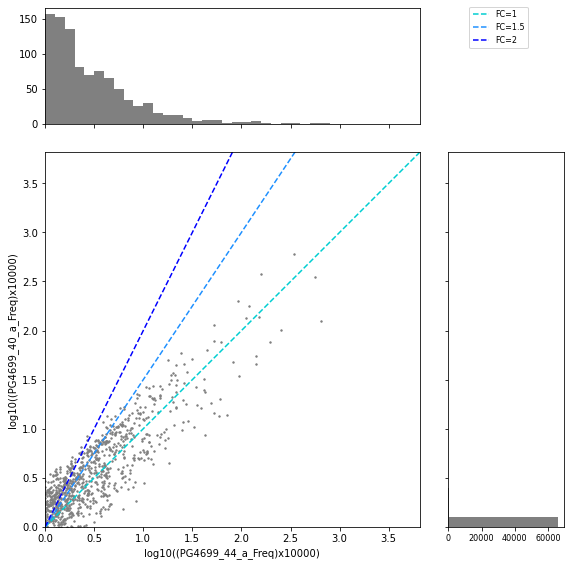

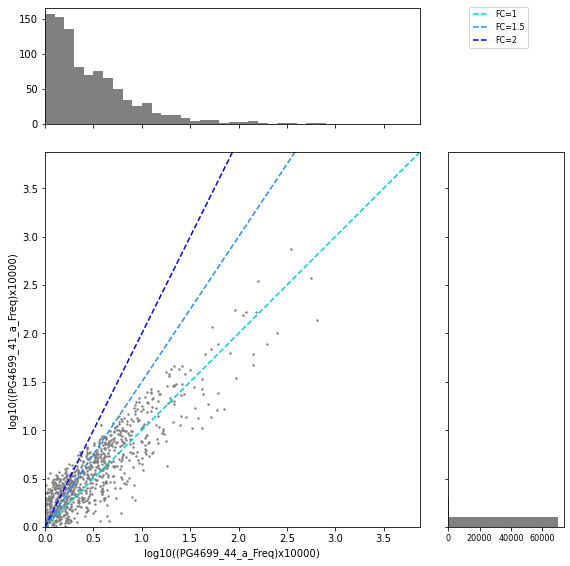

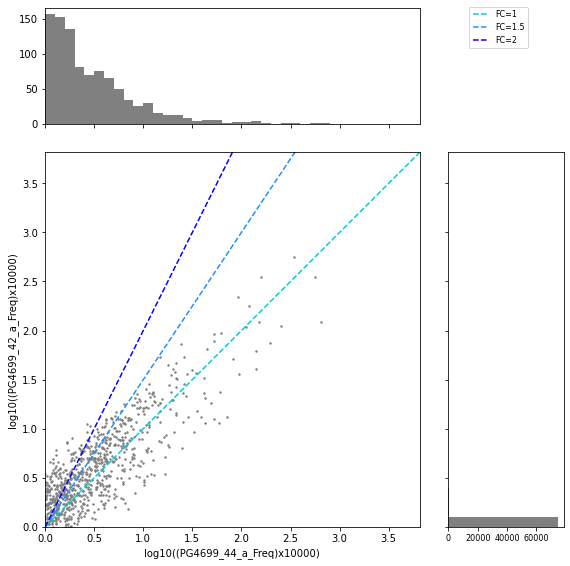

In [51]:
x_label = 'PG4699_44_a_Freq'
for i, label in enumerate(FC_col_2):
    if i < len(FC_col_2) -1:
        y_label = label
        name1 = re.compile(r'(.*)_a').search(y_label).group(1)
        name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
        name = name1 + '_' + name2 + '_scatter.png'
        outfile = os.path.join(outdir, name)
        scatter_with_dist(data, x_label, y_label, outfile)

In [52]:
import seaborn as sns

In [53]:
df_rep1

,Header_ID,Reverse_complementary (Sequence Read),Sequence (Target Sequence),PG4699_01_a_Count,PG4699_02_a_Count,PG4699_03_a_Count,PG4699_04_a_Count,PG4699_05_a_Count,PG4699_06_a_Count,PG4699_07_a_Count,...,PG4699_16_43_a_FC,PG4699_16_43_a_FDR,PG4699_17_43_a_FC,PG4699_17_43_a_FDR,PG4699_18_43_a_FC,PG4699_18_43_a_FDR,PG4699_19_43_a_FC,PG4699_19_43_a_FDR,PG4699_20_43_a_FC,PG4699_20_43_a_FDR
0,Seq_1555,AAAAAGACGGGGGGTACTTGGGAGGCT,AGCCTCCCAAGTACCCCCCGTCTTTTT,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0
1,Seq_2558,AAAAATAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTATTTTT,2,63,0,2,1,0,0,...,1.687632,0.0,1.778955,0.0,3.793392,0.0,0.907248,0.0,0.0,1.0
2,Seq_2981,AAAAATACTGGGTCTCAGTGGGAGGTG,CACCTCCCACTGAGACCCAGTATTTTT,1,3,0,2,0,2,0,...,1.687632,0.0,0.889477,0.0,0.000000,1.0,0.453624,0.0,0.0,1.0
3,Seq_3576,AAAAATGTGGGGAAGCAGTGGGAGTGT,ACACTCCCACTGCTTCCCCACATTTTT,0,0,0,1,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.907248,0.0,0.0,1.0
4,Seq_5419,AAAACGCCGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCGGCGTTTT,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,Seq_10752376,TTTTTGTCGGGGGTTGAGTGGGAGGCT,AGCCTCCCACTCAACCCCCGACAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.453624,0.0,0.0,1.0
106946,Seq_10752392,TTTTTGTCTGGGAATAATTGGGAGATG,CATCTCCCAATTATTCCCAGACAAAAA,1,0,1,0,0,1,0,...,0.000000,1.0,1.778955,0.0,0.000000,1.0,0.000000,1.0,0.0,1.0
106947,Seq_10752402,TTTTTGTCTGGGACTACTTGGGAGACT,AGTCTCCCAAGTAGTCCCAGACAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,2.419328,0.0,0.0,1.0
106948,Seq_10752795,TTTTTTGGGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCCCAAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0


In [54]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'FC' in cols: FC_col_1.append(cols)
info = df_rep1.loc[:, 'Header_ID']
freq = df_rep1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

# rep2 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
FC_col_2 = []
for cols in df_rep2.columns:
    if 'FC' in cols: FC_col_2.append(cols)
info = df_rep2.loc[:, 'Header_ID']
freq = df_rep2.loc[:, FC_col_2]
rep2 = pd.concat([info, freq], axis=1)

In [188]:
rep1.iloc[:, 1:]

,PG4699_01_43_a_FC,PG4699_02_43_a_FC,PG4699_03_43_a_FC,PG4699_04_43_a_FC,PG4699_05_43_a_FC,PG4699_06_43_a_FC,PG4699_07_43_a_FC,PG4699_08_43_a_FC,PG4699_09_43_a_FC,PG4699_10_43_a_FC,PG4699_11_43_a_FC,PG4699_12_43_a_FC,PG4699_13_43_a_FC,PG4699_14_43_a_FC,PG4699_15_43_a_FC,PG4699_16_43_a_FC,PG4699_17_43_a_FC,PG4699_18_43_a_FC,PG4699_19_43_a_FC,PG4699_20_43_a_FC
0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.00000,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.000000,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.00000,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.000000,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.00000,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.000000,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.453624,0.0
106946,0.959591,0.000000,0.84913,0.000000,0.000000,1.043417,0.0,0.865404,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.778955,0.000000,0.000000,0.0
106947,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.191625,0.00000,0.000000,0.343318,0.000000,0.000000,0.000000,0.000000,2.419328,0.0
106948,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [189]:
rep2.iloc[:, 1:]

,PG4699_21_44_a_FC,PG4699_22_44_a_FC,PG4699_23_44_a_FC,PG4699_24_44_a_FC,PG4699_25_44_a_FC,PG4699_26_44_a_FC,PG4699_27_44_a_FC,PG4699_28_44_a_FC,PG4699_29_44_a_FC,PG4699_30_44_a_FC,...,PG4699_33_44_a_FC,PG4699_34_44_a_FC,PG4699_35_44_a_FC,PG4699_36_44_a_FC,PG4699_37_44_a_FC,PG4699_38_44_a_FC,PG4699_39_44_a_FC,PG4699_40_44_a_FC,PG4699_41_44_a_FC,PG4699_42_44_a_FC
0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
1,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
2,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
3,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
4,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.380731,0.000000,0.933869,0.000000,0.29459,0.0,0.618292,0.000000,0.000000,0.97712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92605,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.959502,0.0,...,1.142192,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
92606,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
92607,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,6.380532,0.000000,0.00000
92608,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.142192,3.787464,24.280600,0.873878,0.88377,0.0,0.927438,6.380532,17.032323,0.00000


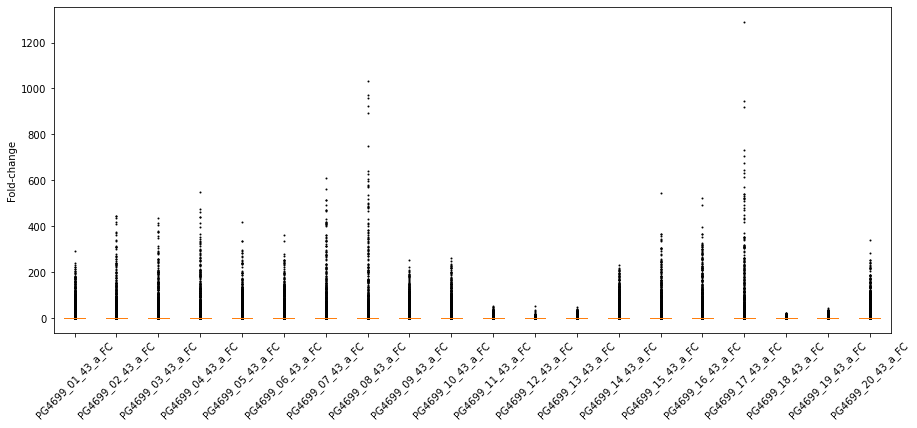

In [69]:
plt.figure(figsize=(15, 6))
flierprops = dict(markersize=1)
plt.boxplot(rep1.iloc[:, 1:], labels=rep1.iloc[:, 1:].columns, flierprops=flierprops)
plt.xticks(rotation=45)
plt.ylabel('Fold-change')
plt.show()

In [207]:
[rep1.iloc[:, 1], rep2.iloc[:, 1]]

[0         0.000000
 1         1.919182
 2         0.479795
 3         0.000000
 4         0.000000
             ...   
 106945    0.000000
 106946    0.959591
 106947    0.000000
 106948    0.000000
 106949    0.000000
 Name: PG4699_01_43_a_FC, Length: 106950, dtype: float64,
 0        0.000000
 1        0.000000
 2        0.000000
 3        0.000000
 4        0.000000
            ...   
 92605    0.000000
 92606    0.000000
 92607    0.000000
 92608    0.000000
 92609    3.028745
 Name: PG4699_21_44_a_FC, Length: 92610, dtype: float64]

In [212]:
val1 = []
for i in range(len(rep1.iloc[:, 1:].columns)):
    num = i+1
    data = rep1.iloc[:, num]
    val1.append(data)
val2 = []
for i in range(len(rep2.iloc[:, 1:].columns)):
    num = i+1
    data = rep2.iloc[:, num]
    val2.append(data)

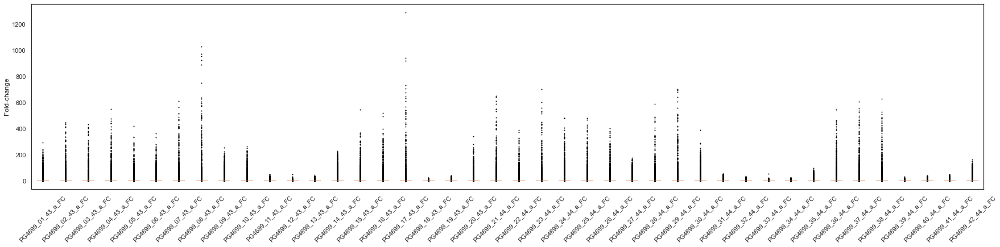

In [221]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1.iloc[:, 1:].columns.tolist() + rep2.iloc[:, 1:].columns.tolist()
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=45)
plt.ylabel('Fold-change')
plt.show()

In [86]:
file = 'A:/PROJECT/PG4699/000_DOC/L2891-17_AmpliconDNAconc.xlsx'
df = pd.read_excel(file)
sample_df = df.dropna(axis=1, how='all').dropna(axis=0).reset_index(drop=True)
sample_df.columns = sample_df.iloc[0, :]

In [87]:
sample_link = {}
n2_link = {}
for i in range(len(sample_df)):
    if str(sample_df.loc[i, 'Smaple']).isdigit():
        user_id = str(sample_df.loc[i, 'Sample'])
        sample_link[user_id] = sample_df.loc[i, 'Tisse']
        if n2_link.get(sample_df.loc[i, 'Tisse']):
            n2_link[sample_df.loc[i, 'Tisse']] += ',' + user_id
        else:
            n2_link[sample_df.loc[i, 'Tisse']] = user_id

In [88]:
df_sample = pd.DataFrame(list(sample_link.items()), columns=['サンプル名', '組織'])
df_n2 = pd.DataFrame(list(n2_link.items()), columns=['組織', 'サンプル名'])

In [90]:
outfile = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
with pd.ExcelWriter(outfile) as writer:
    df_sample.to_excel(writer, sheet_name='takaraID', index=False)
    df_n2.to_excel(writer, sheet_name='n2', index=False)

In [92]:
file = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
df_sample = pd.read_excel(file, sheet_name='takaraID')
df_n2 = pd.read_excel(file, sheet_name='n2')

In [93]:
df_sample.columns

Index(['Takara ID', 'サンプル名', '組織'], dtype='object')

In [111]:
takaraID = {}
sample = {}
tissue = {}
for i in range(len(df_sample)):
    tID = df_sample.loc[i, 'Takara ID']
    sNa = df_sample.loc[i, 'サンプル名']
    tNa = df_sample.loc[i, '組織']
    takaraID[tID] = sNa
    sample[sNa] = tID
    tissue[tID] = tNa

In [95]:
ID_join = []
for i in range(len(df_n2)):
    tmp = []
    sNa = df_n2.loc[i, 'サンプル名']
    names = sNa.split(',')
    for i in names:
        tmp.append(sample[i])
    IDs = ','.join(tmp)
    ID_join.append(IDs)

df_n2['Takara ID'] = pd.Series(ID_join)

In [99]:
df_n2

,組織,サンプル名,Takara ID
0,Brain-1,"101,201","PG4699_01_a,PG4699_21_a"
1,Brain-2,"102#2,202","PG4699_02_a,PG4699_22_a"
2,Brain-3,"103,203","PG4699_03_a,PG4699_23_a"
3,Brain-4,"104,204","PG4699_04_a,PG4699_24_a"
4,Brain-4_Cerebellum,"104c,204c","PG4699_05_a,PG4699_25_a"
5,Brain-5,"105,205","PG4699_06_a,PG4699_26_a"
6,Striatum,"106,206","PG4699_07_a,PG4699_27_a"
7,Thalamus,"108,208","PG4699_08_a,PG4699_28_a"
8,Cerebellum,"109#2,209","PG4699_09_a,PG4699_29_a"
9,Cortex,"110,210","PG4699_10_a,PG4699_30_a"


In [103]:
import openpyxl
import xlwt

In [109]:
outfile = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
with pd.ExcelWriter(outfile, engine='openpyxl', mode = 'a') as writer:
    df_n2.to_excel(writer, sheet_name='n2_mod', index=False)

In [112]:
tissue

{'PG4699_01_a': 'Brain-1',
 'PG4699_02_a': 'Brain-2',
 'PG4699_03_a': 'Brain-3',
 'PG4699_04_a': 'Brain-4',
 'PG4699_05_a': 'Brain-4_Cerebellum',
 'PG4699_06_a': 'Brain-5',
 'PG4699_07_a': 'Striatum',
 'PG4699_08_a': 'Thalamus',
 'PG4699_09_a': 'Cerebellum',
 'PG4699_10_a': 'Cortex',
 'PG4699_11_a': 'Lung',
 'PG4699_12_a': 'Liver',
 'PG4699_13_a': 'Kideny',
 'PG4699_14_a': 'Optic nerve',
 'PG4699_15_a': 'Cervical spinal cord',
 'PG4699_16_a': 'Thoracic spinal cord',
 'PG4699_17_a': 'Lumber spinal cord',
 'PG4699_18_a': 'Spleen',
 'PG4699_19_a': 'Pancreas',
 'PG4699_20_a': 'DRG',
 'PG4699_21_a': 'Brain-1',
 'PG4699_22_a': 'Brain-2',
 'PG4699_23_a': 'Brain-3',
 'PG4699_24_a': 'Brain-4',
 'PG4699_25_a': 'Brain-4_Cerebellum',
 'PG4699_26_a': 'Brain-5',
 'PG4699_27_a': 'Striatum',
 'PG4699_28_a': 'Thalamus',
 'PG4699_29_a': 'Cerebellum',
 'PG4699_30_a': 'Cortex',
 'PG4699_31_a': 'Heart',
 'PG4699_32_a': 'Lung',
 'PG4699_33_a': 'Liver',
 'PG4699_34_a': 'Kideny',
 'PG4699_35_a': 'Optic nerve'

In [113]:
print(FC_col_1)
print(FC_col_2)

['PG4699_01_43_a_FC', 'PG4699_02_43_a_FC', 'PG4699_03_43_a_FC', 'PG4699_04_43_a_FC', 'PG4699_05_43_a_FC', 'PG4699_06_43_a_FC', 'PG4699_07_43_a_FC', 'PG4699_08_43_a_FC', 'PG4699_09_43_a_FC', 'PG4699_10_43_a_FC', 'PG4699_11_43_a_FC', 'PG4699_12_43_a_FC', 'PG4699_13_43_a_FC', 'PG4699_14_43_a_FC', 'PG4699_15_43_a_FC', 'PG4699_16_43_a_FC', 'PG4699_17_43_a_FC', 'PG4699_18_43_a_FC', 'PG4699_19_43_a_FC', 'PG4699_20_43_a_FC']
['PG4699_21_44_a_FC', 'PG4699_22_44_a_FC', 'PG4699_23_44_a_FC', 'PG4699_24_44_a_FC', 'PG4699_25_44_a_FC', 'PG4699_26_44_a_FC', 'PG4699_27_44_a_FC', 'PG4699_28_44_a_FC', 'PG4699_29_44_a_FC', 'PG4699_30_44_a_FC', 'PG4699_31_44_a_FC', 'PG4699_32_44_a_FC', 'PG4699_33_44_a_FC', 'PG4699_34_44_a_FC', 'PG4699_35_44_a_FC', 'PG4699_36_44_a_FC', 'PG4699_37_44_a_FC', 'PG4699_38_44_a_FC', 'PG4699_39_44_a_FC', 'PG4699_40_44_a_FC', 'PG4699_41_44_a_FC', 'PG4699_42_44_a_FC']


In [270]:
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
df_rep2 = pd.read_excel(file, sheet_name='200-231')

In [177]:
Freq_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: Freq_col_1.append(cols)

Freq_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: Freq_col_2.append(cols)

In [271]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'FC' in cols: FC_col_1.append(cols)

FC_col_2 = []
for cols in df_rep2.columns:
    if 'FC' in cols: FC_col_2.append(cols)

In [178]:
df_crep1 = df_rep1.loc[:, Freq_col_1]
df_crep2 = df_rep2.loc[:, Freq_col_2]
print(df_crep1.shape)
print(df_crep2.shape)

(106950, 21)
(92610, 23)


In [273]:
df_crep1 = df_rep1.loc[:, FC_col_1]
df_crep2 = df_rep2.loc[:, FC_col_2]
print(df_crep1.shape)
print(df_crep2.shape)

(106950, 20)
(92610, 22)


In [274]:
df_crep1.head()

,PG4699_01_43_a_FC,PG4699_02_43_a_FC,PG4699_03_43_a_FC,PG4699_04_43_a_FC,PG4699_05_43_a_FC,PG4699_06_43_a_FC,PG4699_07_43_a_FC,PG4699_08_43_a_FC,PG4699_09_43_a_FC,PG4699_10_43_a_FC,PG4699_11_43_a_FC,PG4699_12_43_a_FC,PG4699_13_43_a_FC,PG4699_14_43_a_FC,PG4699_15_43_a_FC,PG4699_16_43_a_FC,PG4699_17_43_a_FC,PG4699_18_43_a_FC,PG4699_19_43_a_FC,PG4699_20_43_a_FC
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.0,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.0,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.0,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.0,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.0,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.0,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [180]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_Freq').search(name).group(1)
    takaraID = lotID
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_Freq').search(name).group(1)
    takaraID = lotID
    rep2_rename[name] = tissue[takaraID]

In [275]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [276]:
df_crep1 = df_crep1.rename(columns=rep1_rename)
df_crep2 = df_crep2.rename(columns=rep2_rename)

In [277]:
df_crep1

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.00000,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.000000,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.00000,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.000000,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.00000,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.000000,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.453624,0.0
106946,0.959591,0.000000,0.84913,0.000000,0.000000,1.043417,0.0,0.865404,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.778955,0.000000,0.000000,0.0
106947,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.191625,0.00000,0.000000,0.343318,0.000000,0.000000,0.000000,0.000000,2.419328,0.0
106948,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


<AxesSubplot:>

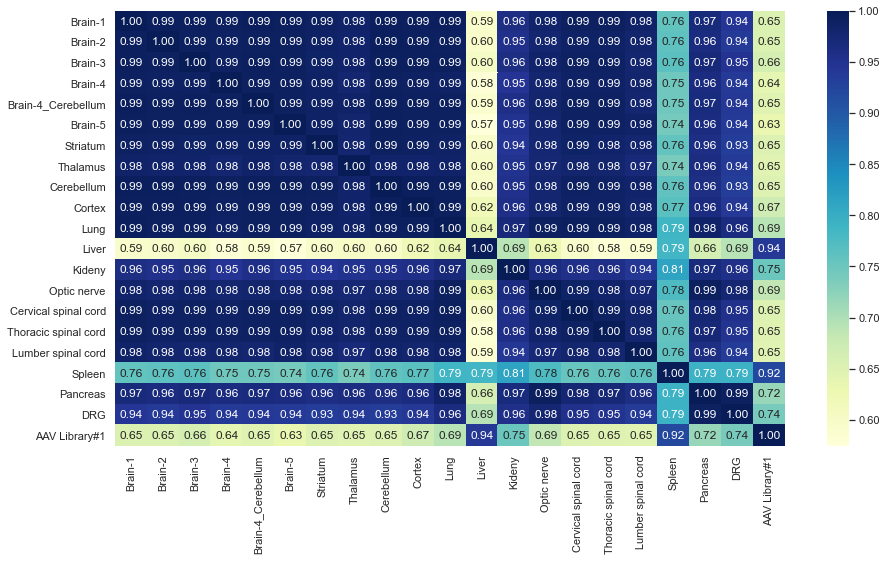

In [182]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep1.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

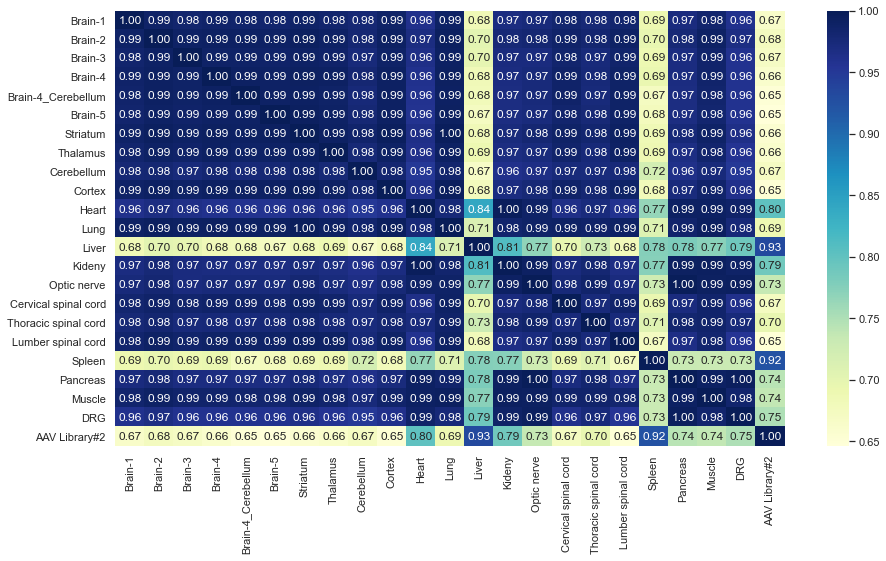

In [183]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [184]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

<AxesSubplot:>

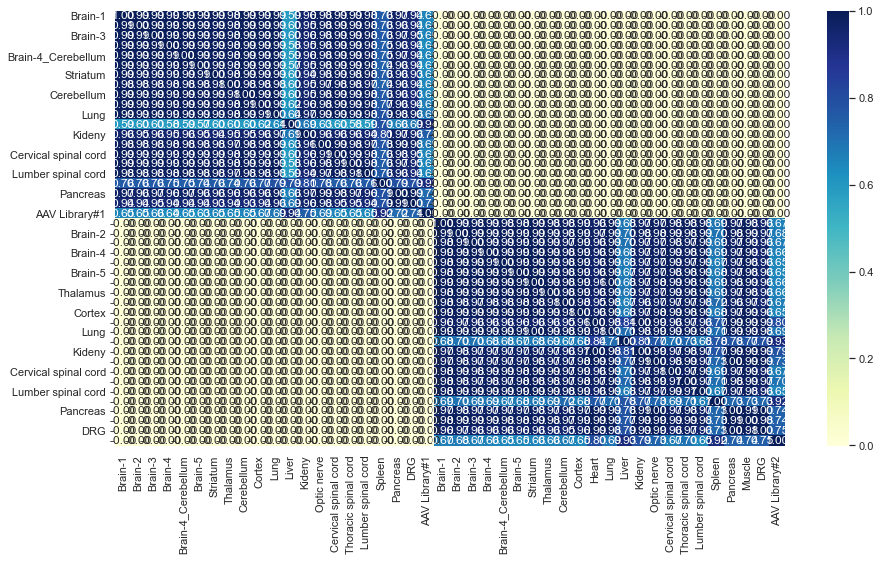

In [186]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep12.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

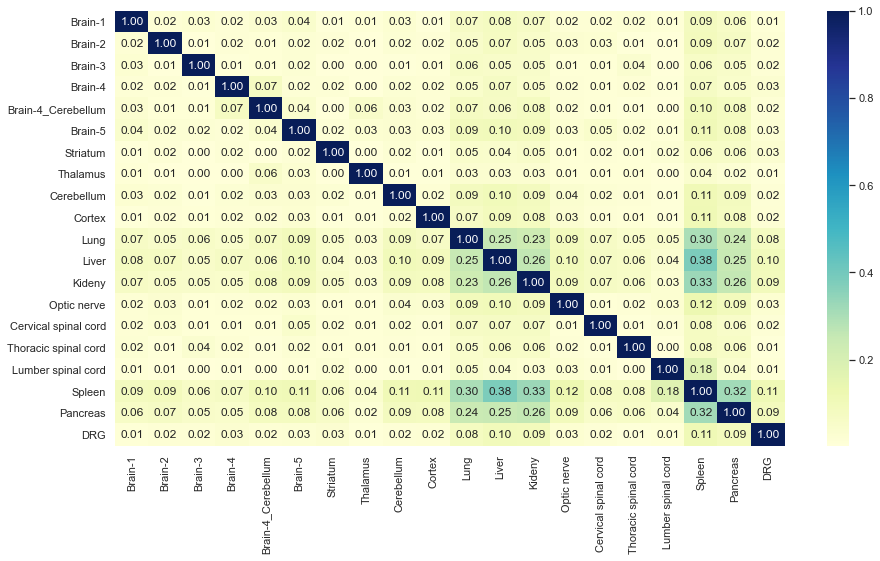

In [278]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep1.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

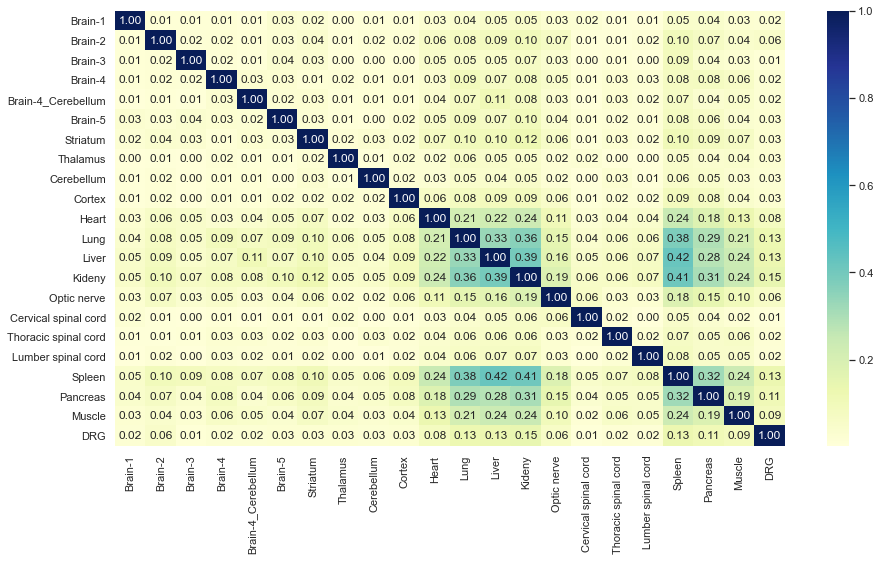

In [279]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [222]:
# 個体間で共通した配列
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
df_rep2 = pd.read_excel(file, sheet_name='200-231')

In [257]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: FC_col_1.append(cols)

FC_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: FC_col_2.append(cols)

In [258]:
FC_col_1

['PG4699_01_a_Freq',
 'PG4699_02_a_Freq',
 'PG4699_03_a_Freq',
 'PG4699_04_a_Freq',
 'PG4699_05_a_Freq',
 'PG4699_06_a_Freq',
 'PG4699_07_a_Freq',
 'PG4699_08_a_Freq',
 'PG4699_09_a_Freq',
 'PG4699_10_a_Freq',
 'PG4699_11_a_Freq',
 'PG4699_12_a_Freq',
 'PG4699_13_a_Freq',
 'PG4699_14_a_Freq',
 'PG4699_15_a_Freq',
 'PG4699_16_a_Freq',
 'PG4699_17_a_Freq',
 'PG4699_18_a_Freq',
 'PG4699_19_a_Freq',
 'PG4699_20_a_Freq',
 'PG4699_43_a_Freq']

In [260]:
df_crep1 = df_rep1.loc[:, FC_col_1]
df_crep2 = df_rep2.loc[:, FC_col_2]
# n = 1 の組織を除外　Heart: 31_a , Muscle: 41_a
df_crep2 = df_crep2.drop(['PG4699_31_a_Freq', 'PG4699_41_a_Freq'], axis=1)

In [261]:
print(df_crep1.shape)
print(df_crep2.shape)

(38618, 21)
(38618, 21)


In [243]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [262]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_a_Freq').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_a_Freq').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [263]:
print(rep1_rename)
print(rep2_rename)

{'PG4699_01_a_Freq': 'Brain-1', 'PG4699_02_a_Freq': 'Brain-2', 'PG4699_03_a_Freq': 'Brain-3', 'PG4699_04_a_Freq': 'Brain-4', 'PG4699_05_a_Freq': 'Brain-4_Cerebellum', 'PG4699_06_a_Freq': 'Brain-5', 'PG4699_07_a_Freq': 'Striatum', 'PG4699_08_a_Freq': 'Thalamus', 'PG4699_09_a_Freq': 'Cerebellum', 'PG4699_10_a_Freq': 'Cortex', 'PG4699_11_a_Freq': 'Lung', 'PG4699_12_a_Freq': 'Liver', 'PG4699_13_a_Freq': 'Kideny', 'PG4699_14_a_Freq': 'Optic nerve', 'PG4699_15_a_Freq': 'Cervical spinal cord', 'PG4699_16_a_Freq': 'Thoracic spinal cord', 'PG4699_17_a_Freq': 'Lumber spinal cord', 'PG4699_18_a_Freq': 'Spleen', 'PG4699_19_a_Freq': 'Pancreas', 'PG4699_20_a_Freq': 'DRG', 'PG4699_43_a_Freq': 'AAV Library#1'}
{'PG4699_21_a_Freq': 'Brain-1', 'PG4699_22_a_Freq': 'Brain-2', 'PG4699_23_a_Freq': 'Brain-3', 'PG4699_24_a_Freq': 'Brain-4', 'PG4699_25_a_Freq': 'Brain-4_Cerebellum', 'PG4699_26_a_Freq': 'Brain-5', 'PG4699_27_a_Freq': 'Striatum', 'PG4699_28_a_Freq': 'Thalamus', 'PG4699_29_a_Freq': 'Cerebellum', 

In [264]:
df_crep1 = df_crep1.rename(columns=rep1_rename)
df_crep2 = df_crep2.rename(columns=rep2_rename)

In [265]:
df_crep1.shape

(38618, 21)

In [266]:
df_crep2.shape

(38618, 21)

In [267]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

In [268]:
df_crep12.shape

(38618, 42)

<AxesSubplot:>

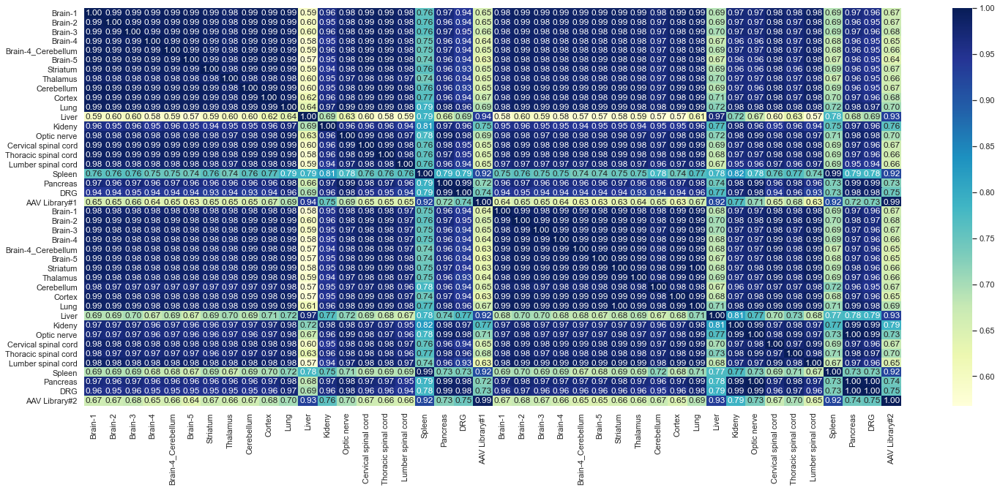

In [269]:
sns.set(rc = {'figure.figsize':(25,10)})
sns.heatmap(df_crep12.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [148]:
res = df_crep1.corrwith(df_crep2)

In [149]:
res

Brain-1                -0.001159
Brain-2                 0.017770
Brain-3                -0.001453
Brain-4                -0.001530
Brain-4_Cerebellum      0.003751
Brain-5                 0.022411
Striatum                0.018993
Thalamus               -0.001149
Cerebellum              0.001951
Cortex                  0.004357
Lung                    0.108489
Liver                   0.263428
Kideny                  0.092379
Optic nerve             0.023602
Cervical spinal cord    0.003276
Thoracic spinal cord    0.000517
Lumber spinal cord     -0.002404
Spleen                  0.146095
Pancreas                0.099919
DRG                     0.010217
dtype: float64

In [150]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

In [151]:
df_crep12

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,...,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
0,1.919182,73.724783,0.000000,1.620365,0.857747,0.000000,0.000000,2.596211,1.857897,1.737647,...,0.000000,1.142192,0.473433,0.466935,0.000000,0.441885,1.560097,1.854876,0.000000,0.000000
1,0.479795,1.755352,0.000000,0.810182,0.000000,1.043417,0.000000,0.000000,0.000000,2.172059,...,0.000000,1.142192,0.946866,0.000000,0.000000,0.000000,1.040065,0.927438,0.000000,1.954241
2,0.000000,0.000000,0.000000,0.810182,0.000000,1.043417,0.000000,0.000000,0.000000,0.868823,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.883770,1.040065,0.927438,0.000000,0.977120
3,0.959591,0.000000,0.000000,0.810182,1.715495,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.475713,0.000000,0.000000,1.867738,0.000000,0.883770,0.000000,0.000000,1.823009,0.000000
4,0.959591,0.000000,0.000000,0.810182,0.000000,3.130252,0.000000,1.730808,0.000000,1.737647,...,0.000000,1.142192,0.000000,0.311290,0.000000,0.294590,0.000000,0.000000,0.303835,0.325707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38613,0.479795,0.000000,0.000000,94.386239,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.737857,0.000000,2.367165,0.000000,0.873878,0.000000,0.000000,0.000000,0.911505,0.000000
38614,0.219037,3.497984,2.741212,0.132095,1.137447,1.757931,1.251424,9.190212,0.797684,0.500518,...,1.220490,0.990817,1.323331,2.812859,1.431897,0.063887,0.037593,1.005655,1.361766,2.436915
38615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.137061,0.123629,0.132707,0.000000,...,4.015523,1.142192,1.325612,2.614834,0.524327,0.000000,0.000000,0.741950,1.093805,0.000000
38616,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.927438,0.000000,0.000000


In [152]:
r = df_crep12.corr(method='pearson')

In [153]:
r

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,...,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
Brain-1,1.000000,0.020431,0.022017,0.011200,0.020400,0.045096,0.004767,0.007319,0.023915,0.003167,...,0.027379,0.028668,0.024262,0.008890,0.002436,-0.000935,0.029729,0.021206,0.012392,0.007541
Brain-2,0.020431,1.000000,0.001230,0.004275,0.007146,0.021620,0.011781,0.003261,0.011412,0.012521,...,0.034680,0.021207,0.045296,0.007831,0.004416,-0.002503,0.000142,0.013097,0.036839,0.016418
Brain-3,0.022017,0.001230,1.000000,0.004662,0.009008,0.023623,0.001863,0.001476,0.003990,0.000740,...,0.018801,0.018880,0.019463,0.012600,-0.002876,0.001257,0.003914,0.011714,0.009678,-0.002055
Brain-4,0.011200,0.004275,0.004662,1.000000,0.078174,0.011419,0.017361,0.000671,0.019185,0.018840,...,0.019962,0.000638,0.008473,0.013064,0.009255,0.020425,-0.002983,0.007122,0.006344,-0.002709
Brain-4_Cerebellum,0.020400,0.007146,0.009008,0.078174,1.000000,0.032033,0.000437,0.042617,0.033440,0.009608,...,0.021385,0.011859,0.021192,0.003144,0.000461,0.013674,-0.000534,0.020566,0.024752,0.028808
Brain-5,0.045096,0.021620,0.023623,0.011419,0.032033,1.000000,0.014734,0.030108,0.027576,0.019999,...,0.046936,0.034326,0.044542,0.022066,0.014809,0.004417,0.018208,0.031397,0.017855,0.010559
Striatum,0.004767,0.011781,0.001863,0.017361,0.000437,0.014734,1.000000,0.000196,0.029525,0.005729,...,0.029700,0.013468,0.022998,0.015369,-0.002243,0.002367,0.013697,0.036946,0.026854,0.010884
Thalamus,0.007319,0.003261,0.001476,0.000671,0.042617,0.030108,0.000196,1.000000,0.003399,0.005985,...,0.042371,0.014578,0.007421,0.002692,0.001679,0.003609,-0.001684,0.016903,0.033088,0.000842
Cerebellum,0.023915,0.011412,0.003990,0.019185,0.033440,0.027576,0.029525,0.003399,1.000000,0.014266,...,0.035871,0.033479,0.028940,0.006459,-0.003489,0.001551,0.008742,0.023755,0.022598,0.011265
Cortex,0.003167,0.012521,0.000740,0.018840,0.009608,0.019999,0.005729,0.005985,0.014266,1.000000,...,0.033701,0.029953,0.059594,0.006016,-0.002159,-0.003023,0.001773,0.022765,0.022077,0.001174


<AxesSubplot:>

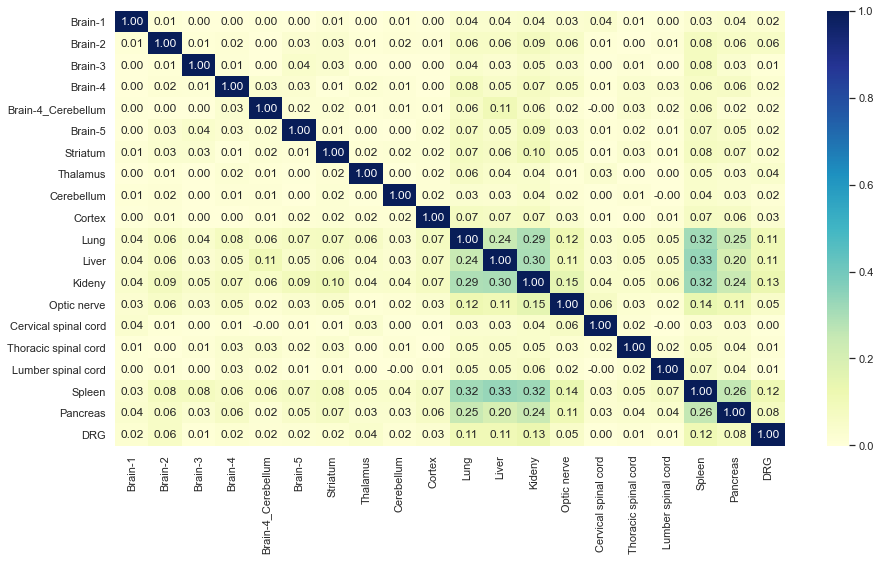

In [175]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

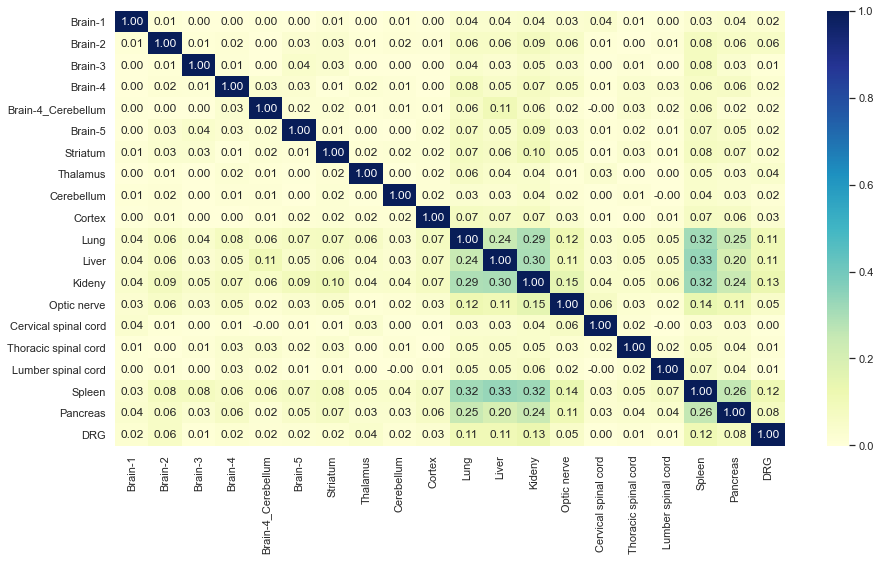

In [174]:
sns.set(rc = {'figure.figsize':(15, 8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [165]:
res=df_crep1.corrwith(df_crep2) 

In [173]:
res

Brain-1                -0.001159
Brain-2                 0.017770
Brain-3                -0.001453
Brain-4                -0.001530
Brain-4_Cerebellum      0.003751
Brain-5                 0.022411
Striatum                0.018993
Thalamus               -0.001149
Cerebellum              0.001951
Cortex                  0.004357
Lung                    0.108489
Liver                   0.263428
Kideny                  0.092379
Optic nerve             0.023602
Cervical spinal cord    0.003276
Thoracic spinal cord    0.000517
Lumber spinal cord     -0.002404
Spleen                  0.146095
Pancreas                0.099919
DRG                     0.010217
dtype: float64

<AxesSubplot:>

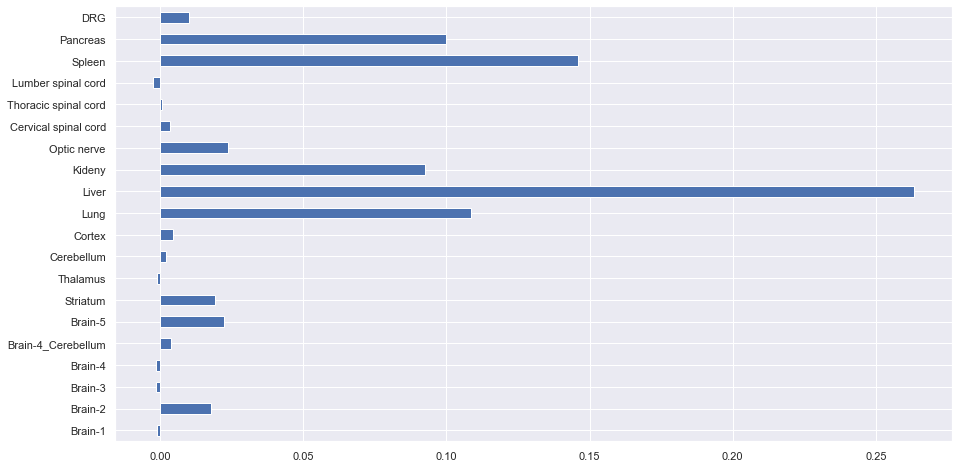

In [171]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
res.plot.barh()

## FDR値の修正(20220905) ---------

In [3]:
# 2群の比率の検定（両側検定）-> Bonfferroni法でFDR算出 ------------------
import sys
import numpy as np
import statsmodels.stats.multitest as multi
from statsmodels.stats.proportion import proportions_ztest
import scipy.stats as st

# カイ2乗分布による比率の差の検定(イェーツの補正あり) ---
# フィッシャーの正確確率検定では、
# サンプルサイズが増加するとp値の算出に時間がかかる
def chi2_to_fdr(x1, x2):
    x1_total = x1.sum()
    x2_total = x2.sum()
    pval = []
    for i in range(len(x1)):
        if (x1[i] == 0) | (x2[i] == 0):
            pval.append(1)
        else:
            x1u = x1_total - x1[i]
            x2u = x2_total - x2[i]
            _, p, _, _ = st.chi2_contingency(
                np.array([[x1[i], x2[i]], [x1u, x2u]]),
                correction=True
            )
            pval.append(p)
    
    fdr = multi.multipletests(
        pval,
        alpha=0.05,
        method='bonferroni'
    )
    x1x2_fdr = fdr[1]

    return x1x2_fdr

## カウント値から実行(220905) ------

In [4]:
#各サンプルで投与前と後を対応させるために、投与前で少なくとも1個存在する配列を対象にリストとしてまとまる。
file = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_count_summary.txt'
count_table = pd.read_csv(file, sep='\t')

In [5]:
# 個体1の配列カウントリスト(投与前で少なくとも1個存在する配列を対象)
rep1_a = count_table.loc[:, :'PG4699_20_a_Count']
rep1_b = count_table.loc[:, 'PG4699_43_a_Count']
rep1_cnt = pd.concat([rep1_a, rep1_b], axis=1)
print(rep1_cnt.shape) # fileteting前
rep1_count_table = rep1_cnt[rep1_cnt['PG4699_43_a_Count'] != 0].reset_index(drop=True)
print(rep1_count_table.shape) # filtering後
rep1_count_table.head()

(1664886, 24)
(106950, 24)


,Header_ID,Sequence,Reverse_complementary,PG4699_01_a_Count,PG4699_02_a_Count,PG4699_03_a_Count,PG4699_04_a_Count,PG4699_05_a_Count,PG4699_06_a_Count,PG4699_07_a_Count,...,PG4699_12_a_Count,PG4699_13_a_Count,PG4699_14_a_Count,PG4699_15_a_Count,PG4699_16_a_Count,PG4699_17_a_Count,PG4699_18_a_Count,PG4699_19_a_Count,PG4699_20_a_Count,PG4699_43_a_Count
0,Seq_1555,AAAAAGACGGGGGGTACTTGGGAGGCT,AGCCTCCCAAGTACCCCCCGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,Seq_2558,AAAAATAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTATTTTT,2.0,63.0,0.0,2.0,1.0,0.0,0.0,...,4.0,2.0,0.0,2.0,2.0,2.0,5.0,1.0,0.0,1.0
2,Seq_2981,AAAAATACTGGGTCTCAGTGGGAGGTG,CACCTCCCACTGAGACCCAGTATTTTT,1.0,3.0,0.0,2.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,4.0,2.0,0.0,1.0,0.0,2.0
3,Seq_3576,AAAAATGTGGGGAAGCAGTGGGAGTGT,ACACTCCCACTGCTTCCCCACATTTTT,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
4,Seq_5419,AAAACGCCGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCGGCGTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [6]:
# 個体2の配列カウントリスト(投与前で少なくとも1個存在する配列を対象)
rep2_info = count_table.loc[:, 'Header_ID':'Reverse_complementary']
rep2_tar = count_table.loc[:, 'PG4699_21_a_Count':'PG4699_42_a_Count']
rep2_a = pd.concat([rep2_info, rep2_tar], axis=1)
rep2_b = count_table.loc[:, 'PG4699_44_a_Count']
rep2_cnt = pd.concat([rep2_a, rep2_b], axis=1)
print(rep2_cnt.shape) # fileteting前
rep2_count_table = rep2_cnt[rep2_cnt['PG4699_44_a_Count'] != 0].reset_index(drop=True)
print(rep2_count_table.shape) # filtering後
rep2_count_table.head()

(1664886, 26)
(92610, 26)


,Header_ID,Sequence,Reverse_complementary,PG4699_21_a_Count,PG4699_22_a_Count,PG4699_23_a_Count,PG4699_24_a_Count,PG4699_25_a_Count,PG4699_26_a_Count,PG4699_27_a_Count,...,PG4699_34_a_Count,PG4699_35_a_Count,PG4699_36_a_Count,PG4699_37_a_Count,PG4699_38_a_Count,PG4699_39_a_Count,PG4699_40_a_Count,PG4699_41_a_Count,PG4699_42_a_Count,PG4699_44_a_Count
0,Seq_1059,AAAAAAGTTGGGAATCAGTGGGAGTGT,ACACTCCCACTGATTCCCAACTTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,Seq_1484,AAAAAGAATGGGATGAATTGGGAGTCT,AGACTCCCAATTCATCCCATTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,Seq_1487,AAAAAGAATGGGCAGAATTGGGAGAGT,ACTCTCCCAATTCTGCCCATTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,Seq_1587,AAAAAGACTGGGCAGACATGGGAGAGG,CCTCTCCCATGTCTGCCCAGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,Seq_1594,AAAAAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,1.0,0.0,2.0,0.0,0.0,3.0,3.0


In [7]:
# rep1_freqの算出
for i in rep1_count_table.columns[3:].to_list():
    name = re.compile(r'(.*)_Count').search(i).group(1)
    freq = name + "_Freq"
    rep1_count_table[freq] = rep1_count_table[i] / rep1_count_table[i].sum()
print(rep1_count_table.shape)
rep1_count_table.head()

(106950, 45)


,Header_ID,Sequence,Reverse_complementary,PG4699_01_a_Count,PG4699_02_a_Count,PG4699_03_a_Count,PG4699_04_a_Count,PG4699_05_a_Count,PG4699_06_a_Count,PG4699_07_a_Count,...,PG4699_12_a_Freq,PG4699_13_a_Freq,PG4699_14_a_Freq,PG4699_15_a_Freq,PG4699_16_a_Freq,PG4699_17_a_Freq,PG4699_18_a_Freq,PG4699_19_a_Freq,PG4699_20_a_Freq,PG4699_43_a_Freq
0,Seq_1555,AAAAAGACGGGGGGTACTTGGGAGGCT,AGCCTCCCAAGTACCCCCCGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07
1,Seq_2558,AAAAATAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTATTTTT,2.0,63.0,0.0,2.0,1.0,0.0,0.0,...,0.000003,0.000001,0.0,1.582847e-06,0.000001,0.000001,0.000003,6.176050e-07,0.0,6.807454e-07
2,Seq_2981,AAAAATACTGGGTCTCAGTGGGAGGTG,CACCTCCCACTGAGACCCAGTATTTTT,1.0,3.0,0.0,2.0,0.0,2.0,0.0,...,0.000000,0.000000,0.0,0.000000e+00,0.000002,0.000001,0.000000,6.176050e-07,0.0,1.361491e-06
3,Seq_3576,AAAAATGTGGGGAAGCAGTGGGAGTGT,ACACTCCCACTGCTTCCCCACATTTTT,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,7.914235e-07,0.000000,0.000000,0.000000,6.176050e-07,0.0,6.807454e-07
4,Seq_5419,AAAACGCCGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCGGCGTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07


In [8]:
# rep2_freqの算出
for i in rep2_count_table.columns[3:].to_list():
    name = re.compile(r'(.*)_Count').search(i).group(1)
    freq = name + "_Freq"
    rep2_count_table[freq] = rep2_count_table[i] / rep2_count_table[i].sum()
print(rep2_count_table.shape)
rep2_count_table.head()

(92610, 49)


,Header_ID,Sequence,Reverse_complementary,PG4699_21_a_Count,PG4699_22_a_Count,PG4699_23_a_Count,PG4699_24_a_Count,PG4699_25_a_Count,PG4699_26_a_Count,PG4699_27_a_Count,...,PG4699_34_a_Freq,PG4699_35_a_Freq,PG4699_36_a_Freq,PG4699_37_a_Freq,PG4699_38_a_Freq,PG4699_39_a_Freq,PG4699_40_a_Freq,PG4699_41_a_Freq,PG4699_42_a_Freq,PG4699_44_a_Freq
0,Seq_1059,AAAAAAGTTGGGAATCAGTGGGAGTGT,ACACTCCCACTGATTCCCAACTTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,7.129067e-07
1,Seq_1484,AAAAAGAATGGGATGAATTGGGAGTCT,AGACTCCCAATTCATCCCATTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,7.129067e-07
2,Seq_1487,AAAAAGAATGGGCAGAATTGGGAGAGT,ACTCTCCCAATTCTGCCCATTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,7.129067e-07
3,Seq_1587,AAAAAGACTGGGCAGACATGGGAGAGG,CCTCTCCCATGTCTGCCCAGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,7.129067e-07
4,Seq_1594,AAAAAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000002,0.0,6.300455e-07,0.0,0.000001,0.0,0.0,0.000002,2.138720e-06


In [15]:
# FCとFDRを算出
before_1 = 'PG4699_43_a_Count'
before_2 = 'PG4699_44_a_Count'

#fcfdr_table = pd.DataFrame()
for i, name in enumerate(count_table.columns[3:count_table.shape[1]-2].to_list()):
    a = re.compile(r'(PG.*)_a_Count').search(name).group(1)
    name_freq = name
    if i < 20:
        print(f'{name_freq} vs {before_1}')
        b = '43_a'
        after = rep1_count_table[name_freq]
        before = rep1_count_table[before_1]
        #before_mod = freq_df[before_1].replace(0, sys.maxsize) # nan防止
        FC_name =  a + '_' + b + '_FC'
        FDR_name = a + '_' + b + '_FDR'
        print(f'{FC_name}')
        print(f'{FDR_name}')
        rep1_count_table[FC_name] = after / before
        rep1_count_table[FDR_name] = chi2_to_fdr(before, after)
    else:
        print(f'{name_freq} vs {before_2}')
        b = '44_a'
        after = rep2_count_table[name_freq]
        before = rep2_count_table[before_2]
        #before_mod = freq_df[before_2].replace(0, sys.maxsize) # nan防止
        FC_name =  a + '_' + b + '_FC'
        FDR_name = a + '_' + b + '_FDR'
        print(f'{FC_name}')
        print(f'{FDR_name}')
        rep2_count_table[FC_name] = after / before
        rep2_count_table[FDR_name] = chi2_to_fdr(before, after)

PG4699_01_a_Count vs PG4699_43_a_Count
PG4699_01_43_a_FC
PG4699_01_43_a_FDR
PG4699_02_a_Count vs PG4699_43_a_Count
PG4699_02_43_a_FC
PG4699_02_43_a_FDR
PG4699_03_a_Count vs PG4699_43_a_Count
PG4699_03_43_a_FC
PG4699_03_43_a_FDR
PG4699_04_a_Count vs PG4699_43_a_Count
PG4699_04_43_a_FC
PG4699_04_43_a_FDR
PG4699_05_a_Count vs PG4699_43_a_Count
PG4699_05_43_a_FC
PG4699_05_43_a_FDR
PG4699_06_a_Count vs PG4699_43_a_Count
PG4699_06_43_a_FC
PG4699_06_43_a_FDR
PG4699_07_a_Count vs PG4699_43_a_Count
PG4699_07_43_a_FC
PG4699_07_43_a_FDR
PG4699_08_a_Count vs PG4699_43_a_Count
PG4699_08_43_a_FC
PG4699_08_43_a_FDR
PG4699_09_a_Count vs PG4699_43_a_Count
PG4699_09_43_a_FC
PG4699_09_43_a_FDR
PG4699_10_a_Count vs PG4699_43_a_Count
PG4699_10_43_a_FC
PG4699_10_43_a_FDR
PG4699_11_a_Count vs PG4699_43_a_Count
PG4699_11_43_a_FC
PG4699_11_43_a_FDR
PG4699_12_a_Count vs PG4699_43_a_Count
PG4699_12_43_a_FC
PG4699_12_43_a_FDR
PG4699_13_a_Count vs PG4699_43_a_Count
PG4699_13_43_a_FC
PG4699_13_43_a_FDR
PG4699_14_a_

In [16]:
rep1_count_table

,Header_ID,Sequence,Reverse_complementary,PG4699_01_a_Count,PG4699_02_a_Count,PG4699_03_a_Count,PG4699_04_a_Count,PG4699_05_a_Count,PG4699_06_a_Count,PG4699_07_a_Count,...,PG4699_16_43_a_FC,PG4699_16_43_a_FDR,PG4699_17_43_a_FC,PG4699_17_43_a_FDR,PG4699_18_43_a_FC,PG4699_18_43_a_FDR,PG4699_19_43_a_FC,PG4699_19_43_a_FDR,PG4699_20_43_a_FC,PG4699_20_43_a_FDR
0,Seq_1555,AAAAAGACGGGGGGTACTTGGGAGGCT,AGCCTCCCAAGTACCCCCCGTCTTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.000000,1.0,0.0,1.0
1,Seq_2558,AAAAATAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTATTTTT,2.0,63.0,0.0,2.0,1.0,0.0,0.0,...,2.0,1.0,2.0,1.0,5.0,1.0,1.000000,1.0,0.0,1.0
2,Seq_2981,AAAAATACTGGGTCTCAGTGGGAGGTG,CACCTCCCACTGAGACCCAGTATTTTT,1.0,3.0,0.0,2.0,0.0,2.0,0.0,...,2.0,1.0,1.0,1.0,0.0,1.0,0.500000,1.0,0.0,1.0
3,Seq_3576,AAAAATGTGGGGAAGCAGTGGGAGTGT,ACACTCCCACTGCTTCCCCACATTTTT,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,1.000000,1.0,0.0,1.0
4,Seq_5419,AAAACGCCGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCGGCGTTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.000000,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,Seq_10752376,TTTTTGTCGGGGGTTGAGTGGGAGGCT,AGCCTCCCACTCAACCCCCGACAAAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.500000,1.0,0.0,1.0
106946,Seq_10752392,TTTTTGTCTGGGAATAATTGGGAGATG,CATCTCCCAATTATTCCCAGACAAAAA,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,2.0,1.0,0.0,1.0,0.000000,1.0,0.0,1.0
106947,Seq_10752402,TTTTTGTCTGGGACTACTTGGGAGACT,AGTCTCCCAAGTAGTCCCAGACAAAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,2.666667,1.0,0.0,1.0
106948,Seq_10752795,TTTTTTGGGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCCCAAAAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.000000,1.0,0.0,1.0


In [17]:
# output xlsx
#各サンプルで投与前後を対応させるために、投与前で少なくとも1個存在する配列を対象に個体別でリストとしてまとまる。
outfile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_count_table.to_excel(writer, sheet_name='100-131', index=False)
    rep2_count_table.to_excel(writer, sheet_name='200-231', index=False)

In [18]:
# 共通Seq
common_seq = list(set(rep1_count_table['Header_ID']) & set(rep2_count_table['Header_ID']))
print(len(common_seq))

38618


In [19]:
# 個体間で共通する配列リストの作成
common_idx_rep1 = sorted([rep1_count_table[rep1_count_table['Header_ID'] == seqID].index[0] for seqID in common_seq])
rep1_common = rep1_count_table.loc[common_idx_rep1, :]
common_idx_rep2 = sorted([rep2_count_table[rep2_count_table['Header_ID'] == seqID].index[0] for seqID in common_seq])
rep2_common = rep2_count_table.loc[common_idx_rep2, :]

In [20]:
# output xlsx
outfile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency_2.xlsx'
outfile = '/NGSWORK/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_common.to_excel(writer, sheet_name='100-131', index=False)
    rep2_common.to_excel(writer, sheet_name='200-231', index=False)

### 再解析(20220907) --------

In [6]:
infile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df1 = pd.read_excel(infile, sheet_name='100-131')
df2 = pd.read_excel(infile, sheet_name='200-231')

In [7]:
df1.head()

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
0,Seq_330,AAAAAAAATGGGAAGAAATGGGATTAT,ATAATCCCATTTCTTCCCATTTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
1,Seq_423,AAAAAAACAGGGGTTAACTGGTATATC,GATATACCAGTTAACCCCTGTTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2,Seq_519,AAAAAAACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTTTTTTT,1,1,0,0,0,0,1,...,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,Seq_923,AAAAAAGAGGGGACGCCATGGCCTTCT,AGAAGGCCATGGCGTCCCCTCTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4,Seq_1025,AAAAAAGGGGGGGAGGATTGGGGGCGG,CCGCCCCCAATCCTCCCCCCCTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [8]:
df2.head()

,Header_ID,Sequence,Reverse_complementary,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,Seq_238,AAAAAAAAGGGGAAAAACTGGTAGTAT,ATACTACCAGTTTTTCCCCTTTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
1,Seq_342,AAAAAAAATGGGTCTGCTTGGTATTCG,CGAATACCAAGCAGACCCATTTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2,Seq_1036,AAAAAAGGTGGGAAATATTGGACTACA,TGTAGTCCAATATTTCCCACCTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,Seq_1059,AAAAAAGTTGGGAATCAGTGGGAGTGT,ACACTCCCACTGATTCCCAACTTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4,Seq_1371,AAAAACGGCGGGTAGGATTGGGGGCGT,ACGCCCCCAATCCTACCCGCCGTTTTT,0,0,0,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [10]:
# rep1 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
FC_col_1 = []
for cols in df1.columns:
    if 'FC' in cols: FC_col_1.append(cols)
info = df1.loc[:, 'Header_ID']
freq = df1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

# rep2 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
FC_col_2 = []
for cols in df2.columns:
    if 'FC' in cols: FC_col_2.append(cols)
info = df2.loc[:, 'Header_ID']
freq = df2.loc[:, FC_col_2]
rep2 = pd.concat([info, freq], axis=1)

In [12]:
rep1.shape

(606273, 21)

In [14]:
rep1.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_330,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Seq_423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Seq_519,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Seq_923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Seq_1025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
rep2.shape

(522929, 23)

In [15]:
rep2.head()

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,Seq_238,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Seq_342,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Seq_1036,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Seq_1059,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Seq_1371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
z_rep1 = st.zscore(rep1.iloc[:, 1:], axis=1, ddof=1)
z_rep2 = st.zscore(rep2.iloc[:, 1:], axis=1, ddof=1)

In [18]:
print(z_rep1.shape)
print(z_rep2.shape)

(606273, 20)
(522929, 22)


In [21]:
z_val = pd.DataFrame(z_rep1)
z_val.columns = FC_col_1
rep1_z = pd.concat([rep1.iloc[:, 0], z_val], axis=1)
z_val = pd.DataFrame(z_rep2)
z_val.columns = FC_col_2
rep2_z = pd.concat([rep2.iloc[:, 0], z_val], axis=1)

In [25]:
# 比較対象とはならない欠損値がある行、配列は調査外とする
z_rep1_m = rep1_z.dropna().reset_index(drop=True)
z_rep2_m = rep2_z.dropna().reset_index(drop=True)

In [26]:
print(z_rep1_m.shape)
print(z_rep2_m.shape)

(351784, 21)
(332840, 23)


In [27]:
z_rep1_m.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_519,1.949359,1.949359,-0.487340,-0.487340,-0.487340,-0.487340,1.949359,-0.487340,-0.487340,...,-0.487340,-0.487340,-0.487340,-0.487340,-0.487340,-0.487340,1.949359,-0.487340,-0.487340,-0.487340
1,Seq_1760,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
2,Seq_1851,2.320201,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,...,-0.409447,-0.409447,2.320201,-0.409447,2.320201,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447
3,Seq_2021,-0.562731,1.688194,1.688194,1.688194,-0.562731,-0.562731,1.688194,-0.562731,-0.562731,...,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,1.688194,-0.562731,-0.562731
4,Seq_2022,-0.463674,0.424212,-0.365020,-0.266366,-0.069058,-0.266366,-0.069058,-0.365020,-0.463674,...,-0.562328,2.002676,-0.660982,-0.365020,-0.167712,0.029596,-0.660982,3.482486,-0.463674,-0.365020


In [28]:
outfile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency_Zscore.xlsx'
with pd.ExcelWriter(outfile) as writer:
    z_rep1_m.to_excel(writer, sheet_name='100-131', index=False)
    z_rep2_m.to_excel(writer, sheet_name='200-231', index=False)

In [29]:
# common sequence between rep1 and rep2
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency.xlsx'

df_rep1 = pd.read_excel(file, sheet_name='100-131')
FC_col_1 = []
for cols in df_rep1.columns:
    if 'FC' in cols: FC_col_1.append(cols)
info = df_rep1.loc[:, 'Header_ID']
freq = df_rep1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

df_rep2 = pd.read_excel(file, sheet_name='200-231')
FC_col_2 = []
for cols in df_rep2.columns:
    if 'FC' in cols: FC_col_2.append(cols)
freq = df_rep2.loc[:, FC_col_2]
rep12 = pd.concat([rep1, freq], axis=1)

In [31]:
rep12.shape

(216695, 43)

In [32]:
rep12.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,Seq_2022,0.217391,0.608696,0.26087,0.304348,0.391304,0.304348,0.391304,0.260870,0.217391,...,1.1875,0.625,0.125,0.375,0.375,0.375,1.375,0.375,0.125,0.25
1,Seq_2201,0.000000,0.333333,0.00000,0.333333,0.000000,0.000000,0.000000,0.666667,0.666667,...,1.0000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.00
2,Seq_2558,2.000000,63.000000,0.00000,2.000000,1.000000,0.000000,0.000000,3.000000,2.000000,...,1.0000,0.500,0.500,0.000,0.500,1.500,2.000,0.000,5.000,0.00
3,Seq_2844,0.000000,0.000000,0.00000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.0000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00
4,Seq_2981,0.500000,1.500000,0.00000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,1.0000,1.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,2.00


In [34]:
# common sequence between rep1 and rep2
# zscore ---
z_rep12 = st.zscore(rep12.iloc[:, 1:], axis=1,  ddof=1)
z_val = pd.DataFrame(z_rep12)
z_val.columns = FC_col_1 + FC_col_2
rep12_z = pd.concat([rep12.iloc[:, 0], z_val], axis=1)
z_rep12_cm = rep12_z.dropna().reset_index(drop=True)

In [37]:
z_rep12_cm.shape

(211239, 43)

In [35]:
z_rep12_cm.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,Seq_2022,-0.602664,0.420613,-0.488967,-0.375269,-0.147874,-0.375269,-0.147874,-0.488967,-0.602664,...,1.934211,0.463250,-0.844272,-0.190511,-0.190511,-0.190511,2.424531,-0.190511,-0.844272,-0.517391
1,Seq_2201,-0.634737,0.015481,-0.634737,0.015481,-0.634737,-0.634737,-0.634737,0.665700,0.665700,...,1.315919,1.315919,-0.634737,-0.634737,-0.634737,1.315919,-0.634737,-0.634737,1.315919,-0.634737
2,Seq_2558,-0.074287,6.269804,-0.282290,-0.074287,-0.178288,-0.282290,-0.282290,0.029715,-0.074287,...,-0.178288,-0.230289,-0.230289,-0.282290,-0.230289,-0.126288,-0.074287,-0.282290,0.237718,-0.282290
3,Seq_2844,-0.320557,-0.320557,-0.320557,3.045293,3.045293,-0.320557,-0.320557,-0.320557,-0.320557,...,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557,-0.320557
4,Seq_2981,-0.196624,1.179744,-0.884808,0.491560,-0.884808,0.491560,-0.884808,-0.884808,-0.884808,...,0.491560,0.491560,-0.884808,-0.884808,-0.884808,0.491560,0.491560,-0.884808,0.491560,1.867928


In [38]:
outfile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency_Zscore.xlsx'
with pd.ExcelWriter(outfile) as writer:
    z_rep12_cm.to_excel(writer, sheet_name='common', index=False)

In [40]:
sample_1 = []
for i in z_rep1_m['Header_ID']:
    idx = re.compile(r'Seq_(.*)').search(i).group(1)
    sample_1.append(int(idx))

sample_2 = []
for i in z_rep2_m['Header_ID']:
    idx = re.compile(r'Seq_(.*)').search(i).group(1)
    sample_2.append(int(idx))

In [41]:
x = FC_col_1
y = sample_1
outdir = 'A:/PROJECT/PG4699/200_INFO/03_ratio'

fig = go.Figure(
    data=go.Heatmap(
        colorbar=dict(
            title='z-score'
        ),
        z=z_rep1_m.loc[:, x],
        x=x,
        y=y,
        colorscale='Viridis'
    )
)

fig.update_xaxes(title='Sample(normalized)')
fig.update_yaxes(title='Seq_ID')

fig.update_layout(
    title='heatmap',
    xaxis_nticks=36)

htmlfile = os.path.join(
    outdir,
    'PG4699_rep1_heatmap.html'
)
fig.write_html(htmlfile)

NameError: name 'go' is not defined

In [61]:
z_rep1_m.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_519,1.949359,1.949359,-0.487340,-0.487340,-0.487340,-0.487340,1.949359,-0.487340,-0.487340,...,-0.487340,-0.487340,-0.487340,-0.487340,-0.487340,-0.487340,1.949359,-0.487340,-0.487340,-0.487340
1,Seq_1760,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
2,Seq_1851,2.320201,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447,...,-0.409447,-0.409447,2.320201,-0.409447,2.320201,-0.409447,-0.409447,-0.409447,-0.409447,-0.409447
3,Seq_2021,-0.562731,1.688194,1.688194,1.688194,-0.562731,-0.562731,1.688194,-0.562731,-0.562731,...,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,-0.562731,1.688194,-0.562731,-0.562731
4,Seq_2022,-0.463674,0.424212,-0.365020,-0.266366,-0.069058,-0.266366,-0.069058,-0.365020,-0.463674,...,-0.562328,2.002676,-0.660982,-0.365020,-0.167712,0.029596,-0.660982,3.482486,-0.463674,-0.365020


In [65]:
z_rep1_m.shape

(351784, 21)

In [117]:
z_rep1_m[
    (z_rep1_m['Brain-1#1_FC'] > 0) & 
    (z_rep1_m['Brain-2#1_FC'] > 0) & 
    (z_rep1_m['Brain-3#1_FC'] > 0) & 
    (z_rep1_m['Brain-4#1_FC'] > 0) & 
    (z_rep1_m['Brain-4_Cerebellum#1_FC'] > 0) & 
    (z_rep1_m['Brain-5#1_FC'] > 0) &
    (z_rep1_m['Striatum#1_FC'] > 0) & 
    (z_rep1_m['Thalamus#1_FC'] > 0) &
    (z_rep1_m['Cerebellum#1_FC'] > 0) &
    (z_rep1_m['Cortex#1_FC'] > 0)
]

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
74746,Seq_2304916,0.260494,0.260494,0.260494,0.260494,0.260494,0.260494,2.865434,1.562964,0.260494,...,-1.041976,0.260494,0.260494,-1.041976,-1.041976,-1.041976,-1.041976,0.260494,-1.041976,-1.041976
154097,Seq_4742855,0.171410,0.171410,0.171410,0.171410,0.171410,0.171410,0.171410,2.456879,1.314145,...,-0.971324,1.314145,0.171410,-0.971324,-0.971324,-0.971324,-0.971324,-0.971324,-0.971324,-0.971324
323882,Seq_9993146,0.109660,0.109660,1.206260,0.109660,0.109660,0.109660,2.302860,0.109660,0.109660,...,0.109660,-0.986940,0.109660,0.109660,-0.986940,-0.986940,-0.986940,-0.986940,-0.986940,-0.986940


In [88]:
z_rep1_sel = z_rep1_m[
    (z_rep1_m['Brain-1#1_FC'] > 0) & 
    (z_rep1_m['Brain-2#1_FC'] > 0) & 
    (z_rep1_m['Brain-3#1_FC'] > 0) & 
    (z_rep1_m['Brain-4#1_FC'] > 0) & 
    (z_rep1_m['Brain-4_Cerebellum#1_FC'] > 0) & 
    (z_rep1_m['Brain-5#1_FC'] > 0) &
    (z_rep1_m['Striatum#1_FC'] > 0) & 
    (z_rep1_m['Thalamus#1_FC'] > 0) &
    (z_rep1_m['Cerebellum#1_FC'] > 0) &
    (z_rep1_m['Cortex#1_FC'] > 0)
]

In [110]:
z_rep1_sel['Header_ID']

74746     Seq_2304916
154097    Seq_4742855
323882    Seq_9993146
Name: Header_ID, dtype: object

In [113]:
rep1.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_2022,0.217391,0.608696,0.26087,0.304348,0.391304,0.304348,0.391304,0.260870,0.217391,...,0.173913,1.304348,0.130435,0.260870,0.347826,0.434783,0.130435,1.956522,0.217391,0.26087
1,Seq_2201,0.000000,0.333333,0.00000,0.333333,0.000000,0.000000,0.000000,0.666667,0.666667,...,0.333333,0.333333,0.333333,0.333333,0.000000,0.333333,0.000000,0.666667,0.000000,0.00000
2,Seq_2558,2.000000,63.000000,0.00000,2.000000,1.000000,0.000000,0.000000,3.000000,2.000000,...,2.000000,4.000000,2.000000,0.000000,2.000000,2.000000,2.000000,5.000000,1.000000,0.00000
3,Seq_2844,0.000000,0.000000,0.00000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
4,Seq_2981,0.500000,1.500000,0.00000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.500000,0.00000


In [114]:
df1[df1['Header_ID'] == 'Seq_2304916']

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
129889,Seq_2304916,ACTTCTCATGGGACGGATTGGTCTCTG,CAGAGACCAATCCGTCCCATGAGAAGT,1,1,1,1,1,1,3,...,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0


In [115]:
df1[df1['Header_ID'] == 'Seq_4742855']

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
265219,Seq_4742855,CCGGATCTTGGGAATTCTTGGTCTAAG,CTTAGACCAAGAATTCCCAAGATCCGG,1,1,1,1,1,1,1,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [118]:
df1[df1['Header_ID'] == 'Seq_9993146']

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
559966,Seq_9993146,TCTAATGTTGGGCATAATTGGGCGGAT,ATCCGCCCAATTATGCCCAACATTAGA,1,1,2,1,1,1,3,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [116]:
z_rep2_m[
    (z_rep2_m['Brain-1#2_FC'] > 0) & 
    (z_rep2_m['Brain-2#2_FC'] > 0) & 
    (z_rep2_m['Brain-3#2_FC'] > 0) & 
    (z_rep2_m['Brain-4#2_FC'] > 0) & 
    (z_rep2_m['Brain-4_Cerebellum#2_FC'] > 0) & 
    (z_rep2_m['Brain-5#2_FC'] > 0) &
    (z_rep2_m['Striatum#2_FC'] > 0) & 
    (z_rep2_m['Thalamus#2_FC'] > 0) &
    (z_rep2_m['Cerebellum#2_FC'] > 0) &
    (z_rep2_m['Cortex#2_FC'] > 0) &
    (z_rep2_m['Lung#2_FC'] < 0) &
    (z_rep2_m['Liver#2_FC'] < 0) &
    (z_rep2_m['Kidney#2_FC'] < 0)
]

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
68421,Seq_2290127,0.383805,1.228176,2.072548,1.228176,0.383805,1.228176,0.383805,1.228176,0.383805,...,-1.304938,-1.304938,-1.304938,-1.304938,-0.460566,0.383805,-0.460566,-1.304938,-0.460566,-0.460566
142983,Seq_4716308,0.394590,0.818052,0.376267,0.683684,0.294832,1.227263,0.121782,0.400697,2.440644,...,-1.417339,-0.682388,-0.311859,-1.861160,0.942240,0.547280,-1.144532,-0.851366,-0.234496,-1.077348


In [119]:
df2[df2['Header_ID'] == 'Seq_2290127']

,Header_ID,Sequence,Reverse_complementary,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
109653,Seq_2290127,ACTTCGGGTGGGCCTAATTGGGATCTG,CAGATCCCAATTAGGCCCACCCGAAGT,3,4,5,4,3,4,3,...,3.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0


In [120]:
df2[df2['Header_ID'] == 'Seq_4716308']

,Header_ID,Sequence,Reverse_complementary,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
226279,Seq_4716308,CCGGATATGGGGTCTTCTTGGTCTCAG,CTGAGACCAAGAAGACCCCATATCCGG,1248,1456,1239,1390,1199,1657,1114,...,3.349367,6.401869e-108,1.24557,1.0,1.610127,1.0,2.377215,1.338711e-25,1.329114,1.0


In [347]:
rep1_sel = df1[
    (df1['Brain-1#1_Count'] >= 10) & 
    (df1['Brain-2#1_Count'] >= 10) & 
    (df1['Brain-3#1_Count'] >= 10) & 
    (df1['Brain-4#1_Count'] >= 10) & 
    (df1['Brain-4_Cerebellum#1_Count'] >= 10) & 
    (df1['Brain-5#1_Count'] >= 10) &
    (df1['Striatum#1_Count'] >= 10) & 
    (df1['Thalamus#1_Count'] >= 10) &
    (df1['Cerebellum#1_Count'] >= 10) &
    (df1['Cortex#1_Count'] >= 10)
]

In [348]:
rep1_sel

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
79,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,54,67,55,74,83,92,83,...,1.307692,1.000000e+00,1.250000,1.000000e+00,1.596154,1.000000e+00,0.673077,1.000000e+00,0.788462,1.000000e+00
143,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,28,34,33,35,27,36,44,...,0.444444,1.000000e+00,0.407407,1.000000e+00,0.722222,1.000000e+00,0.740741,1.000000e+00,0.481481,1.000000e+00
311,Seq_22609,AAAGCTCCGGGGCAGAATTGGGGTCAG,CTGACCCCAATTCTGCCCCGGAGCTTT,17,23,25,19,22,33,18,...,2.500000,1.000000e+00,2.000000,1.000000e+00,1.600000,1.000000e+00,0.900000,1.000000e+00,1.500000,1.000000e+00
468,Seq_42841,AAGAAAAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTTTTCTT,15,18,17,17,24,20,13,...,2.300000,1.000000e+00,0.400000,1.000000e+00,1.100000,1.000000e+00,1.500000,1.000000e+00,1.900000,1.000000e+00
694,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1443,388,914,1317,839,702,951,...,0.412433,3.839123e-207,0.019183,0.000000e+00,0.613144,2.088429e-108,0.337833,5.568207e-273,0.057904,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
605454,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,18,17,21,31,31,36,24,...,2.000000,1.000000e+00,1.071429,1.000000e+00,1.857143,1.000000e+00,1.785714,1.000000e+00,1.285714,1.000000e+00
605598,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,328,757,766,862,897,14,1034,...,1.530928,2.063795e-01,1.063574,1.000000e+00,0.974227,1.000000e+00,0.914089,1.000000e+00,0.853952,1.477395e-01
606024,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,340,485,679,479,34,839,509,...,3.629139,8.362672e-33,8.125828,2.357573e-151,1.609272,1.000000e+00,2.086093,5.495925e-03,0.033113,8.410088e-31
606101,Seq_10749216,TTTTCTTCGGGGCAGTCTTGGGATGTG,CACATCCCAAGACTGCCCCGAAGAAAA,1823,1495,847,567,1027,812,2832,...,2.261460,2.059195e-36,3.202037,2.334348e-111,1.857385,2.866853e-11,2.351443,6.325270e-40,2.477080,1.151263e-49


In [349]:
rep2_sel = df2[
    (df2['Brain-1#2_Count'] >= 10) & 
    (df2['Brain-2#2_Count'] >= 10) & 
    (df2['Brain-3#2_Count'] >= 10) & 
    (df2['Brain-4#2_Count'] >= 10) & 
    (df2['Brain-4_Cerebellum#2_Count'] >= 10) & 
    (df2['Brain-5#2_Count'] >= 10) &
    (df2['Striatum#2_Count'] >= 10) & 
    (df2['Thalamus#2_Count'] >= 10) &
    (df2['Cerebellum#2_Count'] >= 10) &
    (df2['Cortex#2_Count'] >= 10)
]

In [350]:
rep2_sel 

,Header_ID,Sequence,Reverse_complementary,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
64,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,46,63,34,64,32,48,39,...,1.896552,1.000000e+00,1.275862,1.000000e+00,0.827586,1.000000e+00,1.379310,1.000000e+00,1.172414,1.000000e+00
112,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,35,42,31,42,19,26,30,...,0.644444,1.000000e+00,0.733333,1.000000e+00,1.000000,1.000000e+00,0.711111,1.000000e+00,0.600000,1.000000e+00
518,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1380,2033,317,784,1525,1024,761,...,0.396892,1.293513e-179,0.755529,3.418788e-20,0.363419,0.000000e+00,0.401076,5.968659e-271,0.327555,1.066589e-283
663,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,46,54,33,64,25,51,40,...,0.716049,1.000000e+00,1.888889,1.000000e+00,0.617284,1.000000e+00,0.493827,1.000000e+00,0.814815,1.000000e+00
789,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,42,58,39,52,25,43,36,...,1.708333,1.000000e+00,1.250000,1.000000e+00,1.416667,1.000000e+00,1.166667,1.000000e+00,1.625000,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522183,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,36,36,14,44,17,27,20,...,3.900000,1.000000e+00,1.700000,1.000000e+00,2.500000,1.000000e+00,2.500000,1.000000e+00,2.600000,1.000000e+00
522320,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,144,367,619,11,831,496,456,...,0.422274,3.774200e-17,0.575406,2.074634e-06,0.677494,1.184091e-08,0.839907,3.705825e-01,0.573086,4.632842e-10
522511,Seq_10745192,TTTTCTAATGGGGCTACGTGGGAGACT,AGTCTCCCACGTAGCCCCATTAGAAAA,29,27,14,35,16,17,13,...,5.166667,1.000000e+00,1.333333,1.000000e+00,2.500000,1.000000e+00,1.500000,1.000000e+00,2.166667,1.000000e+00
522707,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,737,122,10,538,35,48,288,...,0.166667,1.047145e-11,1.301587,1.000000e+00,2.619048,1.848985e-08,2.666667,2.579370e-09,1.111111,1.000000e+00


In [296]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
column = 'Common seq between samples'

plt.figure(figsize=(3,3))
venn2(subsets=(set(rep1_sel['Header_ID']), set(rep2_sel['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()
plt.figsave('/NGSWORK/PROJECT/PG4699/200_INFO/03_ratio/brain_cnt_10_comseq.png')

ModuleNotFoundError: No module named 'matplotlib_venn'

In [351]:
common_seq = list(set(rep1_sel['Header_ID']) & set(rep2_sel['Header_ID']))

In [354]:
common_idx_rep1 = sorted([rep1_sel[rep1_sel['Header_ID'] == seqID].index[0] for seqID in common_seq])
common_idx_rep2 = sorted([rep2_sel[rep2_sel['Header_ID'] == seqID].index[0] for seqID in common_seq])
rep1_common = rep1_sel.loc[common_idx_rep1, :]
rep2_common = rep2_sel.loc[common_idx_rep2, :]

In [355]:
rep1_common

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
79,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,54,67,55,74,83,92,83,...,1.307692,1.000000e+00,1.250000,1.000000e+00,1.596154,1.000000e+00,0.673077,1.000000e+00,0.788462,1.000000e+00
143,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,28,34,33,35,27,36,44,...,0.444444,1.000000e+00,0.407407,1.000000e+00,0.722222,1.000000e+00,0.740741,1.000000e+00,0.481481,1.000000e+00
694,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1443,388,914,1317,839,702,951,...,0.412433,3.839123e-207,0.019183,0.000000e+00,0.613144,2.088429e-108,0.337833,5.568207e-273,0.057904,0.000000e+00
863,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,42,47,38,61,43,109,45,...,0.558824,1.323264e-01,0.272059,7.251169e-11,1.750000,1.000000e+00,0.272059,5.135195e-12,0.316176,1.079837e-09
1027,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,45,48,67,66,61,89,62,...,2.370370,1.000000e+00,1.518519,1.000000e+00,2.148148,1.000000e+00,2.074074,1.000000e+00,1.851852,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
605415,Seq_10740289,TTTTCGAATGGGGCTACGTGGGAGACT,AGTCTCCCACGTAGCCCCATTCGAAAA,8517,5161,6156,9390,8544,6559,6997,...,2.882661,0.000000e+00,2.173083,4.301618e-209,2.025870,8.897690e-124,2.326455,6.572665e-230,2.622113,0.000000e+00
605454,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,18,17,21,31,31,36,24,...,2.000000,1.000000e+00,1.071429,1.000000e+00,1.857143,1.000000e+00,1.785714,1.000000e+00,1.285714,1.000000e+00
605598,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,328,757,766,862,897,14,1034,...,1.530928,2.063795e-01,1.063574,1.000000e+00,0.974227,1.000000e+00,0.914089,1.000000e+00,0.853952,1.477395e-01
606024,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,340,485,679,479,34,839,509,...,3.629139,8.362672e-33,8.125828,2.357573e-151,1.609272,1.000000e+00,2.086093,5.495925e-03,0.033113,8.410088e-31


In [356]:
rep_common

,Header_ID,Sequence,Reverse_complementary,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
64,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,46,63,34,64,32,48,39,...,1.896552,1.000000e+00,1.275862,1.000000e+00,0.827586,1.000000e+00,1.379310,1.000000e+00,1.172414,1.000000e+00
112,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,35,42,31,42,19,26,30,...,0.644444,1.000000e+00,0.733333,1.000000e+00,1.000000,1.000000e+00,0.711111,1.000000e+00,0.600000,1.000000e+00
518,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1380,2033,317,784,1525,1024,761,...,0.396892,1.293513e-179,0.755529,3.418788e-20,0.363419,0.000000e+00,0.401076,5.968659e-271,0.327555,1.066589e-283
663,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,46,54,33,64,25,51,40,...,0.716049,1.000000e+00,1.888889,1.000000e+00,0.617284,1.000000e+00,0.493827,1.000000e+00,0.814815,1.000000e+00
789,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,42,58,39,52,25,43,36,...,1.708333,1.000000e+00,1.250000,1.000000e+00,1.416667,1.000000e+00,1.166667,1.000000e+00,1.625000,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522145,Seq_10740289,TTTTCGAATGGGGCTACGTGGGAGACT,AGTCTCCCACGTAGCCCCATTCGAAAA,10922,9099,5682,13485,7084,7492,6694,...,2.501360,0.000000e+00,1.337867,3.763494e-36,1.909412,1.421802e-110,2.057943,2.903575e-158,2.106910,2.934360e-247
522183,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,36,36,14,44,17,27,20,...,3.900000,1.000000e+00,1.700000,1.000000e+00,2.500000,1.000000e+00,2.500000,1.000000e+00,2.600000,1.000000e+00
522320,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,144,367,619,11,831,496,456,...,0.422274,3.774200e-17,0.575406,2.074634e-06,0.677494,1.184091e-08,0.839907,3.705825e-01,0.573086,4.632842e-10
522707,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,737,122,10,538,35,48,288,...,0.166667,1.047145e-11,1.301587,1.000000e+00,2.619048,1.848985e-08,2.666667,2.579370e-09,1.111111,1.000000e+00


In [352]:
len(common_seq)

2528

In [142]:
rep1_common.shape

(2528, 85)

In [143]:
rep2_common.shape

(2528, 93)

In [145]:
rep12_sel = pd.concat([rep1_common.reset_index(drop=True), rep2_common.iloc[:, 3:].reset_index(drop=True)], axis=1)

In [146]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep12_sel.to_excel(writer, sheet_name='rep12', index=False)

In [7]:
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Common_Consensus_frequency.xlsx'
rep12_sel = pd.read_excel(infile)

In [8]:
rep12_sel

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,54,67,55,74,83,92,83,...,1.896552,1.000000e+00,1.275862,1.000000e+00,0.827586,1.000000e+00,1.379310,1.000000e+00,1.172414,1.000000e+00
1,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,28,34,33,35,27,36,44,...,0.644444,1.000000e+00,0.733333,1.000000e+00,1.000000,1.000000e+00,0.711111,1.000000e+00,0.600000,1.000000e+00
2,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1443,388,914,1317,839,702,951,...,0.396892,1.293513e-179,0.755529,3.418788e-20,0.363419,0.000000e+00,0.401076,5.968659e-271,0.327555,1.066589e-283
3,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,42,47,38,61,43,109,45,...,0.716049,1.000000e+00,1.888889,1.000000e+00,0.617284,1.000000e+00,0.493827,1.000000e+00,0.814815,1.000000e+00
4,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,45,48,67,66,61,89,62,...,1.708333,1.000000e+00,1.250000,1.000000e+00,1.416667,1.000000e+00,1.166667,1.000000e+00,1.625000,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2523,Seq_10740289,TTTTCGAATGGGGCTACGTGGGAGACT,AGTCTCCCACGTAGCCCCATTCGAAAA,8517,5161,6156,9390,8544,6559,6997,...,2.501360,0.000000e+00,1.337867,3.763494e-36,1.909412,1.421802e-110,2.057943,2.903575e-158,2.106910,2.934360e-247
2524,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,18,17,21,31,31,36,24,...,3.900000,1.000000e+00,1.700000,1.000000e+00,2.500000,1.000000e+00,2.500000,1.000000e+00,2.600000,1.000000e+00
2525,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,328,757,766,862,897,14,1034,...,0.422274,3.774200e-17,0.575406,2.074634e-06,0.677494,1.184091e-08,0.839907,3.705825e-01,0.573086,4.632842e-10
2526,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,340,485,679,479,34,839,509,...,0.166667,1.047145e-11,1.301587,1.000000e+00,2.619048,1.848985e-08,2.666667,2.579370e-09,1.111111,1.000000e+00


In [9]:
FC_col_1 = ['Brain-1#1_FC',
 'Brain-2#1_FC',
 'Brain-3#1_FC',
 'Brain-4#1_FC',
 'Brain-4_Cerebellum#1_FC',
 'Brain-5#1_FC',
 'Striatum#1_FC',
 'Thalamus#1_FC',
 'Cerebellum#1_FC',
 'Cortex#1_FC',
 'Lung#1_FC',
 'Liver#1_FC',
 'Kidney#1_FC',
 'Optic nerve#1_FC',
 'Cervical spinal cord#1_FC',
 'Thoracic spinal cord#1_FC',
 'Lumber spinal cord#1_FC',
 'Spleen#1_FC',
 'Pancreas#1_FC',
 'DRG#1_FC']

In [10]:
FC_col_2 = ['Brain-1#2_FC',
 'Brain-2#2_FC',
 'Brain-3#2_FC',
 'Brain-4#2_FC',
 'Brain-4_Cerebellum#2_FC',
 'Brain-5#2_FC',
 'Striatum#2_FC',
 'Thalamus#2_FC',
 'Cerebellum#2_FC',
 'Cortex#2_FC',
 'Heart#2_FC',
 'Lung#2_FC',
 'Liver#2_FC',
 'Kidney#2_FC',
 'Optic nerve#2_FC',
 'Cervical spinal cord#2_FC',
 'Thoracic spinal cord#2_FC',
 'Lumber spinal cord#2_FC',
 'Spleen#2_FC',
 'Pancreas#2_FC',
 'Muscle#2_FC',
 'DRG#2_FC']

In [14]:
header = rep12_sel ['Header_ID']
rep1_FC = rep12_sel.loc[:, FC_col_1]
rep2_FC = rep12_sel.loc[:, FC_col_2]

In [16]:
print(rep1_FC.shape)
print(rep2_FC.shape)

(2528, 20)
(2528, 22)


In [17]:
rep1_FC

,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,1.038462,1.288462,1.057692,1.423077,1.596154,1.769231,1.596154,1.480769,1.307692,1.442308,1.365385,0.711538,0.615385,1.692308,1.230769,1.307692,1.250000,1.596154,0.673077,0.788462
1,0.518519,0.629630,0.611111,0.648148,0.500000,0.666667,0.814815,0.888889,0.537037,0.925926,0.888889,1.629630,0.500000,0.629630,0.740741,0.444444,0.407407,0.722222,0.740741,0.481481
2,0.512611,0.137833,0.324689,0.467851,0.298046,0.249378,0.337833,0.400355,0.063233,0.176909,0.333570,1.293073,0.274600,0.148845,0.393606,0.412433,0.019183,0.613144,0.337833,0.057904
3,0.308824,0.345588,0.279412,0.448529,0.316176,0.801471,0.330882,0.382353,0.323529,0.558824,0.330882,1.286765,0.301471,0.551471,0.573529,0.558824,0.272059,1.750000,0.272059,0.316176
4,1.666667,1.777778,2.481481,2.444444,2.259259,3.296296,2.296296,1.666667,1.592593,2.925926,2.444444,1.296296,1.777778,3.333333,1.962963,2.370370,1.518519,2.148148,2.074074,1.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2523,2.623037,1.589467,1.895904,2.891900,2.631352,2.020018,2.154912,2.326147,2.148753,2.331999,2.021558,0.841084,1.646135,2.069603,1.063135,2.882661,2.173083,2.025870,2.326455,2.622113
2524,1.285714,1.214286,1.500000,2.214286,2.214286,2.571429,1.714286,1.714286,1.500000,1.142857,1.500000,0.857143,0.857143,2.071429,1.142857,2.000000,1.071429,1.857143,1.785714,1.285714
2525,0.563574,1.300687,1.316151,1.481100,1.541237,0.024055,1.776632,0.967354,0.209622,1.920962,1.091065,0.975945,0.786942,1.087629,0.895189,1.530928,1.063574,0.974227,0.914089,0.853952
2526,2.251656,3.211921,4.496689,3.172185,0.225166,5.556291,3.370861,3.569536,0.774834,0.801325,1.059603,0.410596,1.291391,1.867550,0.205298,3.629139,8.125828,1.609272,2.086093,0.033113


In [18]:
rep2_FC

,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,Cortex#2_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,1.586207,2.172414,1.172414,2.206897,1.103448,1.655172,1.344828,1.344828,1.896552,1.793103,...,1.000000,0.620690,1.137931,1.758621,1.413793,1.896552,1.275862,0.827586,1.379310,1.172414
1,0.777778,0.933333,0.688889,0.933333,0.422222,0.577778,0.666667,0.666667,0.333333,0.822222,...,2.111111,0.844444,2.355556,0.577778,0.733333,0.644444,0.733333,1.000000,0.711111,0.600000
2,0.412433,0.607591,0.094740,0.234310,0.455768,0.306037,0.227436,0.432457,0.545427,0.222056,...,0.874477,0.385236,0.427974,0.465929,0.407950,0.396892,0.755529,0.363419,0.401076,0.327555
3,0.567901,0.666667,0.407407,0.790123,0.308642,0.629630,0.493827,0.395062,0.419753,0.716049,...,1.851852,0.666667,0.320988,0.604938,0.518519,0.716049,1.888889,0.617284,0.493827,0.814815
4,1.750000,2.416667,1.625000,2.166667,1.041667,1.791667,1.500000,1.000000,1.541667,1.916667,...,1.166667,1.958333,1.375000,1.125000,1.291667,1.708333,1.250000,1.416667,1.166667,1.625000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2523,2.971164,2.475245,1.545702,3.668390,1.927095,2.038085,1.821001,2.629489,2.416485,1.514690,...,0.896355,1.807127,1.762786,2.599293,1.696681,2.501360,1.337867,1.909412,2.057943,2.106910
2524,3.600000,3.600000,1.400000,4.400000,1.700000,2.700000,2.000000,2.100000,2.900000,16.600000,...,1.200000,2.400000,2.300000,2.200000,1.900000,3.900000,1.700000,2.500000,2.500000,2.600000
2525,0.334107,0.851508,1.436195,0.025522,1.928074,1.150812,1.058005,0.025522,1.153132,0.888631,...,0.689095,0.944316,0.763341,0.078886,0.313225,0.422274,0.575406,0.677494,0.839907,0.573086
2526,5.849206,0.968254,0.079365,4.269841,0.277778,0.380952,2.285714,3.039683,3.079365,3.793651,...,0.968254,1.642857,1.912698,6.134921,6.119048,0.166667,1.301587,2.619048,2.666667,1.111111


In [19]:
z_rep1 = st.zscore(rep1_FC, axis=1, ddof=1)
z_rep2 = st.zscore(rep2_FC, axis=1, ddof=1)

In [20]:
z_val = pd.DataFrame(z_rep1)
z_val.columns = FC_col_1
rep1_z = pd.concat([header, z_val], axis=1)
z_val = pd.DataFrame(z_rep2)
z_val.columns = FC_col_2
rep2_z = pd.concat([header, z_val], axis=1)

In [384]:
print(rep1_z.shape)
print(rep2_z.shape)

(2528, 21)
(2528, 23)


In [22]:
# 比較対象とはならない欠損値がある行、配列は調査外とする
z_rep1_m = rep1_z.dropna().reset_index(drop=True)
z_rep2_m = rep2_z.dropna().reset_index(drop=True)

In [23]:
print(z_rep1_m.shape)
print(z_rep2_m.shape)

(2528, 21)
(2528, 23)


In [24]:
z_rep1_m.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_6375,-0.643358,0.077647,-0.587897,0.465880,0.965038,1.464195,0.965038,0.632266,0.133109,...,0.299494,-1.586211,-1.863521,1.242347,-0.088739,0.133109,-0.033277,0.965038,-1.697135,-1.364364
1,Seq_10846,-0.663728,-0.248898,-0.318037,-0.179760,-0.732867,-0.110621,0.442486,0.719039,-0.594590,...,0.719039,3.484574,-0.732867,-0.248898,0.165932,-0.940282,-1.078559,0.096794,0.165932,-0.802005
2,Seq_49364,0.622072,-0.749620,-0.065724,0.458249,-0.163238,-0.341363,-0.017617,0.211215,-1.022659,...,-0.033220,3.478574,-0.249050,-0.709315,0.186511,0.255421,-1.183881,0.990024,-0.017617,-1.042161
3,Seq_52061,-0.547355,-0.449961,-0.625270,-0.177257,-0.527876,0.757726,-0.488919,-0.352567,-0.508397,...,-0.488919,2.043329,-0.566834,0.095446,0.153883,0.114925,-0.644749,3.270495,-0.644749,-0.527876
4,Seq_56859,-0.877157,-0.679302,0.573779,0.507828,0.178069,2.024715,0.244021,-0.877157,-1.009060,...,0.507828,-1.536673,-0.679302,2.090667,-0.349544,0.375924,-1.140963,-0.019785,-0.151689,-0.547399


In [25]:
z_rep2_m.head()

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,Seq_6375,0.372173,1.807151,-0.640752,1.891561,-0.809573,0.540994,-0.218700,-0.218700,1.131867,...,-1.062804,-1.991319,-0.725162,0.794225,-0.049879,1.131867,-0.387521,-1.484856,-0.134289,-0.640752
1,Seq_10846,-0.133286,0.187433,-0.316554,0.187433,-0.866358,-0.545639,-0.362371,-0.362371,-1.049626,...,2.615735,0.004165,3.119722,-0.545639,-0.224920,-0.408188,-0.224920,0.324884,-0.270737,-0.499822
2,Seq_49364,0.025640,1.145222,-1.796896,-0.996215,0.274245,-0.584730,-1.035649,0.140513,0.788602,...,2.676290,-0.130382,0.114795,0.332539,-0.000078,-0.063515,1.993910,-0.255542,-0.039512,-0.461284
3,Seq_52061,-0.285119,-0.049528,-0.667955,0.244962,-0.903547,-0.137875,-0.461813,-0.697404,-0.638506,...,2.777569,-0.049528,-0.874098,-0.196772,-0.402915,0.068268,2.865916,-0.167323,-0.461813,0.303859
4,Seq_56859,0.579301,2.399959,0.237927,1.717212,-1.355149,0.693092,-0.103447,-1.468941,0.010345,...,-1.013776,1.148256,-0.444820,-1.127567,-0.672402,0.465509,-0.786194,-0.331029,-1.013776,0.237927


In [26]:
import seaborn as sns

In [27]:
rep1_columns = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC',
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Spleen#1_FC',
    'Pancreas#1_FC',
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]

In [28]:
rep2_columns = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC',
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Spleen#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC',
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]

In [231]:
rep1_mod = rep1.loc[:, rep1_columns]
rep2_mod = rep2.loc[:, rep2_columns]

In [232]:
val1 = []
for i in range(len(rep1_mod.columns)):
    data = rep1_mod.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(len(rep2_mod.columns)):
    data = rep2_mod.iloc[:, i]
    val2.append(data)

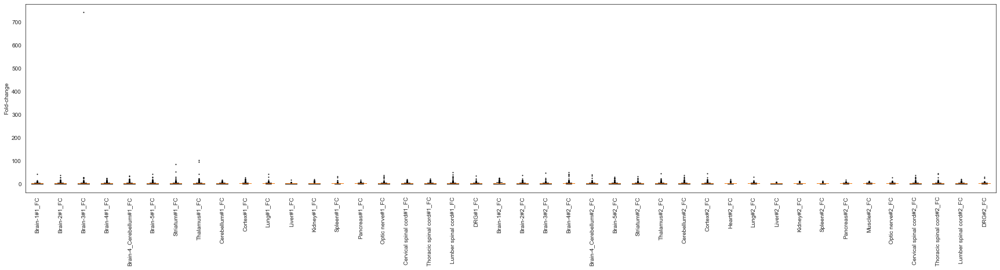

In [233]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1_columns + rep2_columns
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Fold-change')
plt.show()

In [31]:
headerID = z_rep1_m['Header_ID']

In [30]:
rep1_z_mod = rep1_z.loc[:, rep1_columns]
rep2_z_mod = rep2_z.loc[:, rep2_columns]

In [237]:
val1 = []
for i in range(len(rep1_z_mod.columns)):
    data = rep1_z_mod.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(len(rep2_z_mod.columns)):
    data = rep2_z_mod.iloc[:, i]
    val2.append(data)

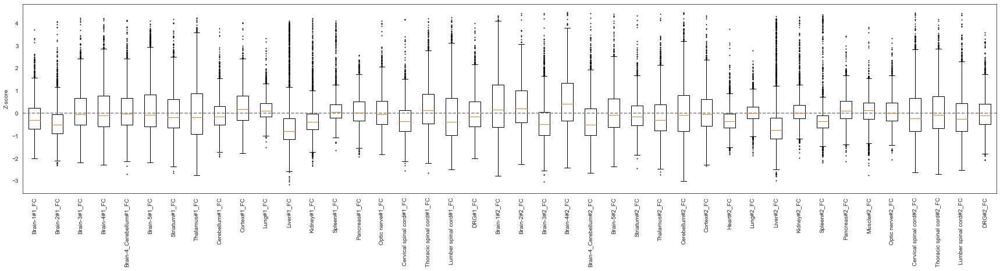

In [238]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1_columns + rep2_columns
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.axhline(y=0, color='gray', linestyle='--')
plt.show()

In [32]:
print(rep1_z_mod.shape)
print(rep2_z_mod.shape)

(2528, 20)
(2528, 22)


## 検討 tissue grouping (20220909) -----

In [1154]:
# tissue grouping (DRG#1: 内臓組織)----
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC'
]
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
    'DRG#1_FC'
]
# tissue grouping (DRG#1: 内臓組織)----
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC'
]
others_2 = [
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC',
    'Spleen#2_FC',
    'DRG#2_FC'
]

In [34]:
group_1 = pd.DataFrame()
for i in range(len(rep1_z_mod)):
    b = rep1_z_mod.loc[i, brain_1].mean()
    n = rep1_z_mod.loc[i, nerve_1].mean()
    o = rep1_z_mod.loc[i, others_1].mean()
    col = pd.Series([b, n, o])
    group_1 = group_1.append(col, ignore_index=True)

group_1.columns = ['Brain#1', 'Nerve#1', 'Others#1']

In [35]:
rep1_group = pd.concat([headerID, group_1], axis=1)

In [36]:
rep1_group

,Header_ID,Brain#1,Nerve#1,Others#1
0,Seq_6375,0.399326,0.313360,-0.874450
1,Seq_10846,-0.082966,-0.525452,0.488578
2,Seq_49364,-0.167529,-0.362816,0.521092
3,Seq_52061,-0.280495,-0.070124,0.514241
4,Seq_56859,0.145094,0.244021,-0.404503
...,...,...,...,...
2523,Seq_10740289,0.275440,-0.125724,-0.375251
2524,Seq_10740467,0.275468,-0.007445,-0.454150
2525,Seq_10742571,0.098185,0.170551,-0.277342
2526,Seq_10747946,0.172692,0.519364,-0.634063


In [37]:
group_2 = pd.DataFrame()
for i in range(len(rep2_z_mod)):
    b = rep2_z_mod.loc[i, brain_2].mean()
    n = rep2_z_mod.loc[i, nerve_2].mean()
    o = rep2_z_mod.loc[i, others_2].mean()
    col = pd.Series([b, n, o])
    group_2 = group_2.append(col, ignore_index=True)

group_2.columns = ['Brain#2', 'Nerve#2', 'Others#2']

In [38]:
rep2_group = pd.concat([headerID, group_2], axis=1)

In [352]:
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 0) & (rep1_group['Others#1'] < 0) & (rep1_group['Nerve#1'] < 0)]

In [353]:
group_1_sel

,Header_ID,Brain#1,Nerve#1,Others#1
9,Seq_57874,0.214157,-0.271024,-0.176246
14,Seq_59947,0.243768,-0.194188,-0.276822
21,Seq_96665,0.479363,-1.071849,-0.084372
30,Seq_131910,0.292216,-0.217133,-0.342272
31,Seq_137720,0.597387,-0.132621,-0.907231
...,...,...,...,...
2512,Seq_10669633,0.344155,-0.161843,-0.465696
2513,Seq_10674475,0.320463,-0.647033,-0.102750
2517,Seq_10690405,0.519132,-0.253900,-0.695953
2523,Seq_10740289,0.275440,-0.125724,-0.375251


In [354]:
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 0) & (rep2_group['Others#2'] < 0) & (rep2_group['Nerve#2'] < 0) ]
#group_2_sel = rep2_group[(rep2_group['Brain#2'] > 0) & (rep2_group['Others#2'] < 0)]

In [355]:
group_2_sel

,Header_ID,Brain#2,Nerve#2,Others#2
4,Seq_56859,0.374476,-0.444820,-0.245685
5,Seq_57337,0.403849,-0.034815,-0.487403
7,Seq_57860,0.219981,-0.506422,-0.021764
8,Seq_57873,0.546455,-0.120745,-0.622696
9,Seq_57874,0.298924,-0.233722,-0.256794
...,...,...,...,...
2515,Seq_10677749,0.205830,-0.043095,-0.235740
2521,Seq_10712079,0.131315,-0.308525,-0.009882
2524,Seq_10740467,0.313600,-0.175762,-0.304119
2525,Seq_10742571,0.345048,-0.718202,-0.072209


<AxesSubplot:>

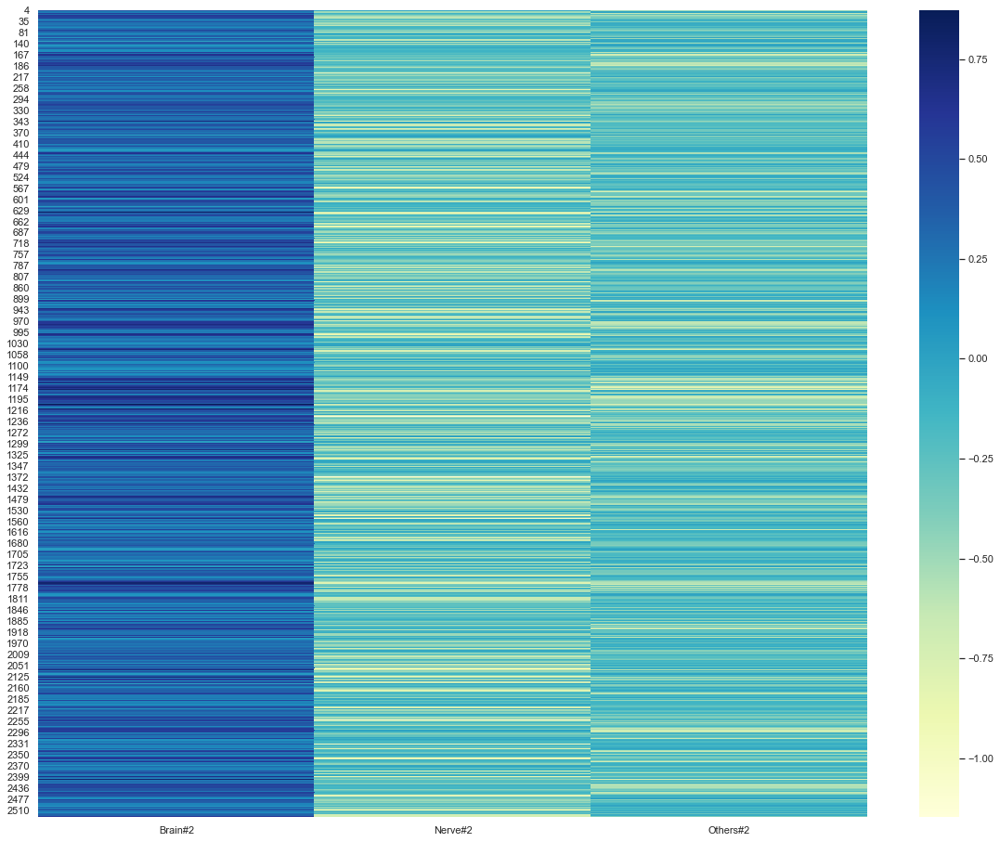

In [434]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_2_sel.iloc[:, 1:]., cmap='YlGnBu')

In [498]:
rep1_common.iloc[:, 1:].index

Int64Index([   9,   14,   36,   37,   51,   73,  107,  111,  133,  138,
            ...
            2370, 2423, 2427, 2452, 2479, 2484, 2501, 2510, 2511, 2524],
           dtype='int64', length=222)

<AxesSubplot:>

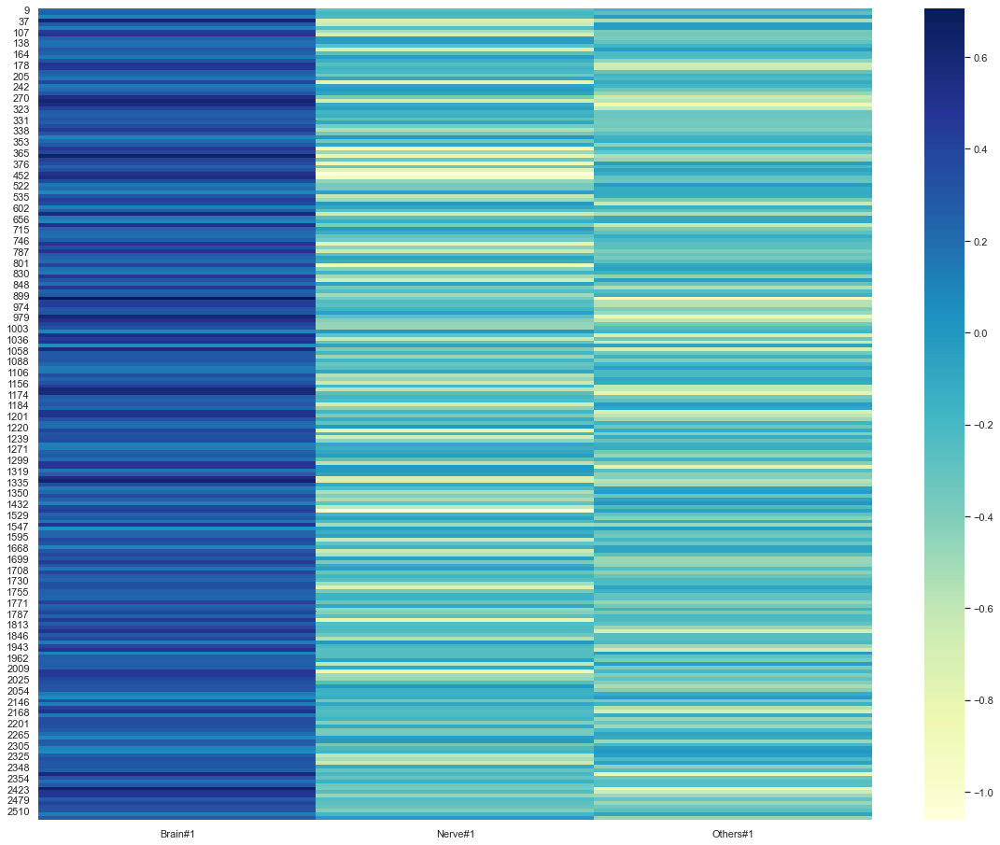

In [493]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_common.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

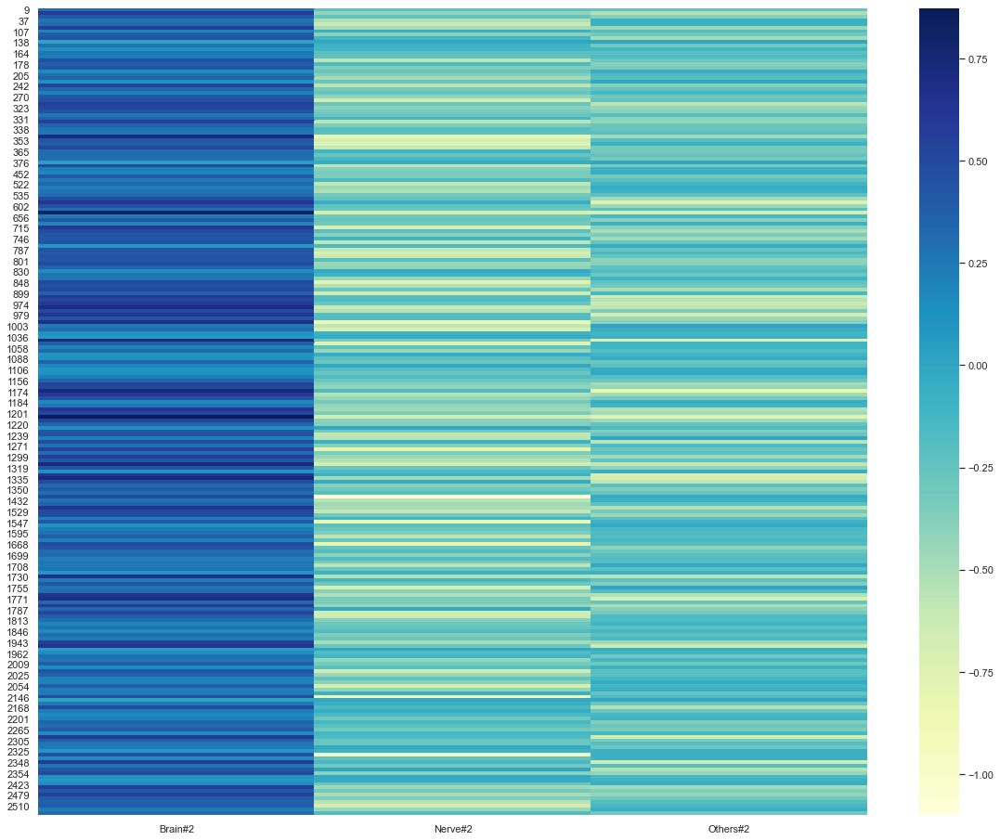

In [494]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_common.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

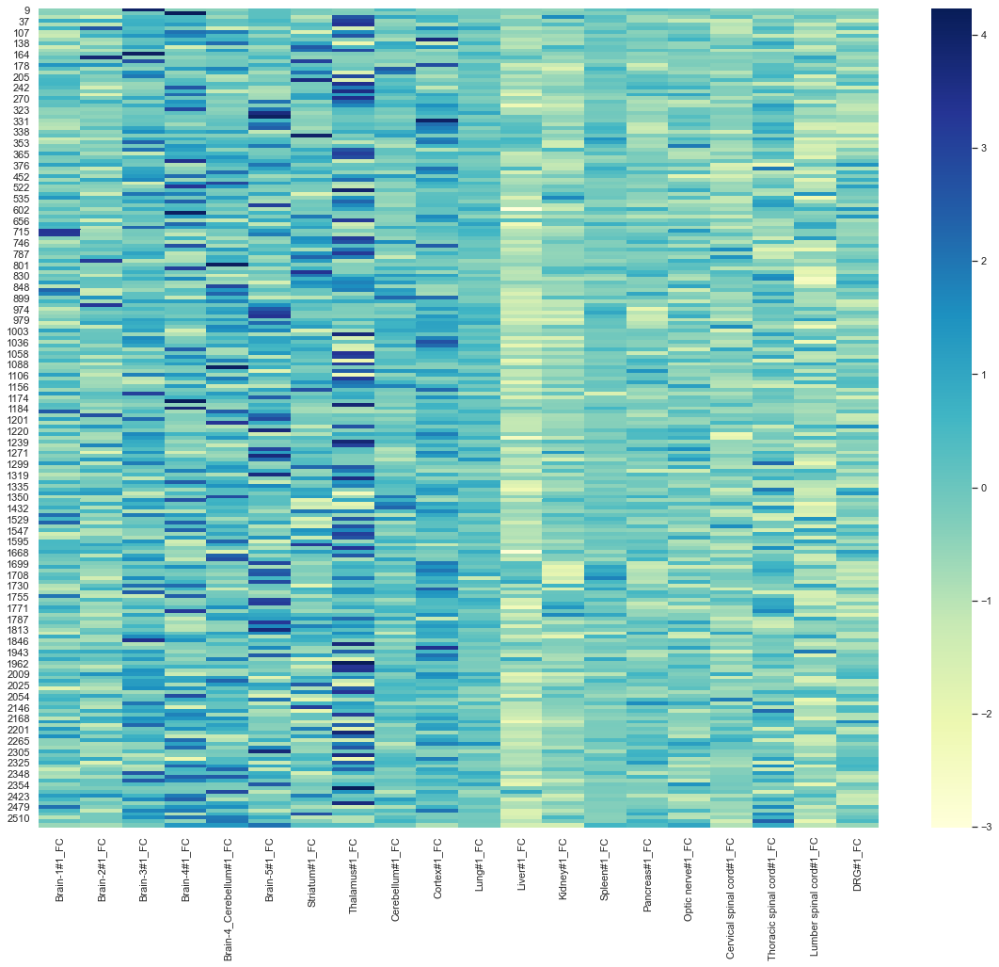

In [501]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel, cmap='YlGnBu')

<AxesSubplot:>

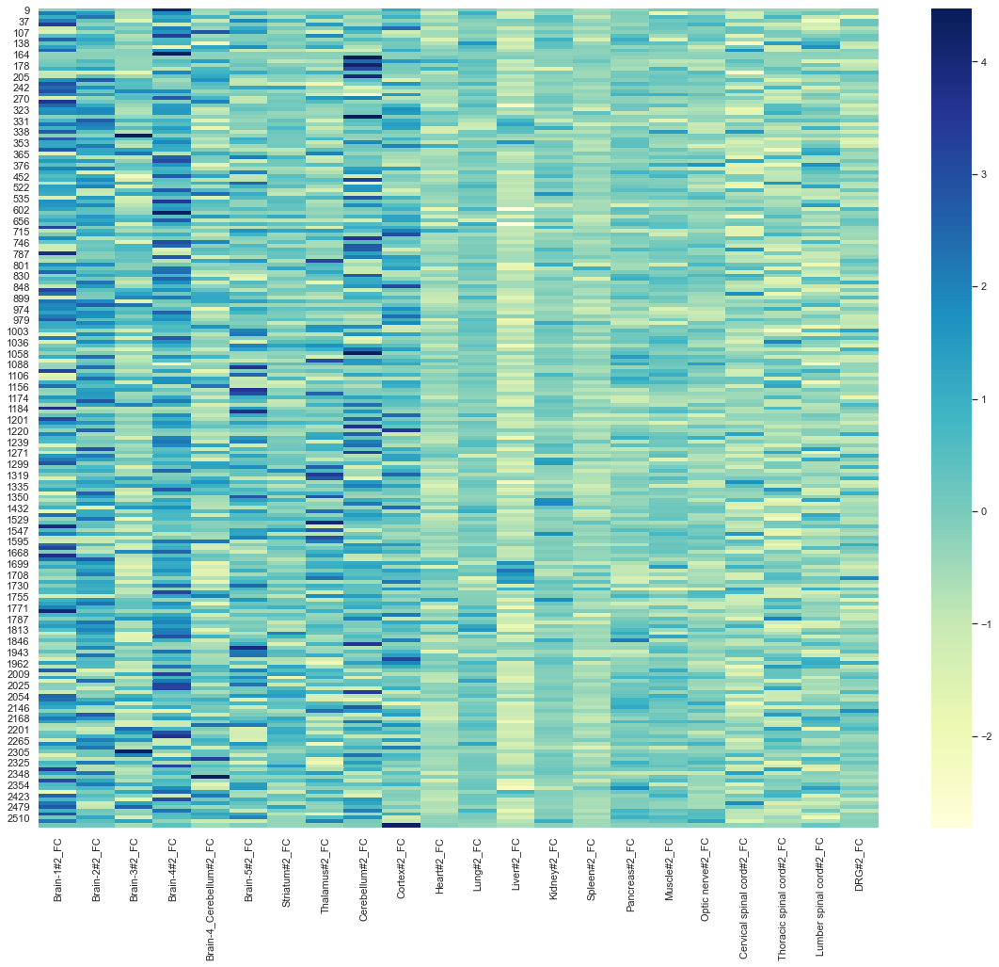

In [502]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel, cmap='YlGnBu')

In [504]:
crep1 = rep1_sel.reset_index(drop=True)
crep2 = rep2_sel.reset_index(drop=True)
df_crep12 = pd.concat([crep1, crep2], axis=1)

<AxesSubplot:>

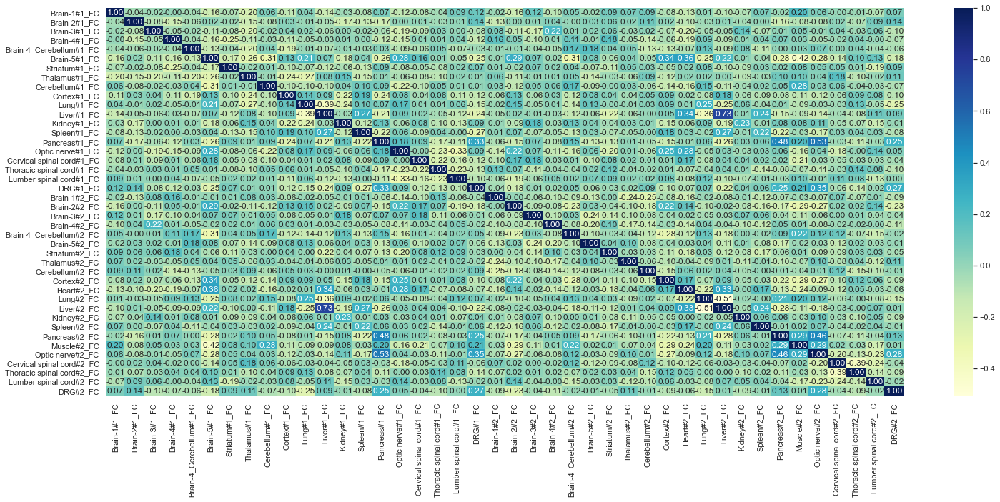

In [506]:
sns.set(rc = {'figure.figsize':(25,10)})
sns.heatmap(df_crep12.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [401]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Grouping_Common_Consensus_frequency_Zscore.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_group.to_excel(writer, sheet_name='100-131', index=False)
    rep2_group.to_excel(writer, sheet_name='200-231', index=False)

In [43]:
#infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
rep1 = pd.read_excel(infile, sheet_name='100-131')
rep2 = pd.read_excel(infile, sheet_name='200-231')

In [854]:
idx_rep1 = sorted([rep1[rep1['Header_ID'] == seqID].index[0] for seqID in group_1_sel['Header_ID']])
rep1_sel = pd.concat([group_1_sel['Header_ID'].reset_index(drop=True), rep1.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)
idx_rep2 = sorted([rep2[rep2['Header_ID'] == seqID].index[0] for seqID in group_2_sel['Header_ID']])
rep2_sel = pd.concat([group_2_sel['Header_ID'].reset_index(drop=True), rep2.loc[idx_rep2, rep2_columns].reset_index(drop=True)], axis=1)

In [844]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(633, 21)
(727, 23)


In [845]:
rep1_sel

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC
0,Seq_57874,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,-0.204478,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060
1,Seq_59947,-0.400772,-0.412576,-0.093848,4.203086,-0.105653,0.224881,-0.211895,-0.247310,-0.329943,...,-0.164676,-0.424381,-0.318138,-0.294529,-0.211895,-0.058434,-0.235505,-0.188286,-0.294529,-0.247310
2,Seq_96665,0.972866,-0.209279,1.114271,0.712681,-0.757930,-0.593901,-0.401590,2.785677,0.067874,...,0.407246,-0.460980,-0.237560,0.220592,-0.395934,-0.226248,-1.357487,-1.349003,-1.354659,-0.039593
3,Seq_131910,-0.551964,-0.714306,0.503261,0.503261,0.219162,3.587765,-0.227279,-0.998405,-0.186694,...,0.056820,-0.551964,-0.511378,-0.024351,-1.038991,0.097405,-0.024351,0.219162,-1.160748,0.016234
4,Seq_137720,0.577428,0.864256,2.066276,0.593691,0.689794,-0.383596,1.736571,-0.561016,0.210760,...,-0.688167,-0.782791,-0.977953,-0.859673,-1.167201,-0.281580,-0.416123,1.483747,-1.316529,-0.967603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,Seq_10669633,0.170762,-1.045622,-0.846790,1.018722,0.664918,-0.367254,0.276026,-0.130410,0.410530,...,-0.332166,-1.033926,-0.703514,-0.229826,-0.411114,-0.595326,-1.191822,0.316962,0.822814,-0.083626
629,Seq_10674475,1.641610,-0.057614,1.530099,-1.156800,-0.750579,-0.578002,-1.016083,2.637250,0.433568,...,0.040622,-0.370909,-0.386839,0.205234,0.146824,-0.777130,-0.368254,0.014072,-1.456820,-0.251432
630,Seq_10690405,0.088830,-0.367211,0.737920,2.615243,1.445763,0.301463,-0.093027,0.810662,-0.246906,...,-0.613417,-1.069459,-0.288873,-0.535079,-0.750510,-0.386796,-0.392391,1.451358,-1.687772,-0.918378
631,Seq_10740289,0.952737,-0.982726,-0.408892,1.456211,0.968308,-0.176475,0.076127,0.396781,0.064592,...,-0.173592,-2.384149,-0.876610,-0.165518,0.397358,-0.083624,-1.968336,1.438909,0.110153,0.951007


<AxesSubplot:>

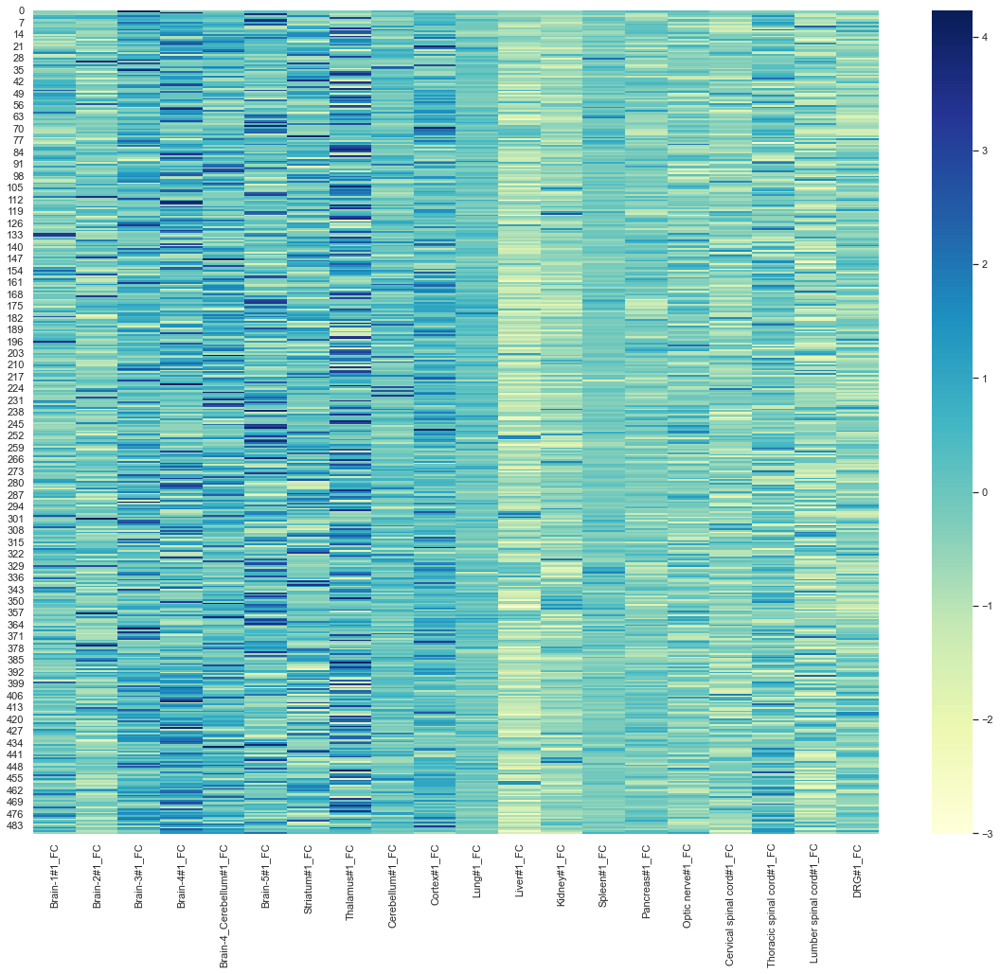

In [332]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

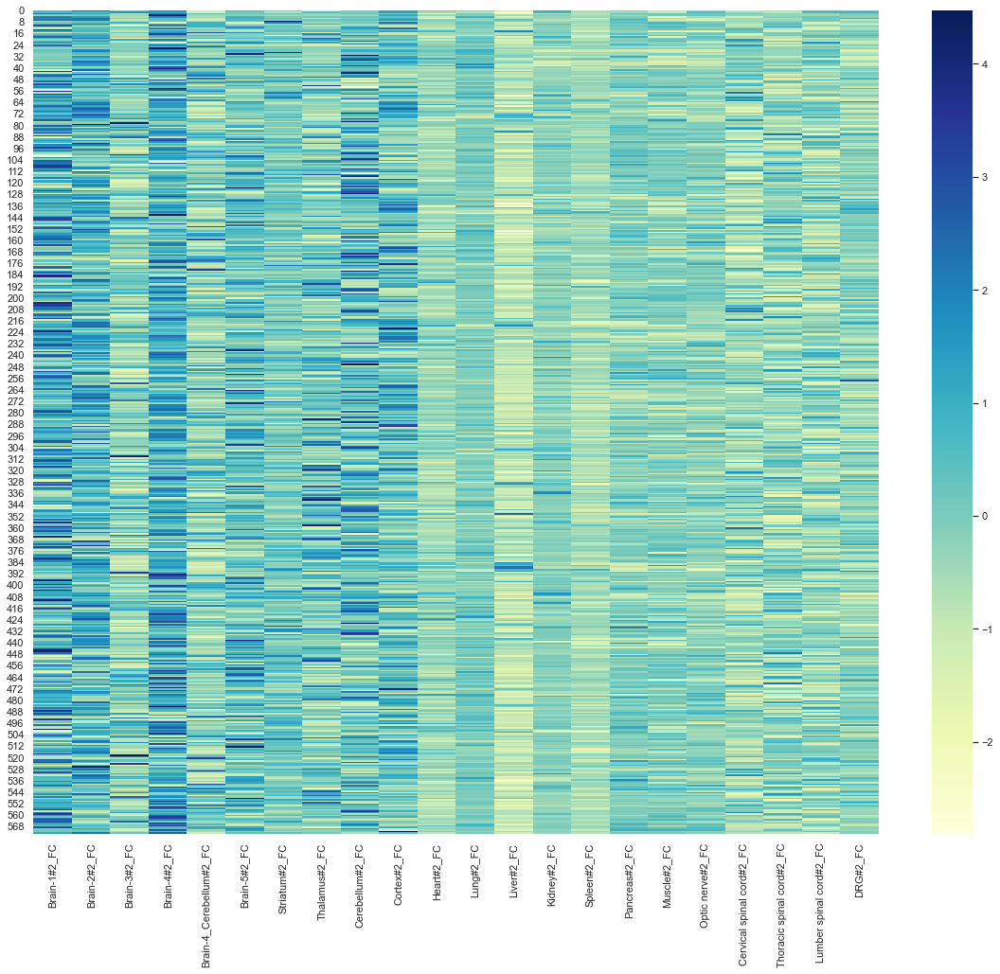

In [333]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel.iloc[:, 1:], cmap='YlGnBu')

In [565]:
from sklearn.cluster import KMeans

In [846]:
np.random.seed(0)
model = KMeans(n_clusters=7, init='k-means++',  random_state=1)
model.fit(rep1_sel.iloc[:, 1:])

KMeans(n_clusters=7, random_state=1)

In [847]:
rep1_sel['cluster'] = model.labels_
rep1_sel_sort = rep1_sel.sort_values('cluster')

<AxesSubplot:>

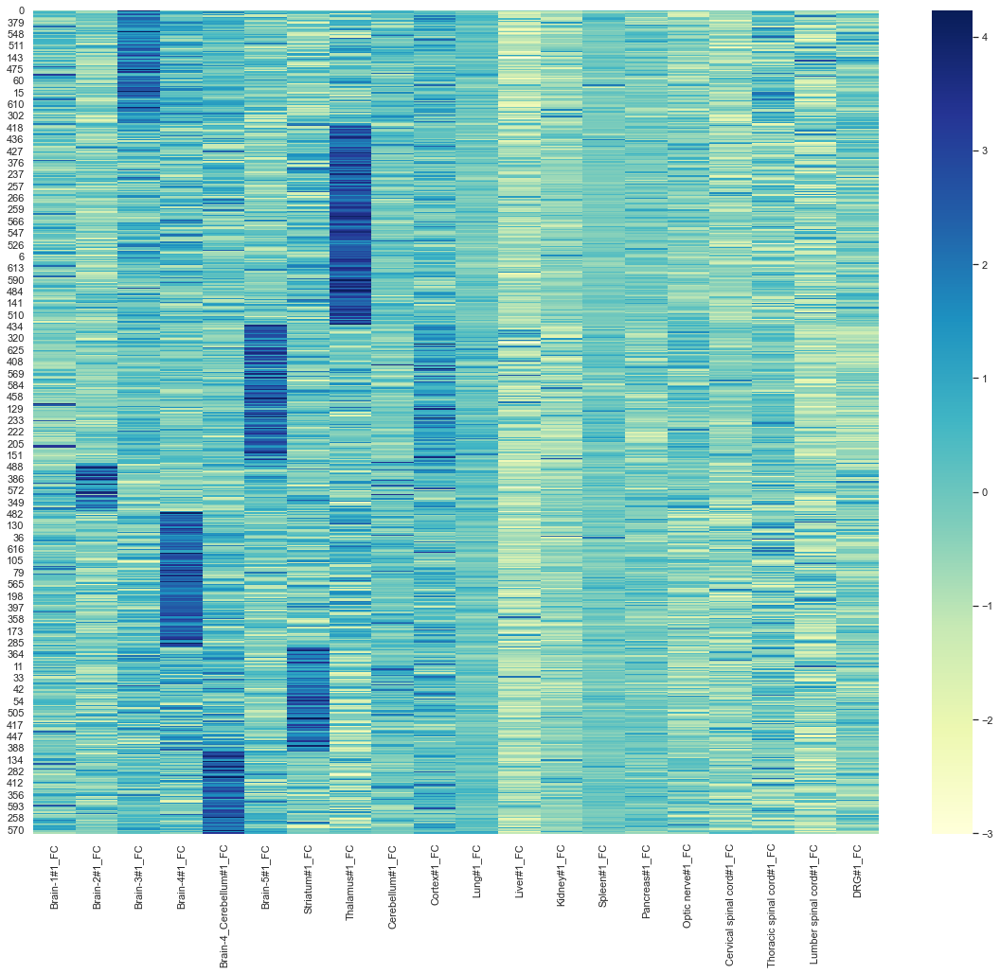

In [848]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel_sort.iloc[:, 1:len(rep1_sel_sort.columns) - 1], cmap='YlGnBu')

In [287]:
rep1_sel_sort.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,cluster
0,Seq_57874,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060,0
370,Seq_5535910,0.671020,-0.157167,1.303454,-0.767014,0.324687,-0.439504,-0.224928,0.305865,-0.017881,...,-1.132170,-0.507265,-0.292689,0.445151,0.622082,-1.188637,-0.507265,-2.159875,1.446504,0
88,Seq_1068469,-0.179691,-0.562666,1.534891,0.854692,1.123126,-1.096842,-0.409600,0.826523,0.832944,...,0.437956,-0.784911,0.515006,-1.177828,-0.856784,-1.373561,0.924700,-0.846013,-1.476709,0
538,Seq_9145866,-0.451818,0.818437,1.130321,1.225332,1.167499,-0.856648,-1.949274,0.434262,-0.208095,...,-1.156139,-0.517913,-0.181244,0.436328,-1.085913,-0.612924,2.214685,-0.848386,0.452851,0
182,Seq_3062908,2.489937,-0.518348,2.410679,0.001233,-0.388012,0.614162,-1.441264,0.564846,-0.639877,...,-0.192509,-0.275290,0.166794,0.119239,-0.877651,-0.889980,-1.067871,-0.049845,-0.601129,0


In [276]:
rep12_sel.h

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,54,67,55,74,83,92,83,...,1.896552,1.000000e+00,1.275862,1.000000e+00,0.827586,1.0,1.379310,1.000000e+00,1.172414,1.000000e+00
1,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,28,34,33,35,27,36,44,...,0.644444,1.000000e+00,0.733333,1.000000e+00,1.000000,1.0,0.711111,1.000000e+00,0.600000,1.000000e+00
2,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1443,388,914,1317,839,702,951,...,0.396892,1.293513e-179,0.755529,3.418788e-20,0.363419,0.0,0.401076,5.968659e-271,0.327555,1.066589e-283
3,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,42,47,38,61,43,109,45,...,0.716049,1.000000e+00,1.888889,1.000000e+00,0.617284,1.0,0.493827,1.000000e+00,0.814815,1.000000e+00
4,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,45,48,67,66,61,89,62,...,1.708333,1.000000e+00,1.250000,1.000000e+00,1.416667,1.0,1.166667,1.000000e+00,1.625000,1.000000e+00


In [285]:
print(brain_rep1.shape)
print(brain_rep2.shape)

(633, 175)
(727, 175)


In [623]:
#idx_rep1 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep1_sel_sort['Header_ID']]
#brain_rep1 = pd.concat(
#   [rep12_sel.loc[idx_rep1, :].reset_index(drop=True), rep1_sel_sort['cluster'].reset_index(drop=True)], axis=1
#)
idx_rep2 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep2_sel_sort['Header_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.loc[idx_rep2, :].reset_index(drop=True), rep2_sel_sort['cluster'].reset_index(drop=True)], axis=1
)

In [624]:
brain_rep2

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR,cluster
0,Seq_1078033,AATGGGCATGGGACTGATTGGACTCGG,CCGAGTCCAATCAGTCCCATGCCCATT,363,194,755,1090,591,119,404,...,1.665998e-04,1.593846,1.385931e-05,2.553846,3.340671e-26,1.175385,1.000000e+00,1.147692,1.000000e+00,0
1,Seq_513234,AATAATACGGGGACTAATTGGAGTGAG,CTCACTCCAATTAGTCCCCGTATTATT,2297,2304,2110,1259,1526,2208,2391,...,1.240587e-01,1.181607,1.000000e+00,1.718277,3.714585e-11,1.923166,3.433967e-24,1.587893,3.724100e-13,0
2,Seq_9901605,TCGGTTCCGGGGACGAGTTGGAATGTT,AACATTCCAACTCGTCCCCGGAACCGA,232,538,383,1365,955,1197,741,...,7.769112e-23,1.116848,1.000000e+00,1.429348,1.000000e+00,2.260870,3.585005e-19,0.817935,1.000000e+00,0
3,Seq_4238967,CATCCTGGGGGGCATGATTGGAATACG,CGTATTCCAATCATGCCCCCCAGGATG,530,685,450,675,147,563,893,...,1.000000e+00,1.115578,1.000000e+00,2.055276,4.560793e-13,2.293970,2.105617e-22,1.439698,1.000000e+00,0
4,Seq_9841521,TCGGCTCTTGGGGCGGATTGGAGTCTT,AAGACTCCAATCCGCCCCAAGAGCCGA,1147,634,501,968,1064,1032,1496,...,1.630849e-06,0.840095,1.000000e+00,1.494033,6.277794e-01,1.411695,1.000000e+00,1.459427,1.033786e-05,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,Seq_1324244,ACGAATCAGGGGTCGGATTGGAGTATT,AATACTCCAATCCGACCCCTGATTCGT,2775,1226,1812,3022,4172,1505,3542,...,1.600337e-47,2.072823,8.616300e-106,2.846847,1.368726e-165,2.656907,2.880527e-137,2.819069,2.255121e-208,7
723,Seq_7229454,GATTCTGGGGGGGCGCATTGGCATGTG,CACATGCCAATGCGCCCCCCCAGAATC,265,361,697,1107,1244,641,146,...,4.198350e-12,1.489316,8.221564e-06,1.955128,3.696107e-12,1.647436,2.681265e-02,2.023504,1.069045e-23,7
724,Seq_1129130,AATGTGCCGGGGCCTTCTTGGGATCGT,ACGATCCCAAGAAGGCCCCGGCACATT,534,634,1767,1311,482,641,1164,...,4.477558e-30,0.702677,1.864824e-07,0.996176,1.000000e+00,1.227533,1.000000e+00,1.031549,1.000000e+00,7
725,Seq_7291231,GCGAATACTGGGCTTTCGTGGACTCAG,CTGAGTCCACGAAAGCCCAGTATTCGC,815,986,436,411,757,103,607,...,2.101464e-13,1.096852,1.000000e+00,1.910412,9.390916e-09,1.355932,1.000000e+00,1.593220,3.055223e-04,7


In [625]:
#outf1 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_1.txt'
#brain_rep1.to_csv(outf1, sep='\t', index=False)
outf2 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_2.txt'
brain_rep2.to_csv(outf2, sep='\t', index=False)

In [301]:
c = list(set(brain_rep1['Header_ID']) & set(brain_rep2[brain_rep2['cluster'] == 5]['Header_ID']))

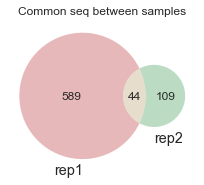

In [303]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
column = 'Common seq between samples'

plt.figure(figsize=(3,3))
venn2(subsets=(set(brain_rep1['Header_ID']), set(brain_rep2[brain_rep2['cluster'] == 5]['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()
plt.show()

In [304]:
c

['Seq_214383',
 'Seq_509157',
 'Seq_5006573',
 'Seq_9266103',
 'Seq_4692429',
 'Seq_4513983',
 'Seq_6783069',
 'Seq_597538',
 'Seq_1045176',
 'Seq_10615337',
 'Seq_797371',
 'Seq_6380684',
 'Seq_8565958',
 'Seq_7004323',
 'Seq_7374776',
 'Seq_8263238',
 'Seq_3663349',
 'Seq_719838',
 'Seq_3592195',
 'Seq_3225276',
 'Seq_3530108',
 'Seq_730376',
 'Seq_6244036',
 'Seq_9934455',
 'Seq_3107041',
 'Seq_832810',
 'Seq_10190095',
 'Seq_768110',
 'Seq_4744095',
 'Seq_4738378',
 'Seq_9039878',
 'Seq_3913709',
 'Seq_8737849',
 'Seq_1071812',
 'Seq_7054871',
 'Seq_1129130',
 'Seq_7374754',
 'Seq_9977341',
 'Seq_2559884',
 'Seq_918388',
 'Seq_6729892',
 'Seq_1068469',
 'Seq_10506738',
 'Seq_10290748']

In [868]:
np.random.seed(0)
model = KMeans(n_clusters=8, init='k-means++',  random_state=1)
model.fit(rep2_sel.iloc[:, 1:])
rep2_sel['cluster'] = model.labels_
rep2_sel_sort = rep2_sel.sort_values('cluster')

In [859]:
rep2_sel

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Kidney#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,cluster
0,Seq_56859,0.579301,2.399959,0.237927,1.717212,-1.355149,0.693092,-0.103447,-1.468941,0.010345,...,1.148256,-0.786194,-0.331029,-1.013776,-0.444820,-1.127567,-0.672402,0.465509,0.237927,1
1,Seq_57337,0.661476,0.661476,1.566654,1.357767,-1.427396,0.034815,-0.800734,0.591847,-0.034815,...,0.800734,-0.522218,-0.522218,-1.079250,0.591847,-0.591847,-0.870363,0.731105,0.870363,1
2,Seq_57860,-0.448030,1.000105,-1.055312,0.346108,-0.728314,-0.167746,1.140247,3.008807,-0.868456,...,0.019110,-0.681600,-0.775028,1.140247,-0.541458,-0.541458,-0.494744,-0.448030,1.560673,4
3,Seq_57873,2.149686,1.292454,-0.646204,1.874111,0.347110,0.231701,0.422777,-0.364006,0.296932,...,-0.702001,-1.057659,0.377216,0.326637,0.050862,0.164263,-0.269070,-0.429036,0.018146,6
4,Seq_57874,-0.180985,0.109070,-0.444671,4.169839,-0.444671,-0.207353,-0.391934,-0.391934,-0.391934,...,-0.154616,-0.550145,-0.312828,0.082702,0.188176,-0.365565,-0.339196,-0.418302,-0.154616,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,Seq_10677749,0.066688,0.399821,-1.289398,2.864667,-0.419552,1.394172,-0.089784,-0.274858,0.485628,...,-0.252985,-1.048803,0.961772,0.874283,0.722859,-0.707257,0.401503,-0.589483,-0.342157,0
723,Seq_10712079,-1.090886,-0.180567,0.786427,0.400338,-0.269119,-0.873047,-0.656979,-0.662292,3.894620,...,-0.044196,-0.274432,-0.171711,0.113428,-0.302769,-1.037755,0.102801,0.003623,0.469409,2
724,Seq_10740467,0.153153,0.153153,-0.552811,0.409868,-0.456543,-0.135650,-0.360275,-0.328186,-0.071472,...,-0.231918,-0.456543,-0.199829,-0.199829,-0.264007,-0.296096,-0.392364,0.249421,-0.167739,1
725,Seq_10742571,-0.848908,0.272153,1.539003,-1.517524,2.604766,0.920660,0.719573,-1.517524,0.925687,...,0.473241,-0.326081,-0.104885,0.247017,0.081120,-1.401898,-0.894153,-0.657875,-0.331109,7


<AxesSubplot:>

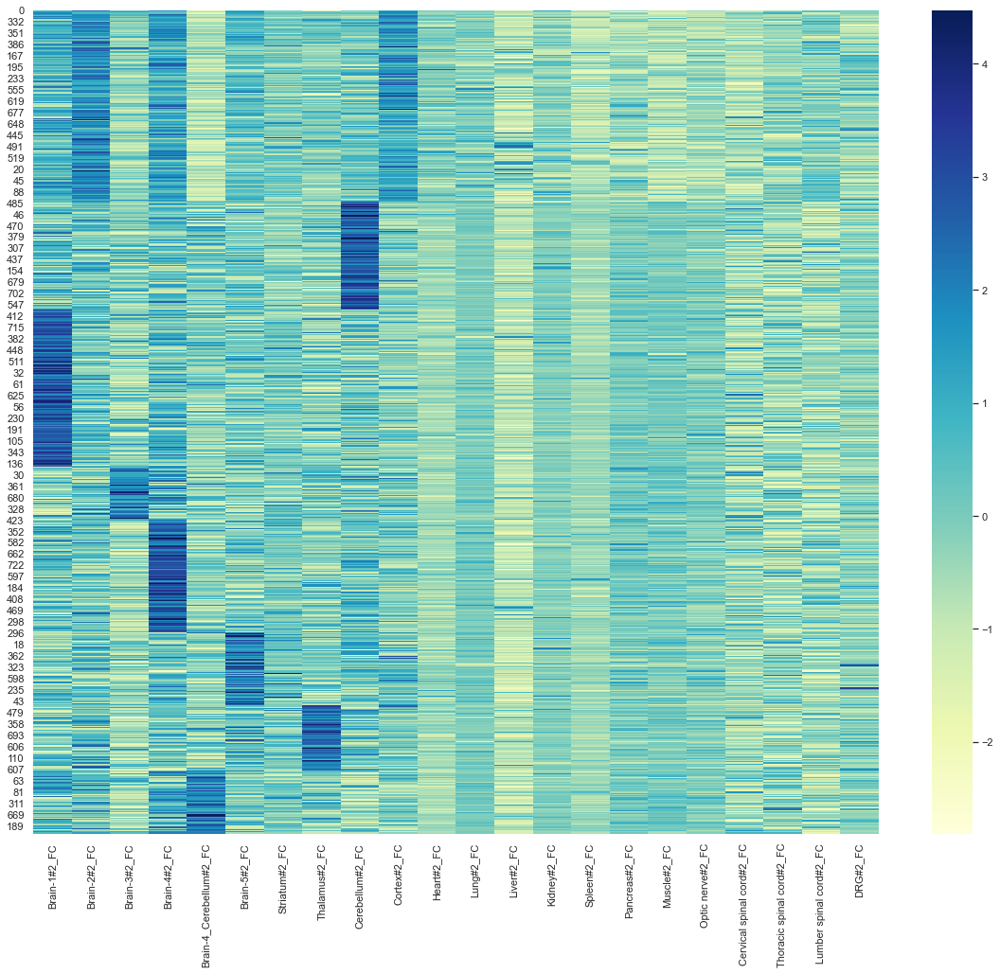

In [869]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel_sort.iloc[:, 1:len(rep2_sel_sort.columns) - 1], cmap='YlGnBu')

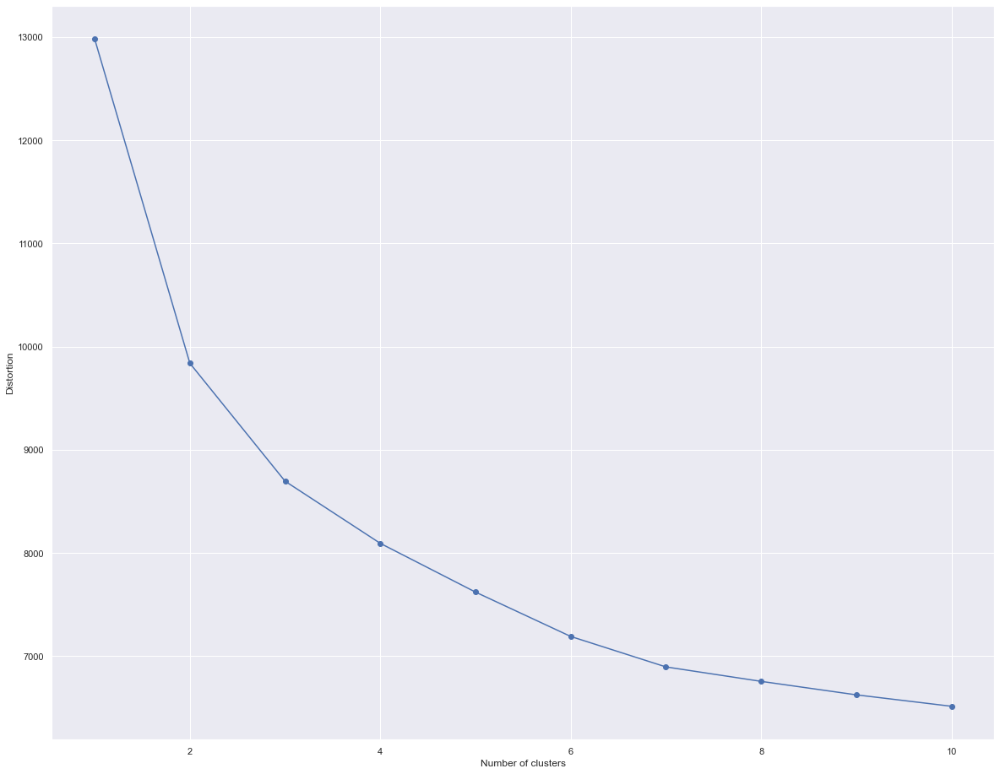

In [205]:
distortions = []

for i  in range(1,11):                # 1~10クラスタまで一気に計算 
    km = KMeans(n_clusters=i,
                init='k-means++',     # k-means++法によりクラスタ中心を選択
                n_init=10,
                max_iter=300,
                random_state=0)
    km.fit(rep1_sel.iloc[:, 1:])                         # クラスタリングの計算を実行
    distortions.append(km.inertia_)   # km.fitするとkm.inertia_が得られる

plt.plot(range(1,11), distortions,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

Text(0, 0.5, 'Cluster distance')

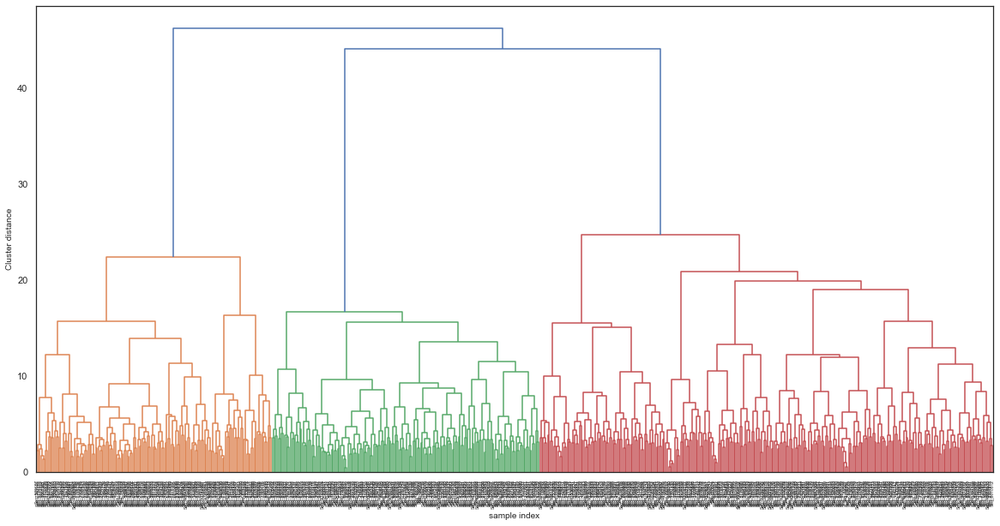

In [88]:
import scipy.spatial.distance as distance
from scipy.cluster.hierarchy import dendrogram, ward

#ward法で分類
sns.set_style("white")
linkage_array = ward(rep1_sel.iloc[:, 1:])

ax = plt.figure(figsize=(20,10)).gca()
res = dendrogram(linkage_array, labels=list(rep1_sel['Header_ID']))
bounds = ax.get_xbound()

plt.xlabel("sample index",fontsize=10)
plt.ylabel("Cluster distance",fontsize=10)

In [77]:
linkage_array.shape

(632, 4)

In [92]:
res.keys()

dict_keys(['icoord', 'dcoord', 'ivl', 'leaves', 'color_list', 'leaves_color_list'])

In [94]:
res['ivl']

['Seq_509157',
 'Seq_7761140',
 'Seq_1734953',
 'Seq_6612112',
 'Seq_1067087',
 'Seq_4911382',
 'Seq_4720739',
 'Seq_4738889',
 'Seq_613098',
 'Seq_7547772',
 'Seq_5211044',
 'Seq_9867840',
 'Seq_3804813',
 'Seq_1242460',
 'Seq_9130410',
 'Seq_5977139',
 'Seq_6397225',
 'Seq_497807',
 'Seq_1095330',
 'Seq_1071812',
 'Seq_1247265',
 'Seq_7484025',
 'Seq_4954681',
 'Seq_804581',
 'Seq_5580924',
 'Seq_10142897',
 'Seq_7487569',
 'Seq_7104745',
 'Seq_7115738',
 'Seq_1067795',
 'Seq_7106814',
 'Seq_7107843',
 'Seq_5975150',
 'Seq_7108956',
 'Seq_5969392',
 'Seq_5975645',
 'Seq_344284',
 'Seq_1067488',
 'Seq_1067970',
 'Seq_3591286',
 'Seq_6463971',
 'Seq_9988652',
 'Seq_4907303',
 'Seq_7746021',
 'Seq_4827746',
 'Seq_7494076',
 'Seq_1484657',
 'Seq_4099185',
 'Seq_7364159',
 'Seq_7370537',
 'Seq_9942324',
 'Seq_4876729',
 'Seq_9828491',
 'Seq_1429319',
 'Seq_158854',
 'Seq_4989319',
 'Seq_131910',
 'Seq_158568',
 'Seq_1046835',
 'Seq_5094407',
 'Seq_1066352',
 'Seq_4910406',
 'Seq_4808565',

In [95]:
idx_rep1 = sorted([rep1[rep1['Header_ID'] == seqID].index[0] for seqID in res['ivl']])
rep1_ward = pd.concat([pd.Series(res['ivl']), rep1.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)

In [98]:
rep1_ward.head()

,0,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC
0,Seq_509157,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,-0.204478,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060
1,Seq_7761140,-0.400772,-0.412576,-0.093848,4.203086,-0.105653,0.224881,-0.211895,-0.247310,-0.329943,...,-0.164676,-0.424381,-0.318138,-0.294529,-0.211895,-0.058434,-0.235505,-0.188286,-0.294529,-0.247310
2,Seq_1734953,0.972866,-0.209279,1.114271,0.712681,-0.757930,-0.593901,-0.401590,2.785677,0.067874,...,0.407246,-0.460980,-0.237560,0.220592,-0.395934,-0.226248,-1.357487,-1.349003,-1.354659,-0.039593
3,Seq_6612112,-0.551964,-0.714306,0.503261,0.503261,0.219162,3.587765,-0.227279,-0.998405,-0.186694,...,0.056820,-0.551964,-0.511378,-0.024351,-1.038991,0.097405,-0.024351,0.219162,-1.160748,0.016234
4,Seq_1067087,0.577428,0.864256,2.066276,0.593691,0.689794,-0.383596,1.736571,-0.561016,0.210760,...,-0.688167,-0.782791,-0.977953,-0.859673,-1.167201,-0.281580,-0.416123,1.483747,-1.316529,-0.967603


<AxesSubplot:>

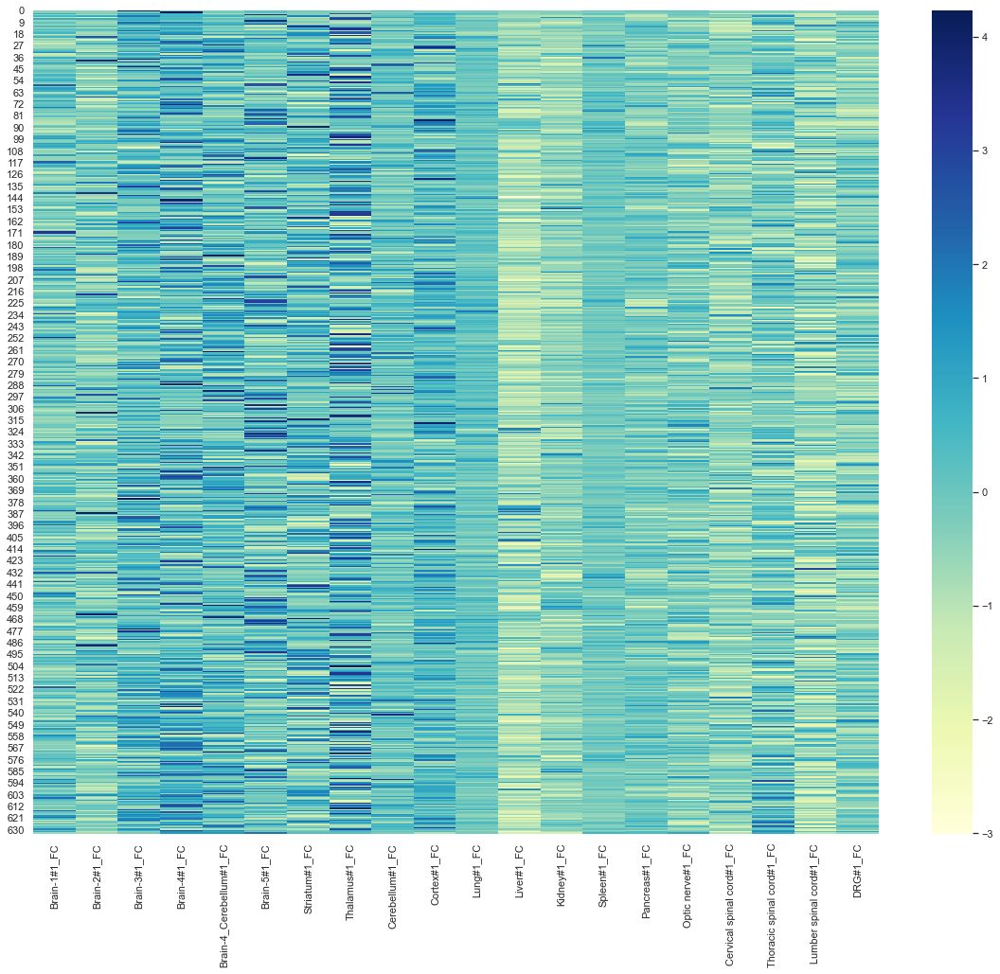

In [99]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_ward.iloc[:, 1:], cmap='YlGnBu')

In [146]:
# ガウシアンカーネルによるSC
from sklearn.cluster import SpectralClustering
labels_sc = SpectralClustering(
    n_clusters = 10,
    affinity = 'rbf',
    random_state = 0
).fit_predict(rep1_sel.iloc[:, 1:])

In [147]:
rep1_sel['cluster'] = labels_sc
rep1_sel_sort = rep1_sel.sort_values('cluster')

<AxesSubplot:>

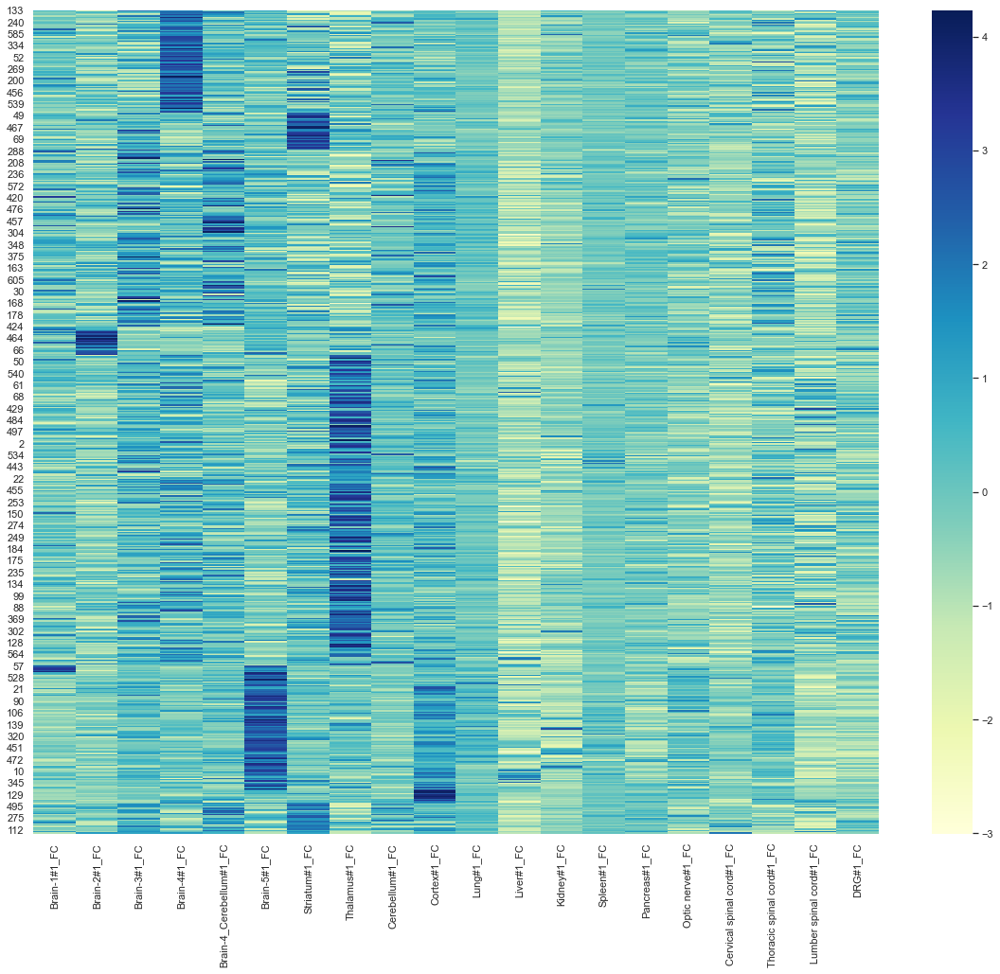

In [148]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel_sort.iloc[:, 1:len(rep1_sel_sort.columns) - 1], cmap='YlGnBu')

In [376]:
rep1_sel.iloc[:, 1:]

,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC
0,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,-0.325471,-0.204478,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060
1,-0.400772,-0.412576,-0.093848,4.203086,-0.105653,0.224881,-0.211895,-0.247310,-0.329943,-0.188286,-0.164676,-0.424381,-0.318138,-0.294529,-0.211895,-0.058434,-0.235505,-0.188286,-0.294529,-0.247310
2,0.972866,-0.209279,1.114271,0.712681,-0.757930,-0.593901,-0.401590,2.785677,0.067874,1.102958,0.407246,-0.460980,-0.237560,0.220592,-0.395934,-0.226248,-1.357487,-1.349003,-1.354659,-0.039593
3,-0.551964,-0.714306,0.503261,0.503261,0.219162,3.587765,-0.227279,-0.998405,-0.186694,0.787360,0.056820,-0.551964,-0.511378,-0.024351,-1.038991,0.097405,-0.024351,0.219162,-1.160748,0.016234
4,0.577428,0.864256,2.066276,0.593691,0.689794,-0.383596,1.736571,-0.561016,0.210760,0.179712,-0.688167,-0.782791,-0.977953,-0.859673,-1.167201,-0.281580,-0.416123,1.483747,-1.316529,-0.967603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,0.170762,-1.045622,-0.846790,1.018722,0.664918,-0.367254,0.276026,-0.130410,0.410530,3.290669,-0.332166,-1.033926,-0.703514,-0.229826,-0.411114,-0.595326,-1.191822,0.316962,0.822814,-0.083626
629,1.641610,-0.057614,1.530099,-1.156800,-0.750579,-0.578002,-1.016083,2.637250,0.433568,0.521184,0.040622,-0.370909,-0.386839,0.205234,0.146824,-0.777130,-0.368254,0.014072,-1.456820,-0.251432
630,0.088830,-0.367211,0.737920,2.615243,1.445763,0.301463,-0.093027,0.810662,-0.246906,-0.101420,-0.613417,-1.069459,-0.288873,-0.535079,-0.750510,-0.386796,-0.392391,1.451358,-1.687772,-0.918378
631,0.952737,-0.982726,-0.408892,1.456211,0.968308,-0.176475,0.076127,0.396781,0.064592,0.407739,-0.173592,-2.384149,-0.876610,-0.165518,0.397358,-0.083624,-1.968336,1.438909,0.110153,0.951007


In [466]:
# 個体間で共通する配列リストの作成 ------
common_seq = list(set(rep1_sel['Header_ID']) & set(rep2_sel['Header_ID']))

In [467]:
len(common_seq)

222

In [475]:
rep1_c_list = [
    'Header_ID',
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC',
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
    'DRG#1_FC'
]
rep2_c_list = [
    'Header_ID',
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC',
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Spleen#2_FC',
    'DRG#2_FC'
]

In [485]:
common_idx_rep1 = sorted([rep1_sel[rep1_sel['Header_ID'] == seqID].index[0] for seqID in common_seq])
rep1_c = rep1_sel.loc[common_idx_rep1, rep1_c_list].reset_index(drop=True)
common_idx_rep2 = sorted([rep2_sel[rep2_sel['Header_ID'] == seqID].index[0] for seqID in common_seq])
rep2_c = rep2_sel.loc[common_idx_rep2, rep2_c_list].reset_index(drop=True)

In [486]:
rep1_c.head()

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC,DRG#1_FC
0,Seq_57874,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,0.231096,-0.446464,-0.373868,-0.494861,-0.204478,-0.398067,-0.470662,0.400486,0.134302,-0.519060
1,Seq_59947,-0.400772,-0.412576,-0.093848,4.203086,-0.105653,0.224881,-0.211895,-0.247310,-0.329943,...,-0.058434,-0.235505,-0.188286,-0.294529,-0.164676,-0.424381,-0.318138,-0.211895,-0.294529,-0.247310
2,Seq_151366,-0.995836,-1.692640,0.503527,0.471899,-0.647929,0.238643,-1.030429,2.620625,0.927540,...,-0.460138,0.257422,-0.808045,0.174399,-0.097404,-0.884150,1.583820,-0.702289,0.293992,-0.390951
3,Seq_153786,0.805057,0.789908,0.724650,0.549853,0.167630,0.513728,-0.553699,3.099559,-0.545541,...,-1.170149,-1.258713,-0.026977,-0.396381,-0.415026,-0.286842,-0.624783,-0.714512,0.178118,-1.353104
4,Seq_214383,-0.850195,-1.133697,0.769817,1.187282,0.112466,0.249544,0.371045,3.333797,-0.420268,...,-0.102497,-0.949888,-0.379768,-1.152389,0.181005,-0.261383,0.405315,0.050158,-0.317460,-0.286306


In [487]:
rep2_c.head()

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Lung#2_FC,Liver#2_FC,Kidney#2_FC,Pancreas#2_FC,Spleen#2_FC,DRG#2_FC
0,Seq_57874,-0.180985,0.109070,-0.444671,4.169839,-0.444671,-0.207353,-0.391934,-0.391934,-0.391934,...,0.188176,-0.365565,-0.339196,-0.418302,-0.101879,-0.523777,-0.154616,-0.312828,-0.550145,-0.154616
1,Seq_59947,2.100020,1.472297,-0.661963,1.848931,-0.536418,0.970118,-0.034239,0.091305,0.216850,...,-0.536418,-1.164141,-0.159784,0.216850,0.970118,-1.289686,-0.285329,-0.034239,-0.410873,-0.159784
2,Seq_151366,1.044681,2.201439,-0.731767,1.039643,0.812927,-0.625966,-0.737813,0.831064,-0.628989,...,0.366548,-1.214421,0.794790,-0.934300,0.311128,-1.206360,0.547921,-0.162457,-0.900041,-1.865349
3,Seq_153786,2.056163,0.264342,-1.545533,1.530351,-0.992641,1.859830,0.821747,-0.850469,-0.295320,...,0.237261,0.054469,-0.153148,-2.209003,-0.092217,-0.001949,0.458418,-0.148635,-0.426209,0.253058
4,Seq_214383,3.372884,-0.236625,0.079746,-1.146192,-0.020917,0.054581,-0.552996,1.474656,-0.603328,...,0.856294,-1.049124,-1.121026,-1.153382,-0.301337,-0.189888,0.015034,-0.366049,-0.204269,0.259503


In [699]:
#infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
rep1 = pd.read_excel(infile, sheet_name='100-131')
rep2 = pd.read_excel(infile, sheet_name='200-231')

### davies-bouldin indexで評価 -----

In [840]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import linkage

num = 10 # クラスター数を10個までの範囲で比較
NUM_CLUSTERS_RANGE = range(2, num+1)  
X1 = rep1_sel.iloc[:, 1:]
X2 = rep2_sel.iloc[:, 1:]

davies_bouldin_index1 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X1)
    labels = kmeans.labels_
    davies_bouldin_index1.append(davies_bouldin_score(X1, labels))

davies_bouldin_index2 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X2)
    labels = kmeans.labels_
    davies_bouldin_index2.append(davies_bouldin_score(X2, labels))

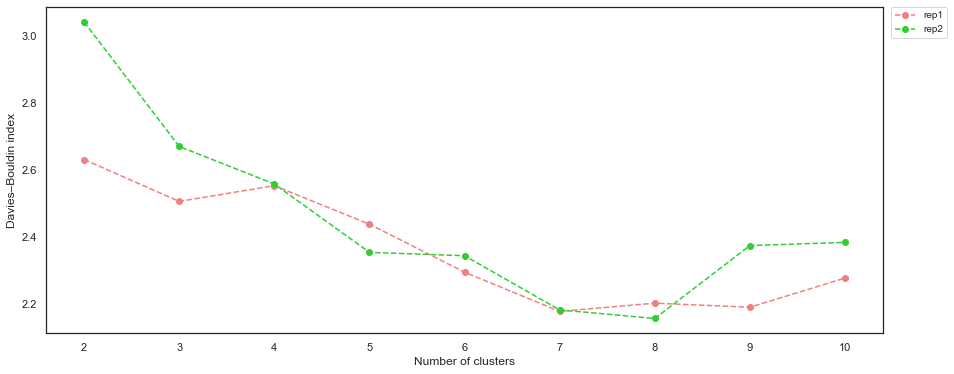

In [842]:
sns.set_style("white")
plt.figure(figsize=(15, 6))
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index1, marker='o', linestyle='--', c='lightcoral', label='rep1')
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index2, marker='o', linestyle='--', c='limegreen', label='rep2')
plt.xlabel('Number of clusters')
plt.ylabel('Davies–Bouldin index')
plt.axvline(x=7, color='gray', linestyle='--')
plt.legend(
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10
)
plt.show()

In [705]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(633, 21)
(727, 23)


### X-means法で分類 -----

In [626]:
!pip install pyclustering

     |████████████████████████████████| 2.6 MB 1.3 MB/s eta 0:00:01     |███████████████████████████▍    | 2.2 MB 1.3 MB/s eta 0:00:01
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395121 sha256=9c1045ba23e59635d510ce9da0c0aa28bdfd92a77a564a65e65b0251171e36e9
  Stored in directory: /Users/tomoyauchiyama/Library/Caches/pip/wheels/dc/25/8b/072b221a5cff4f04e7999d39ca1b6cb5dad702cc3e1da951d4
Successfully built pyclustering


In [691]:
from pyclustering.cluster import xmeans
import itertools

In [747]:
X = rep1_sel.iloc[:, 1:]

In [748]:
X

,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC
0,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,-0.325471,-0.204478,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060
1,-0.400772,-0.412576,-0.093848,4.203086,-0.105653,0.224881,-0.211895,-0.247310,-0.329943,-0.188286,-0.164676,-0.424381,-0.318138,-0.294529,-0.211895,-0.058434,-0.235505,-0.188286,-0.294529,-0.247310
2,0.972866,-0.209279,1.114271,0.712681,-0.757930,-0.593901,-0.401590,2.785677,0.067874,1.102958,0.407246,-0.460980,-0.237560,0.220592,-0.395934,-0.226248,-1.357487,-1.349003,-1.354659,-0.039593
3,-0.551964,-0.714306,0.503261,0.503261,0.219162,3.587765,-0.227279,-0.998405,-0.186694,0.787360,0.056820,-0.551964,-0.511378,-0.024351,-1.038991,0.097405,-0.024351,0.219162,-1.160748,0.016234
4,0.577428,0.864256,2.066276,0.593691,0.689794,-0.383596,1.736571,-0.561016,0.210760,0.179712,-0.688167,-0.782791,-0.977953,-0.859673,-1.167201,-0.281580,-0.416123,1.483747,-1.316529,-0.967603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,0.170762,-1.045622,-0.846790,1.018722,0.664918,-0.367254,0.276026,-0.130410,0.410530,3.290669,-0.332166,-1.033926,-0.703514,-0.229826,-0.411114,-0.595326,-1.191822,0.316962,0.822814,-0.083626
629,1.641610,-0.057614,1.530099,-1.156800,-0.750579,-0.578002,-1.016083,2.637250,0.433568,0.521184,0.040622,-0.370909,-0.386839,0.205234,0.146824,-0.777130,-0.368254,0.014072,-1.456820,-0.251432
630,0.088830,-0.367211,0.737920,2.615243,1.445763,0.301463,-0.093027,0.810662,-0.246906,-0.101420,-0.613417,-1.069459,-0.288873,-0.535079,-0.750510,-0.386796,-0.392391,1.451358,-1.687772,-0.918378
631,0.952737,-0.982726,-0.408892,1.456211,0.968308,-0.176475,0.076127,0.396781,0.064592,0.407739,-0.173592,-2.384149,-0.876610,-0.165518,0.397358,-0.083624,-1.968336,1.438909,0.110153,0.951007


In [760]:
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

xm_c = kmeans_plusplus_initializer(X, 2).initialize()
xm_i = xmeans(data=X, initial_centers=xm_c, kmax=10, tolerance = 0.05, ccore=True).process()

In [800]:
idx_rep1 = sorted([rep1[rep1['Header_ID'] == seqID].index[0] for seqID in group_1_sel['Header_ID']])
rep1_sel = pd.concat([group_1_sel['Header_ID'].reset_index(drop=True), rep1.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)
idx_rep2 = sorted([rep2[rep2['Header_ID'] == seqID].index[0] for seqID in group_2_sel['Header_ID']])
rep2_sel = pd.concat([group_2_sel['Header_ID'].reset_index(drop=True), rep2.loc[idx_rep2, rep2_columns].reset_index(drop=True)], axis=1)

In [707]:
xmeans_instance = xmeans.xmeans(rep1_sel.iloc[:, 1:]).process()

clusters = xmeans_instance.get_clusters()
centers = xmeans_instance.get_centers()

labels_size = len(
   list(itertools.chain.from_iterable(clusters))
)
labels = np.zeros((1, labels_size))
for n, n_th_cluster in np.ndenumerate(clusters):
    for img_num in n_th_cluster:
        labels[0][img_num] = n[0]
labels = labels.ravel()

/Users/tomoyauchiyama/.pyenv/versions/anaconda3-2021.05/lib/python3.8/site-packages/numpy/lib/index_tricks.py:593: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.iter = asarray(arr).flat


In [743]:
xm_i.__dict__.keys()

dict_keys(['_xmeans__pointer_data', '_xmeans__clusters', '_xmeans__random_state', '_xmeans__metric', '_xmeans__centers', '_xmeans__kmax', '_xmeans__tolerance', '_xmeans__criterion', '_xmeans__total_wce', '_xmeans__repeat', '_xmeans__alpha', '_xmeans__beta', '_xmeans__ccore'])

In [761]:
xm_i._xmeans__tolerance

0.05

In [762]:
# 結果をプロット
labels = np.ones(X.shape[0])
for k in range(len(xm_i._xmeans__clusters)):
    labels[xm_i._xmeans__clusters[k]] = k

In [763]:
np.unique(labels)

array([0., 1., 2.])

In [764]:
rep1_sel['cluster'] = labels
rep1_sel_sort = rep1_sel.sort_values('cluster')

In [711]:
xmeans_instance = xmeans.xmeans(rep2_sel.iloc[:, 1:]).process()

clusters = xmeans_instance.get_clusters()
centers = xmeans_instance.get_centers()

labels_size = len(
    list(itertools.chain.from_iterable(clusters))
)
labels = np.zeros((1, labels_size))
for n, n_th_cluster in np.ndenumerate(clusters):
    for img_num in n_th_cluster:
        labels[0][img_num] = n[0]
labels = labels.ravel()

/Users/tomoyauchiyama/.pyenv/versions/anaconda3-2021.05/lib/python3.8/site-packages/numpy/lib/index_tricks.py:593: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.iter = asarray(arr).flat


In [712]:
np.unique(labels)

array([0., 1., 2.])

In [766]:
X = rep2_sel.iloc[:, 1:]

In [767]:
xm_c = kmeans_plusplus_initializer(X, 2).initialize()
xm_i = xmeans(data=X, initial_centers=xm_c, kmax=10, tolerance = 0.05, ccore=True).process()

In [768]:
# 結果をプロット
labels = np.ones(X.shape[0])
for k in range(len(xm_i._xmeans__clusters)):
    labels[xm_i._xmeans__clusters[k]] = k

In [672]:
rep1_sel_sort

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,cluster
0,Seq_57874,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060,0.0
182,Seq_3062908,2.489937,-0.518348,2.410679,0.001233,-0.388012,0.614162,-1.441264,0.564846,-0.639877,...,-0.192509,-0.275290,0.166794,0.119239,-0.877651,-0.889980,-1.067871,-0.049845,-0.601129,0.0
180,Seq_3016166,-0.117449,0.320752,2.469439,0.927274,1.630651,-0.015892,-0.214305,0.639528,-0.007429,...,-1.657733,-1.128319,-0.030937,-0.223708,-1.193203,0.228598,0.718517,-0.775690,-0.872546,0.0
177,Seq_2952837,-0.186927,-1.034571,1.827798,0.813591,0.983576,0.886604,-1.308373,-1.025445,1.288180,...,-1.594724,-0.817812,0.264846,0.504423,-0.669502,-1.429302,-0.185786,-0.316983,0.285381,0.0
500,Seq_7995506,0.879753,0.248230,1.239306,-0.567679,1.787855,-0.710579,-1.780019,-1.770800,0.082282,...,0.902801,-0.867307,0.907411,-0.516973,-0.069836,-0.747456,0.119160,-0.277271,-0.212736,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,Seq_8697049,-0.017330,-0.932710,0.240398,1.854904,-0.245434,0.373706,1.096531,2.041535,0.397405,...,-1.146003,-0.932710,-0.328381,0.038955,0.027106,-1.572587,0.382593,-1.572587,1.084681,7.0
418,Seq_6758916,-0.450658,-1.121448,0.338230,-1.121448,0.536632,1.075154,-1.041142,1.283005,1.816803,...,-1.697761,-0.512068,-0.408143,0.498841,1.098774,-0.970284,-0.960837,0.031178,1.429445,7.0
259,Seq_4466604,-0.486667,-0.616352,0.822293,-0.097610,2.093212,-0.936244,-0.912036,2.338750,0.071846,...,-1.020971,-0.630186,-0.367356,1.038436,0.977916,-1.430778,-0.391564,-0.116631,0.075304,7.0
392,Seq_6074003,0.725636,0.153065,1.564857,0.841391,0.754575,-0.225205,0.270886,1.506980,0.012506,...,-0.882525,-0.853587,-0.276881,-0.289283,0.126193,1.438767,-1.661802,-2.269513,-0.679955,7.0


In [872]:
rep1_sel_sort

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,cluster
0,Seq_57874,-0.446464,-0.519060,4.030273,-0.349669,-0.422265,0.206898,-0.156081,-0.325471,0.448884,...,-0.398067,-0.470662,0.134302,0.400486,0.231096,-0.446464,-0.373868,-0.494861,-0.519060,0
211,Seq_3663349,0.629838,-0.745682,1.142696,1.129424,1.732340,0.345444,0.714209,0.948360,0.816591,...,-1.482263,-1.086955,-0.691647,-0.621496,-1.191233,-0.572201,1.133216,-0.869867,-1.431072,0
522,Seq_8562850,0.140467,0.267319,2.251277,1.092699,-0.463347,1.292279,0.426306,-1.611776,-0.211335,...,-1.792751,-0.639247,0.049134,0.392479,-1.456171,-0.404149,0.536244,-1.021493,0.289306,0
390,Seq_5996623,-0.017226,0.346057,2.856865,0.082644,1.385636,-1.282684,-0.957606,0.065887,0.257582,...,-1.045410,-0.377828,0.323268,-0.141225,-1.737123,-0.901304,0.629579,0.021650,0.720735,0
214,Seq_3765907,0.618868,0.078672,0.961851,-0.452951,-1.078893,-1.237522,-0.392929,0.936127,0.301610,...,-1.318981,-0.547271,0.301610,0.027224,-1.576217,-0.517260,-0.783071,2.055106,0.112970,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,Seq_7995506,0.879753,0.248230,1.239306,-0.567679,1.787855,-0.710579,-1.780019,-1.770800,0.082282,...,0.902801,-0.867307,0.907411,-0.516973,-0.069836,-0.747456,0.119160,-0.277271,-0.212736,6
337,Seq_5091397,1.125371,-0.244545,1.464002,0.944511,1.918075,0.859853,-0.048293,0.586640,-0.009813,...,-0.975681,-0.633201,-0.082926,-0.217609,-0.848694,-1.737600,-1.195021,-1.733752,0.248009,6
570,Seq_9828750,-0.387570,-0.478336,-0.278651,-0.351264,4.096263,0.683467,-0.369417,-0.206038,-0.296804,...,-0.514642,-0.387570,-0.314957,-0.024507,0.084412,-0.078966,-0.115273,-0.423877,-0.387570,6
490,Seq_7811305,-0.365425,-0.276297,0.436727,0.704112,1.506264,1.417136,-0.276297,0.347599,-0.008913,...,-2.147986,1.060624,0.080215,-0.900193,0.436727,-0.008913,0.347599,-2.058858,-1.256705,6


In [873]:
rep2_sel_sort

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Kidney#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,cluster
0,Seq_56859,0.579301,2.399959,0.237927,1.717212,-1.355149,0.693092,-0.103447,-1.468941,0.010345,...,1.148256,-0.786194,-0.331029,-1.013776,-0.444820,-1.127567,-0.672402,0.465509,0.237927,0
281,Seq_3912629,1.352087,0.653826,1.352087,0.095217,-0.742696,1.771043,-0.184087,0.234870,-0.463391,...,-0.323739,-0.463391,-2.139217,-0.882348,-1.022000,-0.882348,0.234870,0.374522,-0.323739,0
282,Seq_3912923,1.927796,0.830086,0.331127,0.530711,-1.764500,1.229253,0.331127,0.430919,0.430919,...,-0.566999,-1.165749,-0.068040,-1.465125,-0.866374,0.131544,0.929878,-1.265541,-0.068040,0
283,Seq_3913175,1.357040,1.867380,0.655323,2.569097,-0.620527,0.782908,0.017398,-0.301564,-0.301564,...,-0.237772,-0.939489,-0.684319,-0.939489,-1.130867,-0.110187,-0.684319,-0.556734,-0.556734,0
284,Seq_3913455,0.570765,1.885615,0.702250,2.017100,-1.007056,0.505022,-0.218146,-0.020918,-0.349631,...,-0.744086,-0.941313,-1.270026,-0.809828,-0.744086,-0.481116,-0.744086,0.044824,-0.481116,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,Seq_719838,1.653834,2.712670,0.669302,-0.513375,1.681698,-0.912761,-0.274982,-0.609352,0.582613,...,-0.290462,-0.135662,-0.154238,0.186324,-0.185198,0.415429,-1.457659,-0.720808,0.059387,7
22,Seq_427947,-1.493870,-0.459107,0.225134,1.593614,2.830048,1.557601,-0.471111,-1.501072,0.738914,...,0.237138,-0.317457,-0.195014,-0.038959,-0.094179,0.313965,0.083484,-0.567145,-0.288647,7
121,Seq_1332905,0.485625,-0.540347,-1.507013,0.091248,2.214356,-1.044436,0.607199,0.313641,1.244725,...,-0.140040,0.008222,0.541964,0.541964,-0.626338,1.683579,0.559755,-1.934007,-0.478077,7
129,Seq_1437883,1.726222,0.638902,0.924076,1.686572,1.866521,1.422748,-0.035144,-1.212438,0.506228,...,-0.428592,-0.513992,-0.222718,-0.542966,-0.224243,-0.192218,-0.442317,-1.181938,-0.558216,7


In [874]:
idx_rep1 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep1_sel_sort['Header_ID']]
brain_rep1 = pd.concat(
   [rep12_sel.loc[idx_rep1, :].reset_index(drop=True), rep1_sel_sort['cluster'].reset_index(drop=True)], axis=1
)
idx_rep2 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep2_sel_sort['Header_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.loc[idx_rep2, :].reset_index(drop=True), rep2_sel_sort['cluster'].reset_index(drop=True)], axis=1
)

In [875]:
print(brain_rep1.shape)
brain_rep1

(633, 176)


,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR,cluster
0,Seq_57874,AAGAATAATGGGACGCATTGGGAGCAT,ATGCTCCCAATGCGTCCCATTATTCTT,28,25,213,32,29,55,40,...,1.000000e+00,1.153846,1.000000e+00,1.846154,1.000000e+00,3.000000,1.000000e+00,2.307692,1.000000e+00,0
1,Seq_3663349,CAGATTTCTGGGTCTAATTGGTCGGTT,AACCGACCAATTAGACCCAGAAATCTG,3884,2433,4425,4411,5047,3584,3973,...,9.728724e-96,1.189666,1.790641e-01,1.674297,4.585107e-19,1.931328,2.981710e-47,1.020275,1.000000e+00,0
2,Seq_8562850,GGTCTGACTGGGCAGGCTTGGGATATT,AATATCCCAAGCCTGCCCAGTCAGACC,2007,2082,3255,2570,1650,2688,2176,...,1.000000e+00,1.424271,1.761033e-13,2.175917,1.621070e-53,2.330198,1.233253e-70,2.082785,7.343510e-66,0
3,Seq_5996623,CTTGCTGCTGGGATGAATTGGGAGAAG,CTTCTCCCAATTCATCCCAGCAGCAAG,7732,8274,12020,7881,9825,5844,6329,...,1.613029e-159,0.726490,1.087359e-49,0.846883,4.500589e-68,0.956941,3.655221e-27,0.803307,5.552186e-46,0
4,Seq_3765907,CAGCTGCCTGGGTCGGATTGGGGTGTT,AACACCCCAATCCGACCCAGGCAGCTG,701,575,781,451,305,268,465,...,1.000000e+00,1.733850,1.031588e-12,1.801034,8.775854e-05,1.790698,1.047627e-04,1.684755,1.928056e-06,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,Seq_7995506,GCTGGGATGGGGTCGAGTTGGGAGAAG,CTTCTCCCAACTCGACCCCATCCCAGC,587,450,665,273,784,242,10,...,1.000000e+00,0.668317,2.381760e-04,0.480198,1.348793e-34,0.651815,9.778871e-16,0.079208,3.188676e-109,6
629,Seq_5091397,CCTCATGATGGGCTGAATTGGACTGTG,CACAGTCCAATTCAGCCCATCATGAGG,754,398,842,707,960,685,449,...,7.154476e-80,1.326772,1.000000e+00,2.322835,2.905980e-13,1.602362,1.000000e+00,2.637795,4.636180e-30,6
630,Seq_9828750,TCGGCGGTTGGGACGTGTTGGGAGACG,CGTCTCCCAACACGTCCCAACCGCCGA,20,15,26,22,267,79,21,...,1.000000e+00,1.636364,1.000000e+00,2.545455,1.000000e+00,1.454545,1.000000e+00,2.636364,1.000000e+00,6
631,Seq_7811305,GCTAGTCCTGGGGGGGGTTGGGAGATT,AATCTCCCAACCCCCCCCAGGACTAGC,30,31,39,42,51,50,31,...,1.000000e+00,1.571429,1.000000e+00,1.571429,1.000000e+00,1.785714,1.000000e+00,2.071429,1.000000e+00,6


In [876]:
print(brain_rep2.shape)
brain_rep2

(727, 176)


,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR,cluster
0,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,45,48,67,66,61,89,62,...,1.000000e+00,1.250000,1.000000e+00,1.416667,1.000000e+00,1.166667,1.000000e+00,1.625000,1.000000e+00,0
1,Seq_3912629,CAGGGGACGGGGCAGTCTTGGAGTGTG,CACACTCCAAGACTGCCCCGTCCCCTG,19,28,26,31,32,56,30,...,1.000000e+00,1.285714,1.000000e+00,0.428571,1.000000e+00,1.071429,1.000000e+00,1.357143,1.000000e+00,0
2,Seq_3912923,CAGGGGACGGGGCCGACTTGGAGTGTG,CACACTCCAAGTCGGCCCCGTCCCCTG,26,40,42,38,47,62,40,...,1.000000e+00,1.333333,1.000000e+00,2.066667,1.000000e+00,1.133333,1.000000e+00,2.066667,1.000000e+00,0
3,Seq_3913175,CAGGGGACGGGGCCGGCTTGGAGTGTG,CACACTCCAAGCCGGCCCCGTCCCCTG,36,43,46,48,65,93,42,...,1.000000e+00,1.600000,1.000000e+00,2.000000,1.000000e+00,1.600000,1.000000e+00,2.200000,1.000000e+00,0
4,Seq_3913455,CAGGGGACGGGGCCGTCGTGGAGTGTG,CACACTCCACGACGGCCCCGTCCCCTG,23,36,39,33,35,139,33,...,1.000000e+00,1.461538,1.000000e+00,1.076923,1.000000e+00,1.615385,1.000000e+00,2.000000,1.000000e+00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,Seq_719838,AATATTGCTGGGACTGCGTGGGCGCAG,CTGCGCCCACGCAGTCCCAGCAATATT,731,492,538,665,286,458,1724,...,1.000000e+00,1.422581,8.603327e-01,1.403226,1.000000e+00,1.758065,3.414595e-02,1.625806,7.675577e-03,7
723,Seq_427947,AAGTCGGTTGGGATGAATTGGGAGGTG,CACCTCCCAATTCATCCCAACCGACTT,444,855,1033,1569,1504,964,270,...,1.000000e+00,0.949183,1.000000e+00,1.041742,1.000000e+00,1.159710,1.000000e+00,0.970962,1.000000e+00,7
724,Seq_1332905,ACGAATGATGGGACGTATTGGGAGGTG,CACCTCCCAATACGTCCCATCATTCGT,614,605,606,973,444,387,119,...,1.980931e-25,1.568142,1.293050e-11,1.886726,1.611892e-12,1.886726,7.366413e-13,1.277876,1.000000e+00,7
725,Seq_1437883,ACGATTTCGGGGACGTCGTGGGAGCTG,CAGCTCCCACGACGTCCCCGAAATCGT,606,429,988,558,1076,455,424,...,1.000000e+00,1.837461,3.507352e-31,2.133127,2.394352e-28,1.808050,1.527797e-11,1.792570,1.346551e-19,7


In [1117]:
rep1_filter = rep1_sel_sort[
    (rep1_sel_sort['Lung#1_FC'] < 0 ) &
    (rep1_sel_sort['Liver#1_FC'] < 0) & 
    (rep1_sel_sort['Kidney#1_FC'] < 0) &
    (rep1_sel_sort['Pancreas#1_FC'] < 0) &
    (rep1_sel_sort['Spleen#1_FC'] < 0) &
    (rep1_sel_sort['DRG#1_FC'] < 0)
]

In [882]:
rep1_filter.shape

(81, 22)

In [915]:
rep1_filter

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,cluster
211,Seq_3663349,0.629838,-0.745682,1.142696,1.129424,1.732340,0.345444,0.714209,0.948360,0.816591,...,-1.482263,-1.086955,-0.691647,-0.621496,-1.191233,-0.572201,1.133216,-0.869867,-1.431072,0
551,Seq_9597000,-0.681507,-1.254350,2.243735,0.265358,1.139388,-0.378352,-0.646073,2.342162,-0.622451,...,-1.110647,-0.939385,-0.179530,-0.411817,-0.502370,-0.108663,0.330320,-0.425597,-0.025985,0
398,Seq_6262710,0.401342,0.820774,1.939257,0.297566,-0.411576,-1.475288,-0.310682,0.533946,1.122014,...,-0.874247,-0.319330,-0.413017,-0.241497,-0.258793,-2.226228,-0.756057,1.789357,-0.176637,0
475,Seq_7531902,-0.417968,-0.305004,4.213567,-0.214632,-0.101668,-0.237225,-0.237225,-0.101668,-0.237225,...,-0.079075,-0.350189,-0.169446,-0.101668,-0.282411,-0.259818,-0.146854,-0.463154,-0.372782,0
272,Seq_4542598,-0.830962,-0.082745,2.704880,1.816373,1.301974,-0.763414,-0.480235,-0.973850,0.044555,...,-0.360729,-0.272397,-0.217840,-0.176272,-0.207448,-0.984242,0.626501,-0.976448,-0.968654,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,Seq_10180795,-0.575650,0.305681,0.861213,-0.657796,2.767284,0.507566,0.960067,-1.110297,-0.299973,...,-0.678681,-0.648050,-0.423889,-0.451735,-1.239782,0.087089,1.677106,-1.142320,-0.052142,6
466,Seq_7486878,-0.461085,1.421737,-0.406112,-0.268680,3.703112,-0.309910,-0.474828,-0.419856,-0.433599,...,-0.309910,-0.351139,-0.241194,-0.351139,0.940724,-0.433599,-0.419856,-0.447342,-0.447342,6
487,Seq_7761170,1.004197,1.953167,-0.248132,-0.753731,2.170964,1.066425,-1.041534,-1.002641,0.374143,...,-0.668168,-0.380366,-0.302581,-0.224797,0.171904,-1.049312,-0.994863,-1.041534,-0.162569,6
262,Seq_4487145,-0.493727,-0.225529,-0.152385,-0.249911,4.090007,0.749733,-0.347437,-0.249911,-0.420582,...,-0.298674,-0.176766,0.213339,-0.128003,-0.347437,-0.371819,-0.249911,-0.298674,-0.249911,6


<AxesSubplot:>

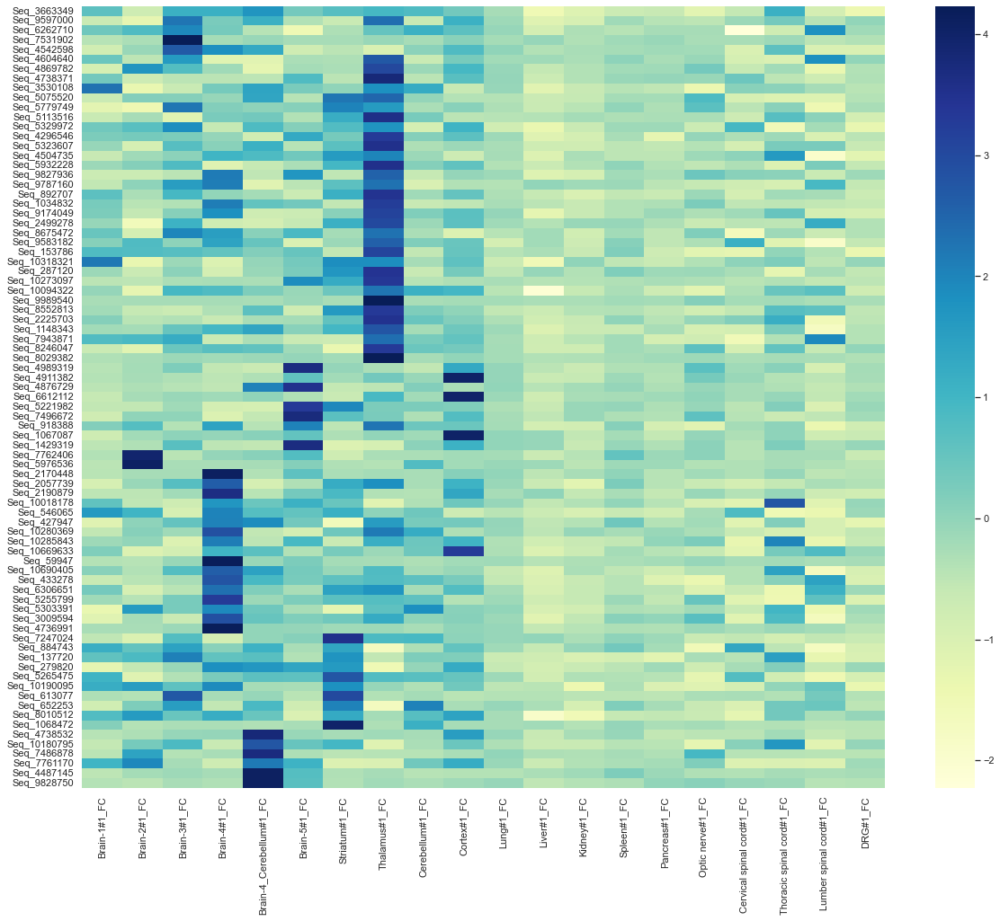

In [909]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep1_filter['Header_ID'])

In [901]:
rep2_filter = rep2_sel_sort[
    (rep2_sel_sort['Heart#2_FC'] < 0 ) &
    (rep2_sel_sort['Muscle#2_FC'] < 0) &
    (rep2_sel_sort['Lung#2_FC'] < 0 ) &
    (rep2_sel_sort['Liver#2_FC'] < 0) & 
    (rep2_sel_sort['Kidney#2_FC'] < 0) &
    (rep2_sel_sort['Pancreas#2_FC'] < 0) &
    (rep2_sel_sort['DRG#2_FC'] < 0)
]

In [902]:
rep2_filter.shape

(54, 24)

<AxesSubplot:>

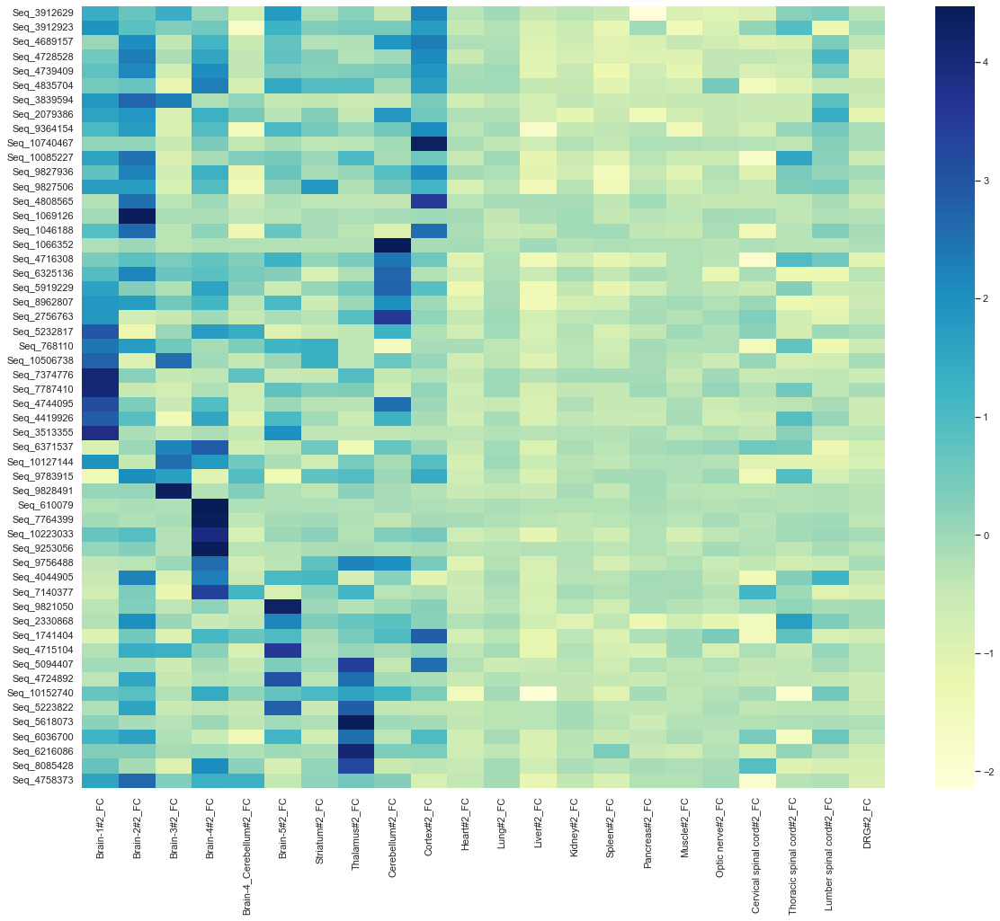

In [910]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_filter.iloc[:, 1:len(rep2_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['Header_ID'])

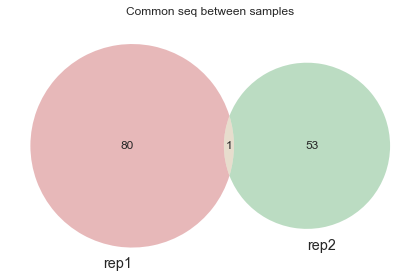

In [914]:
column = 'Common seq between samples'

plt.figure(figsize=(6,6))
venn2(subsets=(set(rep1_filter['Header_ID']), set(rep2_filter['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()
plt.show()

In [912]:
common_seq = list(set(rep1_filter['Header_ID']) & set(rep2_filter['Header_ID']))

In [913]:
common_seq

['Seq_9827936']

In [917]:
idx_rep1 = [brain_rep1[brain_rep1['Header_ID'] == seqID].index[0] for seqID in rep1_filter['Header_ID']]
rep1_filter_seq = brain_rep1.loc[idx_rep1, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

idx_rep2 = [brain_rep2[brain_rep2['Header_ID'] == seqID].index[0] for seqID in rep2_filter['Header_ID']]
rep2_filter_seq = brain_rep2.loc[idx_rep2, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

In [918]:
rep1_filter_seq

,Header_ID,Reverse_complementary,cluster
0,Seq_3663349,AACCGACCAATTAGACCCAGAAATCTG,0
1,Seq_9597000,AACCTCCCACGAACTCCCCGTCGTCGA,0
2,Seq_6262710,AACAGACCAACTCTTCCCAGTCTGCTC,0
3,Seq_7531902,CCTCGACCAATTATTCCCCAGATCCGC,0
4,Seq_4542598,AACCCCCCAATTCGTCCCCTCCCTCGG,0
...,...,...,...
76,Seq_10180795,AATATTCCAAGAAACCCCCTTATCAGA,6
77,Seq_7486878,ACTCGACCAATTATTCCCCAGCTCCGC,6
78,Seq_7761170,CGTAGCCCAATTCTGCCCCTGCGTAGC,6
79,Seq_4487145,AGTAGACCAACTACCCCCCGAATTCGG,6


In [919]:
rep2_filter_seq

,Header_ID,Reverse_complementary,cluster
0,Seq_3912629,CACACTCCAAGACTGCCCCGTCCCCTG,0
1,Seq_3912923,CACACTCCAAGTCGGCCCCGTCCCCTG,0
2,Seq_4689157,CTGCTCCCACTTAAGCCCCAGCTCCGG,0
3,Seq_4728528,CTGCTCCCACTTAAGCCCCCGATCCGG,0
4,Seq_4739409,CTGCTCCCACATAAGCCCCAGATCCGG,0
5,Seq_4835704,CTGAACCCACTGAGTCCCAATACCCGG,0
6,Seq_3839594,CTGCTCCCACTTAAGCCCCAGATCCTG,0
7,Seq_2079386,CTGAGACCACTTACTCCCCGCCTCAGT,0
8,Seq_9364154,CGTCTCCCAAGACGTCCCAACCGCCTA,0
9,Seq_10740467,AGTCTCCCAAGTAGCCCCATTCGAAAA,0


In [923]:
rep1_filter_seq[rep1_filter_seq['cluster'] == 0]['Reverse_complementary']

'AACCGACCAATTAGACCCAGAAATCTG'

### 各グループの配列における特徴 ------

In [922]:
import logomaker as lm

In [939]:
def logo_fig(pos_freq, title):
    sns.set_style("white")
    color_scheme = {
        'T' : [0, 0.5, 0], # green
        'A' : [1, 0, 0], # red
        'G' : [1, 0.65, 0], # yellow
        'C' :[0, 0, 1], # blue
        'N': 'gray'
    }
    logo = lm.Logo(
        pos_freq,
        baseline_width=0.1,
        vpad=0.08,
        fade_probabilities=False,
        stack_order='small_on_top',
        color_scheme=color_scheme
        #font_name='Luxi Mono',
        #color_scheme='class',
        #font_name='Rosewood Std',
        #figsize=(30, 2.5)
    )

    logo.style_spines(spines=['left', 'right'], visible=False)

    # style using Axes methods
    logo.ax.set_xticks(np.arange(1, len(pos_freq)+1, step=1))
    logo.ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
    logo.ax.set_xlabel('Position')
    logo.ax.set_ylabel('Frequency')
    logo.ax.set_title(f'{title}')
    plt.show()

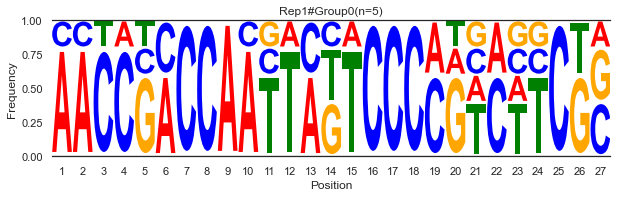

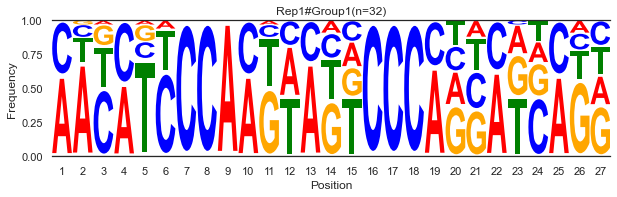

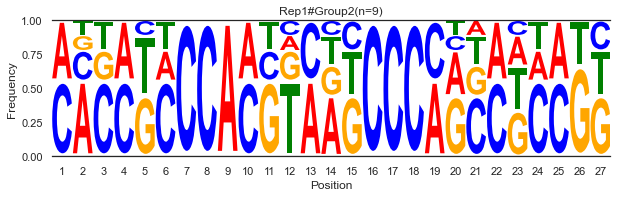

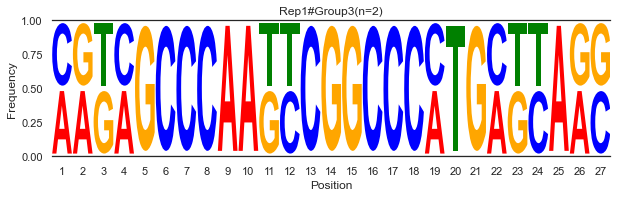

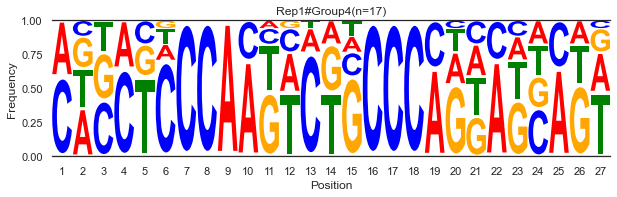

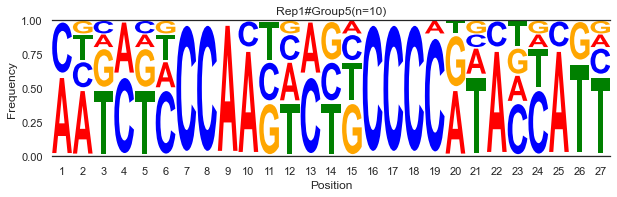

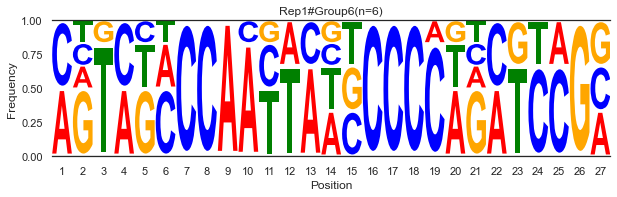

In [991]:
rep1_groups = []
for i in rep1_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep1_filter_seq[rep1_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep1#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep1#Group'+ str(i)
    rep1_groups.append(name)
    logo_fig(pos_freq, title)

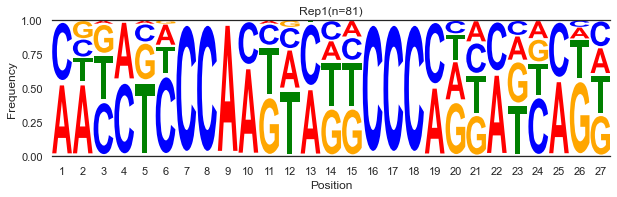

In [1008]:
nucl = pd.DataFrame()
seqs = rep1_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep1'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

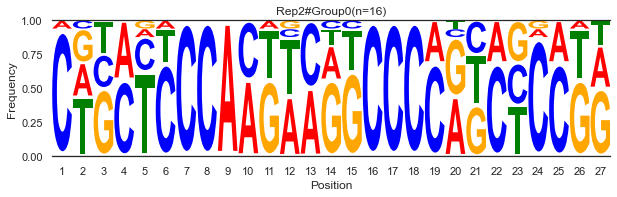

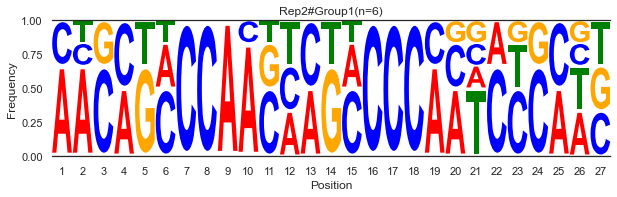

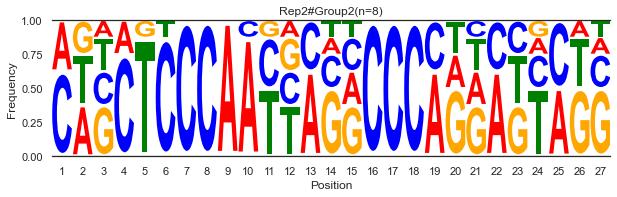

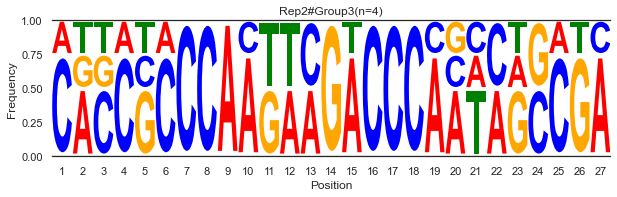

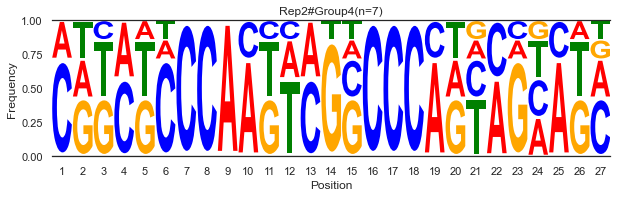

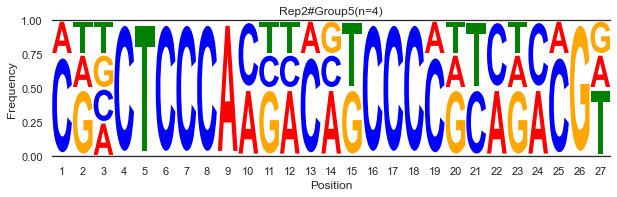

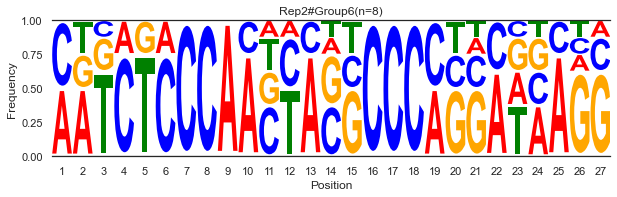

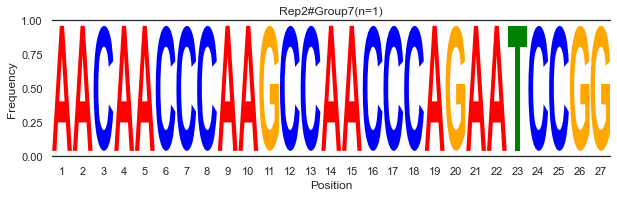

In [992]:
rep2_groups = []
for i in rep2_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep2_filter_seq[rep2_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep2#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep2#Group'+ str(i)
    rep2_groups.append(name)
    logo_fig(pos_freq, title)

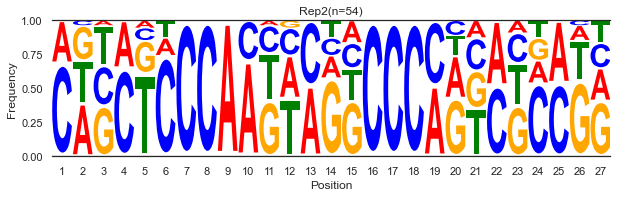

In [1009]:
nucl = pd.DataFrame()
seqs = rep2_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep2'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

In [969]:
def pwm(cnt, total, bg=0.25):
    p = (cnt + (np.sqrt(total) * 0.25)) / (total + (4 * (np.sqrt(total) * 0.25)))
    pwm_score = np.log2(p/bg)
    return pwm_score

In [1048]:
array_list = []
for i in rep1_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep1_filter_seq[rep1_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    pos_cnt = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A')
        T = col_list.count('T')
        G = col_list.count('G')
        C = col_list.count('C')
        freq = pd.Series([A, T, G, C])
        pos_cnt = pos_cnt.append(freq, ignore_index=True)
    cnt = pos_cnt.to_numpy().astype(int)
    total = nucl.index.size
    #pwm_score = pwm(cnt, total)
    #array_list.append(np.array(pwm_score))
    pwm_max = pwm_score.argmax(axis=1)
    array_list.append(pwm_max)
rep1_group_seq = np.array(array_list)

In [1003]:
array_list = []
for i in rep2_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep2_filter_seq[rep2_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    pos_cnt = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A')
        T = col_list.count('T')
        G = col_list.count('G')
        C = col_list.count('C')
        freq = pd.Series([A, T, G, C])
        pos_cnt = pos_cnt.append(freq, ignore_index=True)
    cnt = pos_cnt.to_numpy().astype(int)
    total = nucl.index.size
    pwm_score = pwm(cnt, total)
    pwm_max = pwm_score.argmax(axis=1)
    array_list.append(pwm_max)
rep2_group_seq = np.array(array_list)

In [1004]:
rep12_merge_seq = np.vstack([rep1_group_seq, rep2_group_seq])

In [1005]:
rep12_merge_seq.shape

(15, 27)

In [994]:
rep12_groups = rep1_groups + rep2_groups

Text(0, 0.5, 'Cluster distance')

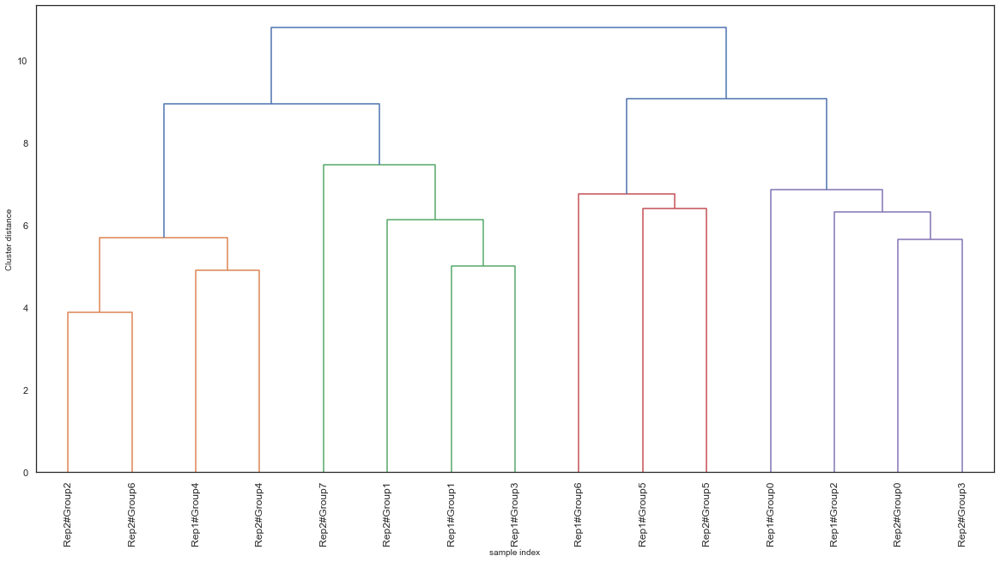

In [1006]:
sns.set_style("white")
linkage_array = ward(rep12_merge_seq)

ax = plt.figure(figsize=(20,10)).gca()
res = dendrogram(linkage_array, labels=rep12_groups)
bounds = ax.get_xbound()
plt.xticks(rotation=90)
plt.xlabel("sample index",fontsize=10)
plt.ylabel("Cluster distance",fontsize=10)

In [877]:
outf1 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_1.txt'
brain_rep1.to_csv(outf1, sep='\t', index=False)
outf2 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_2.txt'
brain_rep2.to_csv(outf2, sep='\t', index=False)

## 本番 --------

In [1212]:
# tissue grouping (DRG#1: 神経組織)----

#infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
rep1 = pd.read_excel(infile, sheet_name='100-131')
rep2 = pd.read_excel(infile, sheet_name='200-231')

In [1213]:
print(rep1.shape)
print(rep2.shape)
headerID = rep1['Header_ID']

(2528, 21)
(2528, 23)


In [1214]:
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC'
]

# tissue grouping (DRG#1: 神経組織)----
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]
others_2 = [
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC',
    'Spleen#2_FC'
]

In [1215]:
group_1 = pd.DataFrame()
for i in range(len(rep1)):
    b = rep1.loc[i, brain_1].mean()
    n = rep1.loc[i, nerve_1].mean()
    o = rep1.loc[i, others_1].mean()
    col = pd.Series([b, n, o])
    group_1 = group_1.append(col, ignore_index=True)
group_1.columns = ['Brain#1', 'Nerve#1', 'Others#1']
rep1_group = pd.concat([headerID, group_1], axis=1)

In [1216]:
rep1_group

,Header_ID,Brain#1,Nerve#1,Others#1
0,Seq_6375,0.399326,-0.022185,-0.776467
1,Seq_10846,-0.082966,-0.580762,0.746694
2,Seq_49364,-0.167529,-0.498685,0.833742
3,Seq_52061,-0.280495,-0.161674,0.722665
4,Seq_56859,0.145094,0.085737,-0.375924
...,...,...,...,...
2523,Seq_10740289,0.275440,0.089622,-0.640502
2524,Seq_10740467,0.275468,-0.126566,-0.424369
2525,Seq_10742571,0.098185,0.047638,-0.244008
2526,Seq_10747946,0.172692,0.186842,-0.532227


In [1217]:
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 0) & (rep1_group['Others#1'] < 0) & (rep1_group['Nerve#1'] < 0)]

In [1218]:
group_1_sel.shape

(752, 4)

<AxesSubplot:>

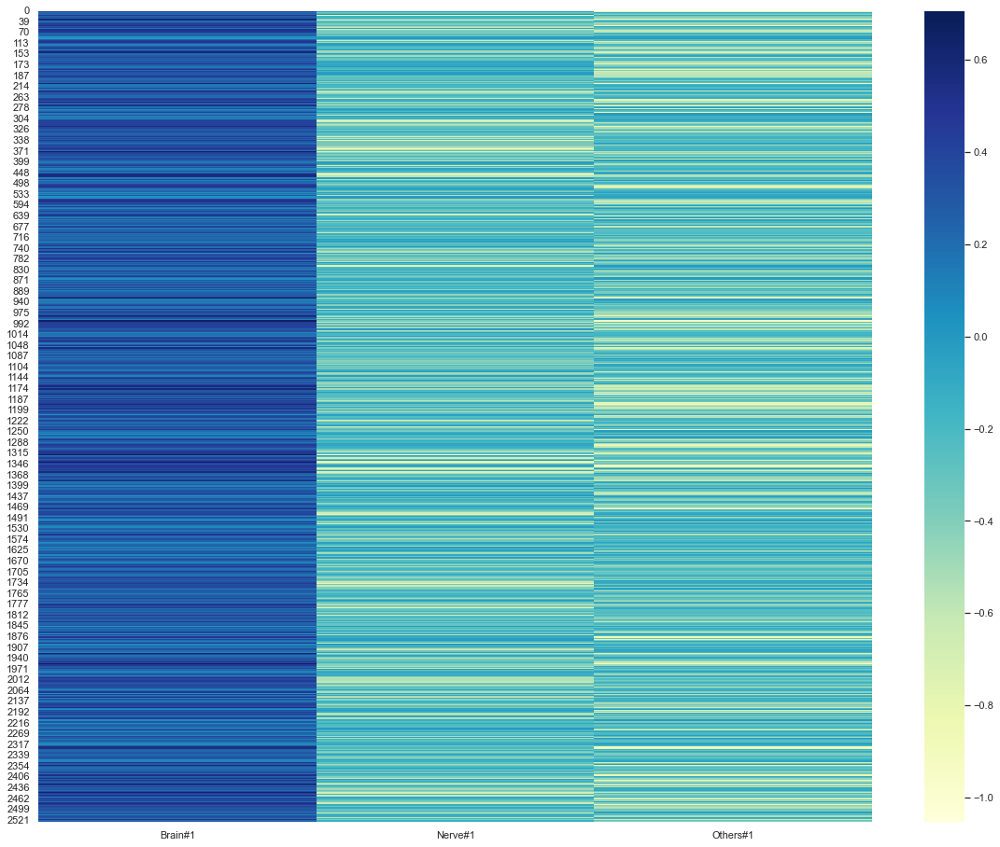

In [1063]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_1_sel.iloc[:, 1:], cmap='YlGnBu')

In [1219]:
group_2 = pd.DataFrame()
for i in range(len(rep2_z_mod)):
    b = rep2.loc[i, brain_2].mean()
    n = rep2.loc[i, nerve_2].mean()
    o = rep2.loc[i, others_2].mean()
    col = pd.Series([b, n, o])
    group_2 = group_2.append(col, ignore_index=True)
group_2.columns = ['Brain#2', 'Nerve#2', 'Others#2']
rep2_group = pd.concat([headerID, group_2], axis=1)

In [1220]:
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 0) & (rep2_group['Others#2'] < 0) & (rep2_group['Nerve#2'] < 0)]

In [1221]:
group_2_sel.shape

(754, 4)

<AxesSubplot:>

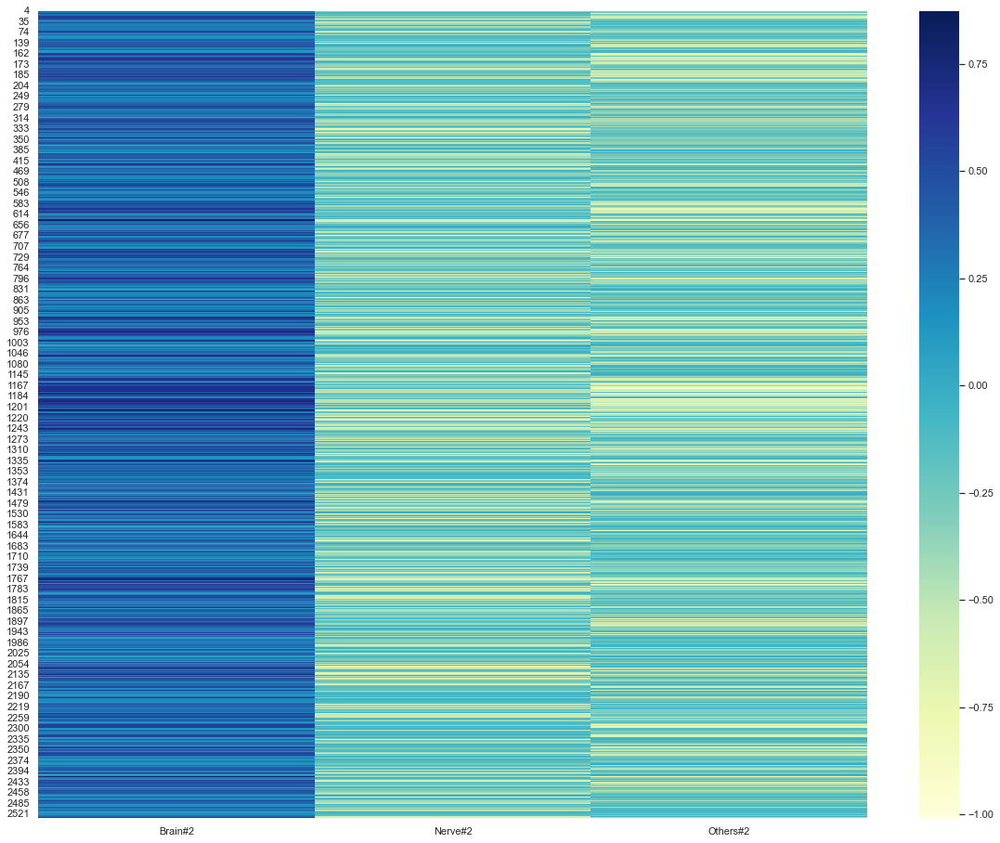

In [1070]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_2_sel.iloc[:, 1:], cmap='YlGnBu')

In [1222]:
idx_rep1 = sorted([rep1[rep1['Header_ID'] == seqID].index[0] for seqID in group_1_sel['Header_ID']])
rep1_sel = pd.concat([group_1_sel['Header_ID'].reset_index(drop=True), rep1.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)
idx_rep2 = sorted([rep2[rep2['Header_ID'] == seqID].index[0] for seqID in group_2_sel['Header_ID']])
rep2_sel = pd.concat([group_2_sel['Header_ID'].reset_index(drop=True), rep2.loc[idx_rep2, rep2_columns].reset_index(drop=True)], axis=1)

In [1223]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(752, 21)
(754, 23)


<AxesSubplot:>

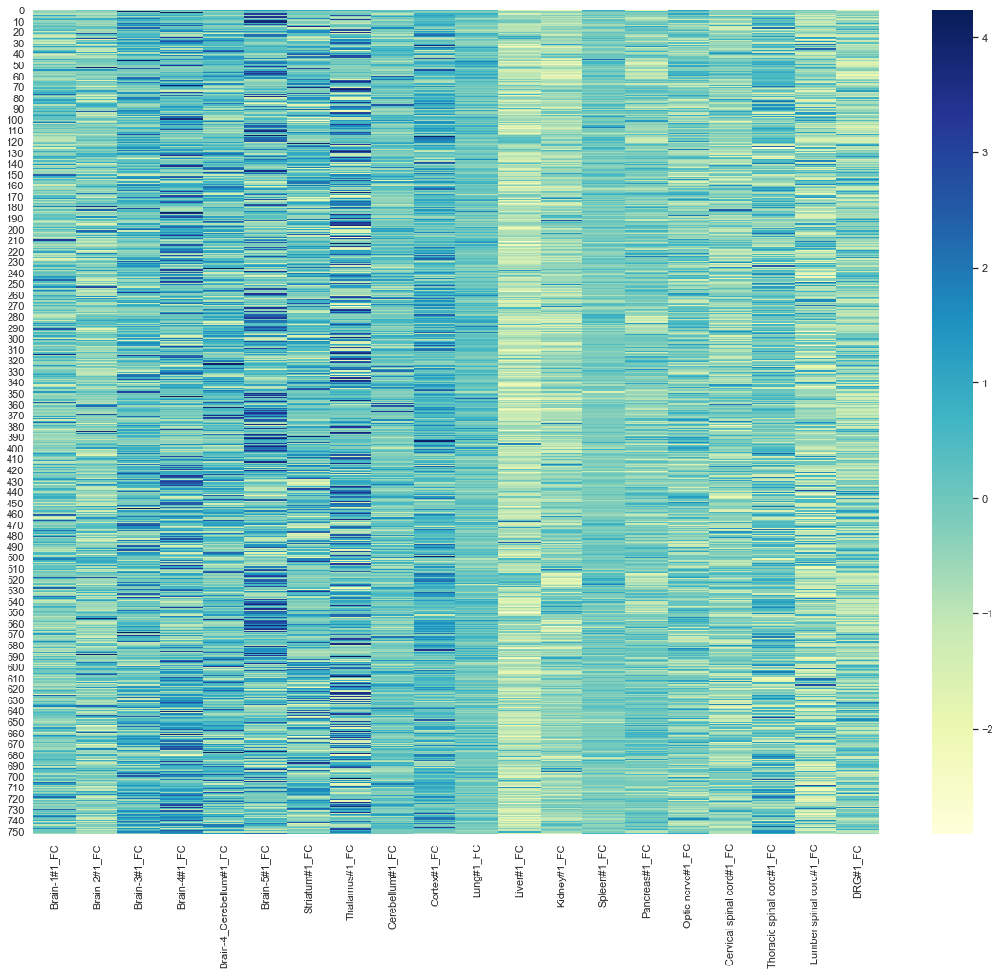

In [1077]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

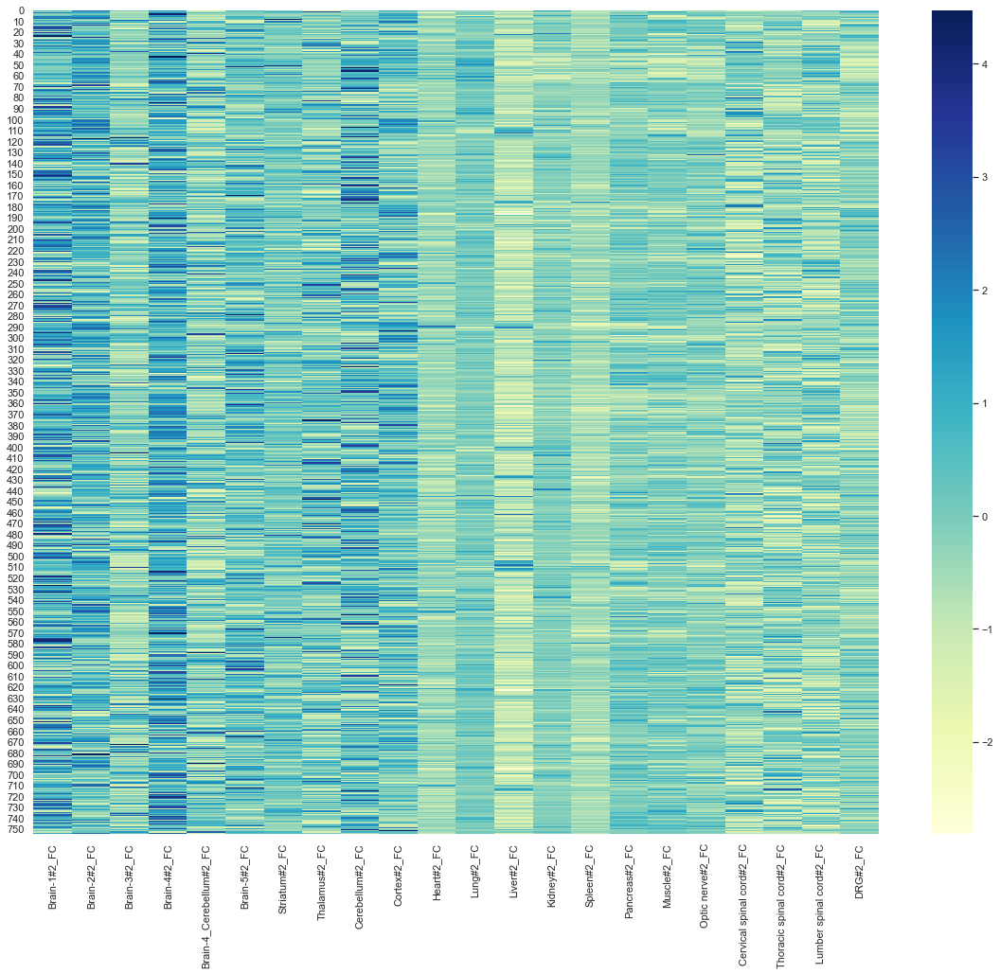

In [1079]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel.iloc[:, 1:], cmap='YlGnBu')

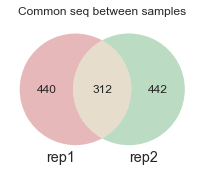

In [1080]:
column = 'Common seq between samples'

plt.figure(figsize=(3,3))
venn2(subsets=(set(rep1_sel['Header_ID']), set(rep2_sel['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()

### 最適なクラスター数の探索 -------

In [1138]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import linkage

num = 10 # クラスター数を10個までの範囲で比較
NUM_CLUSTERS_RANGE = range(2, num+1)  
X1 = rep1_sel.iloc[:, 1:]
X2 = rep2_sel.iloc[:, 1:]

davies_bouldin_index1 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X1)
    labels = kmeans.labels_
    davies_bouldin_index1.append(davies_bouldin_score(X1, labels))

davies_bouldin_index2 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X2)
    labels = kmeans.labels_
    davies_bouldin_index2.append(davies_bouldin_score(X2, labels))

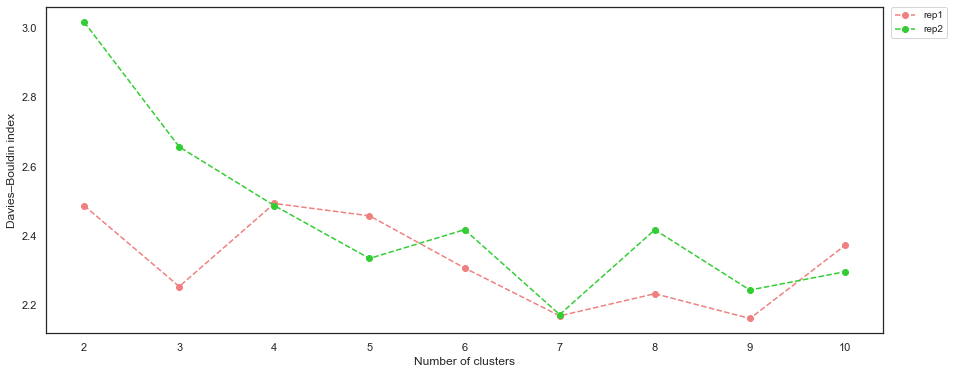

In [1139]:
sns.set_style("white")
plt.figure(figsize=(15, 6))
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index1, marker='o', linestyle='--', c='lightcoral', label='rep1')
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index2, marker='o', linestyle='--', c='limegreen', label='rep2')
plt.xlabel('Number of clusters')
plt.ylabel('Davies–Bouldin index')
#plt.axvline(x=7, color='gray', linestyle='--')
plt.legend(
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10
)
plt.show()

rep1と2ともにk=7に決定

In [1108]:
np.random.seed(0)
model = KMeans(n_clusters=7, init='k-means++',  random_state=1)
model.fit(rep1_sel.iloc[:, 1:])
rep1_sel['cluster'] = model.labels_
rep1_sel_sort = rep1_sel.sort_values('cluster')

<AxesSubplot:>

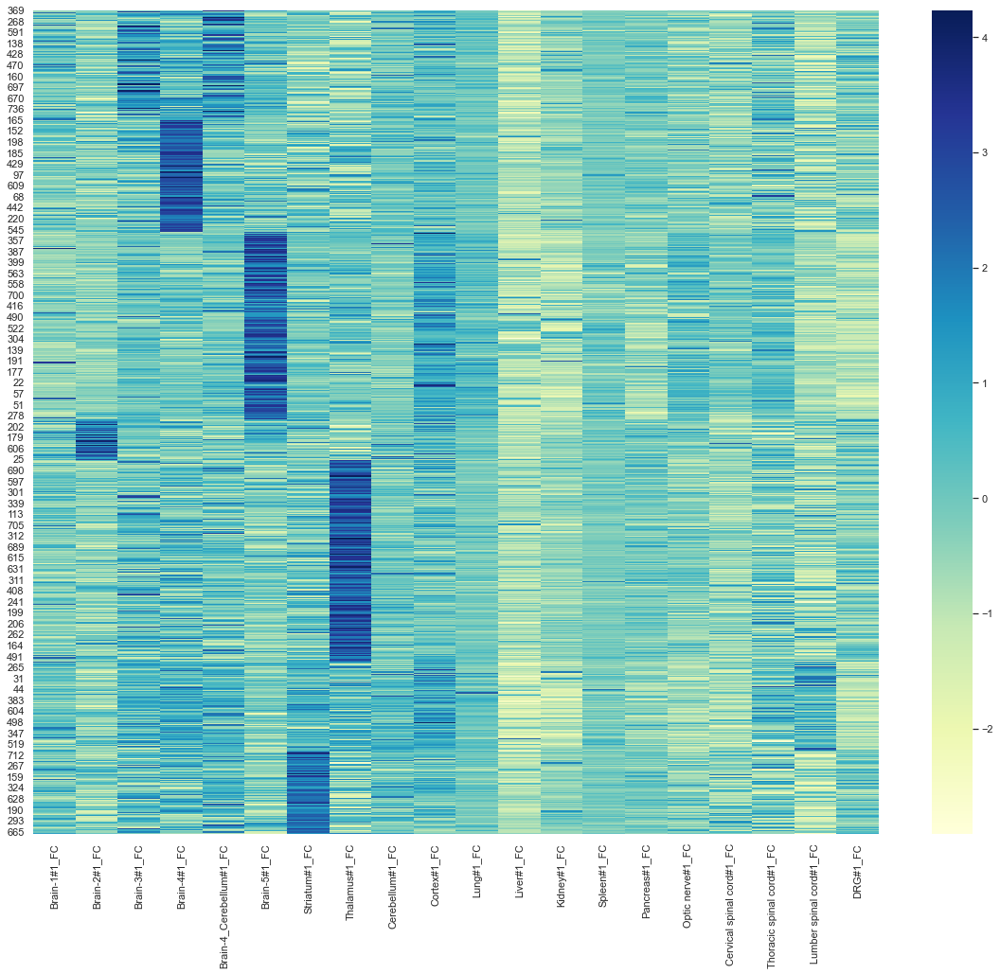

In [1109]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel_sort.iloc[:, 1:len(rep1_sel_sort.columns) - 1], cmap='YlGnBu')

In [1106]:
np.random.seed(0)
model = KMeans(n_clusters=7, init='k-means++',  random_state=1)
model.fit(rep2_sel.iloc[:, 1:])
rep2_sel['cluster'] = model.labels_
rep2_sel_sort = rep2_sel.sort_values('cluster')

<AxesSubplot:>

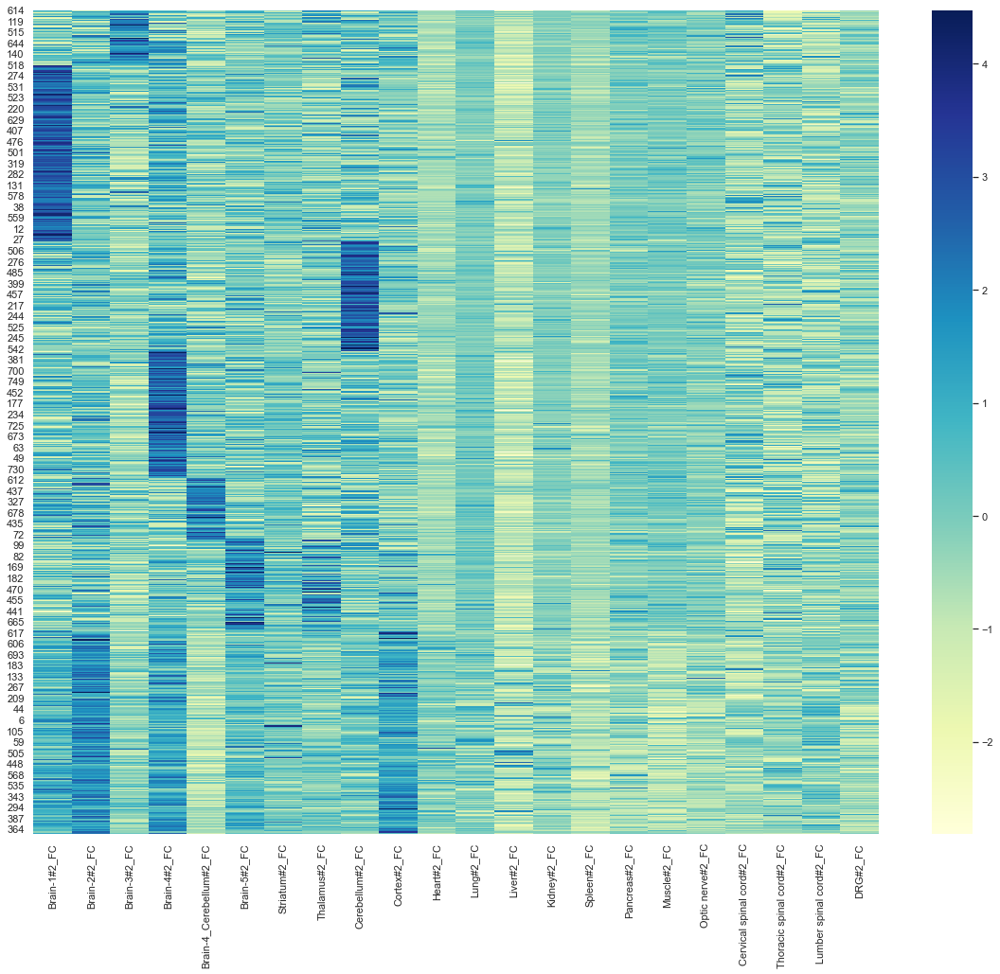

In [1107]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel_sort.iloc[:, 1:len(rep2_sel_sort.columns) - 1], cmap='YlGnBu')

In [1230]:
# 再抽出 -----
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_1_nerve.txt'
df1 = pd.read_csv(infile, sep='\t')

In [1246]:
df1.head()

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR,cluster
0,Seq_4739780,CCGGATCTGGGGCTTGAGTGGGAGCAG,CTGCTCCCACTCAAGCCCCAGATCCGG,76,103,105,110,318,186,88,...,3.093440e-04,1.500000,1.000000e+00,3.230769,1.000000e+00,2.346154,1.000000e+00,2.000000,1.000000e+00,0
1,Seq_3593133,CAGACTCCTGGGTCGAATTGGGCTACG,CGTAGCCCAATTCGACCCAGGAGTCTG,27,30,430,275,34,44,51,...,1.000000e+00,0.968750,1.000000e+00,1.093750,1.000000e+00,1.687500,1.000000e+00,0.937500,1.000000e+00,0
2,Seq_7146523,GATGGTTTTGGGATGTCGTGGGCTCAG,CTGAGCCCACGACATCCCAAAACCATC,1850,926,773,1133,1249,798,1115,...,5.806829e-73,0.768421,1.000000e+00,1.061053,1.000000e+00,1.195789,1.000000e+00,0.585263,1.150048e-10,0
3,Seq_1170050,AATTATAAGGGGGATTCGTGGGATCAG,CTGATCCCACGAATCCCCCTTATAATT,2129,3097,3521,4033,4030,1745,3266,...,6.229386e-27,0.706515,4.437826e-32,0.937238,5.516263e-18,1.100418,1.000000e+00,0.955768,3.841983e-01,0
4,Seq_4809391,CCGGGGACTGGGAAGGCGTGGGAGTCT,AGACTCCCACGCCTTCCCAGTCCCCGG,1231,736,1546,1209,1164,526,681,...,1.262632e-24,1.226727,1.000000e+00,2.037538,1.106415e-23,1.963964,5.131907e-20,2.732733,3.707998e-94,0


In [1233]:
df1.shape

(752, 176)

In [1232]:
print(rep1.shape)
rep1.head()

(2528, 21)


,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC
0,Seq_6375,-0.643358,0.077647,-0.587897,0.465880,0.965038,1.464195,0.965038,0.632266,0.133109,...,0.299494,-1.586211,-1.863521,1.242347,-0.088739,0.133109,-0.033277,0.965038,-1.697135,-1.364364
1,Seq_10846,-0.663728,-0.248898,-0.318037,-0.179760,-0.732867,-0.110621,0.442486,0.719039,-0.594590,...,0.719039,3.484574,-0.732867,-0.248898,0.165932,-0.940282,-1.078559,0.096794,0.165932,-0.802005
2,Seq_49364,0.622072,-0.749620,-0.065724,0.458249,-0.163238,-0.341363,-0.017617,0.211215,-1.022659,...,-0.033220,3.478574,-0.249050,-0.709315,0.186511,0.255421,-1.183881,0.990024,-0.017617,-1.042161
3,Seq_52061,-0.547355,-0.449961,-0.625270,-0.177257,-0.527876,0.757726,-0.488919,-0.352567,-0.508397,...,-0.488919,2.043329,-0.566834,0.095446,0.153883,0.114925,-0.644749,3.270495,-0.644749,-0.527876
4,Seq_56859,-0.877157,-0.679302,0.573779,0.507828,0.178069,2.024715,0.244021,-0.877157,-1.009060,...,0.507828,-1.536673,-0.679302,2.090667,-0.349544,0.375924,-1.140963,-0.019785,-0.151689,-0.547399


In [1248]:
idx_rep1 = [rep1[rep1['Header_ID'] == seqID].index[0] for seqID in df1['Header_ID']]
rep1_sel_sort = pd.concat([rep1.loc[idx_rep1, :].reset_index(drop=True), df1['cluster'].reset_index(drop=True)], axis=1)

In [1264]:
rep1_sel_sort

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC,cluster
0,Seq_4739780,-0.476390,-0.021079,0.012648,0.096964,3.604541,1.378579,-0.274029,-0.240303,-0.206576,...,-1.218377,-0.712477,-0.088533,-0.172849,-0.088533,-0.763067,-0.240303,-0.476390,-0.695613,0
1,Seq_3593133,-0.569977,-0.541215,3.293787,1.807724,-0.502865,-0.406990,-0.339877,-0.522040,0.014861,...,-0.464515,-0.378227,-0.378227,-0.502865,-0.349465,-0.531627,-0.378227,0.062798,-0.502865,0
2,Seq_7146523,2.259633,0.039761,-0.327816,0.537070,0.815755,-0.267754,0.493826,-2.148880,1.219368,...,-1.235945,-0.505598,-0.512805,0.659595,0.652388,-1.514631,-0.195680,-0.512805,-0.399889,0
3,Seq_1170050,-0.436839,0.797069,1.337541,1.990187,1.986363,-0.926324,1.012493,-1.055068,-0.288974,...,-1.482092,-0.717273,-0.775909,-1.290887,-0.485278,-0.007266,-0.121989,-0.142384,0.273168,0
4,Seq_4809391,0.704599,-0.756245,1.634228,0.639673,0.506869,-1.375998,-0.918561,0.869867,0.740014,...,-0.446369,-0.399150,0.385870,-2.137407,-0.174859,-1.296315,-0.360784,0.415382,-0.027299,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
747,Seq_613077,-0.315263,-0.389333,2.721631,-0.241192,-0.074534,-0.435628,3.017913,-0.380075,-0.231933,...,-0.398592,-0.472663,-0.287486,-0.259710,-0.380075,0.342113,-0.463404,-0.500439,-0.407851,6
748,Seq_7948979,0.163500,0.727951,0.692226,1.606779,-1.172605,-0.262815,2.330800,0.034891,-0.122298,...,-1.008271,-0.053230,0.806545,-0.212800,-1.629881,-1.622736,-0.405714,0.332597,0.758912,6
749,Seq_9785921,0.446076,-0.551394,0.878489,-0.458544,-0.607103,0.857267,2.122673,-1.758438,0.507091,...,-0.962585,-0.341819,1.220706,-1.763744,1.149080,-0.469156,0.034885,0.167527,-0.219788,6
750,Seq_9763860,0.040264,-0.614151,1.745139,-0.140784,2.024255,-1.396809,2.439158,-0.785770,-0.278457,...,-1.008309,-0.585862,-0.440646,0.543806,-0.500995,0.032721,-0.344464,-0.084206,0.357100,6


In [1265]:
rep1_filter = rep1_sel_sort[
    (rep1_sel_sort['Lung#1_FC'] < 0 ) &
    (rep1_sel_sort['Liver#1_FC'] < 0) & 
    (rep1_sel_sort['Kidney#1_FC'] < 0) &
    (rep1_sel_sort['Pancreas#1_FC'] < 0) &
    (rep1_sel_sort['Spleen#1_FC'] < 0) &
    (rep1_sel_sort['DRG#1_FC'] < 0)
]

In [1266]:
rep1_filter

,Header_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,...,Liver#1_FC,Kidney#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,Spleen#1_FC,Pancreas#1_FC,DRG#1_FC,cluster
9,Seq_7486878,-0.461085,1.421737,-0.406112,-0.268680,3.703112,-0.309910,-0.474828,-0.419856,-0.433599,...,-0.309910,-0.351139,0.940724,-0.433599,-0.419856,-0.447342,-0.241194,-0.351139,-0.447342,0
12,Seq_4738532,-0.425183,-0.313047,-0.070085,-0.032706,3.798611,-0.107464,-0.256979,-0.163532,-0.238289,...,-0.612076,-0.275668,-0.462562,-0.462562,-0.200911,-0.574698,-0.070085,-0.537319,-0.462562,0
14,Seq_7531902,-0.417968,-0.305004,4.213567,-0.214632,-0.101668,-0.237225,-0.237225,-0.101668,-0.237225,...,-0.079075,-0.350189,-0.282411,-0.259818,-0.146854,-0.463154,-0.169446,-0.101668,-0.372782,0
21,Seq_4542598,-0.830962,-0.082745,2.704880,1.816373,1.301974,-0.763414,-0.480235,-0.973850,0.044555,...,-0.360729,-0.272397,-0.207448,-0.984242,0.626501,-0.976448,-0.217840,-0.176272,-0.968654,0
66,Seq_3117150,0.858289,-0.331248,1.510616,0.050555,0.664510,1.263116,0.021776,-1.428692,-0.597934,...,-0.628632,-0.409911,-0.929853,-1.265610,2.464164,0.679859,-0.502004,-0.181596,-1.077586,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701,Seq_279820,-1.222085,-0.573147,-0.096130,1.826469,1.666656,1.361558,1.620649,-1.486019,-0.038016,...,-0.863716,-0.655475,-0.754753,-0.243836,0.165382,-0.607047,-0.481134,-0.173615,-0.098551,6
702,Seq_10318321,2.197820,-1.314831,-0.112750,-1.034053,-0.033781,0.346439,1.849772,1.843923,-0.247290,...,-1.525415,-0.004533,-0.384754,0.030564,0.217749,-0.504669,-0.533917,-0.659682,-0.051330,6
712,Seq_5265475,1.042409,-1.116305,-0.377347,0.252135,0.628456,0.607929,2.746116,0.799511,0.676351,...,-0.815248,-0.336294,-1.222359,0.755036,-0.835774,-1.444730,-0.384189,-0.425243,-0.914460,6
719,Seq_5779749,-1.204700,-1.457655,2.223945,0.148061,0.032582,0.112318,2.025980,1.588807,-0.297360,...,-0.646548,-0.459581,0.653972,-0.481577,0.093071,-1.457655,-0.008661,-0.327605,-0.283612,6


In [1268]:
rep1_filter.shape

(92, 22)

<AxesSubplot:>

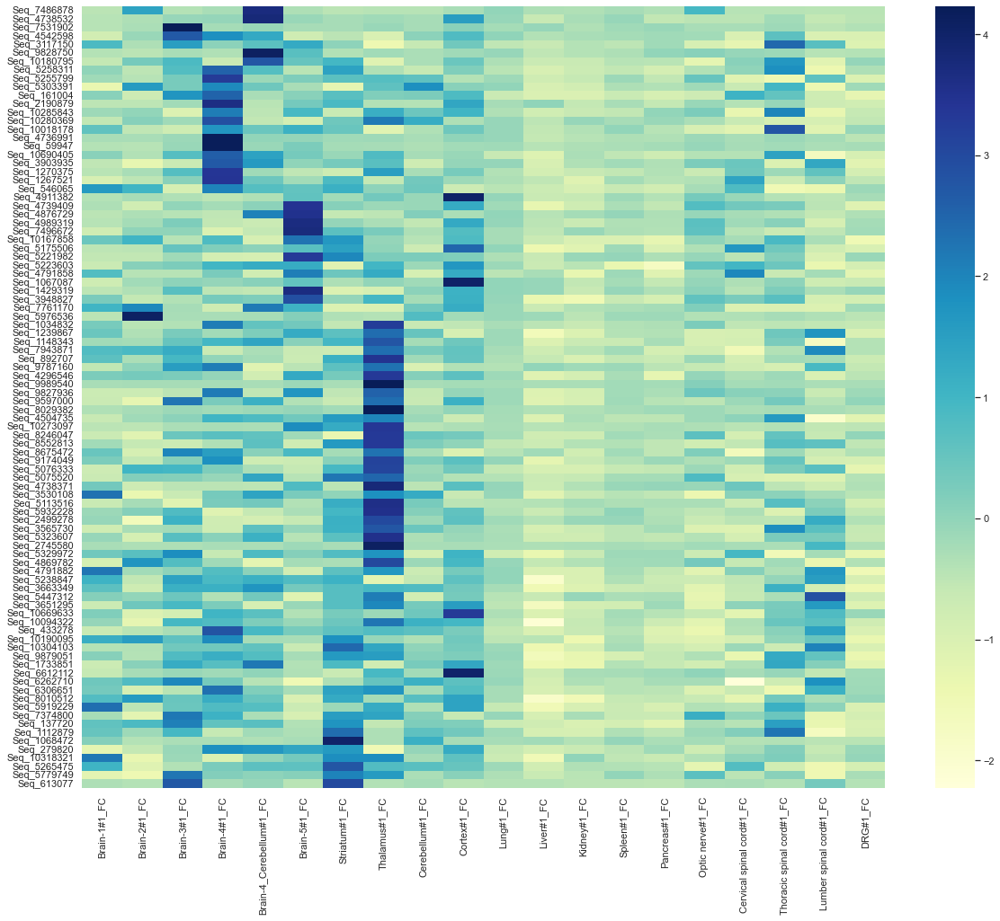

In [1141]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep1_filter['Header_ID'])

In [1276]:
rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1].columns.values

array(['Brain-1#1_FC', 'Brain-2#1_FC', 'Brain-3#1_FC', 'Brain-4#1_FC',
       'Brain-4_Cerebellum#1_FC', 'Brain-5#1_FC', 'Striatum#1_FC',
       'Thalamus#1_FC', 'Cerebellum#1_FC', 'Cortex#1_FC', 'Lung#1_FC',
       'Liver#1_FC', 'Kidney#1_FC', 'Optic nerve#1_FC',
       'Cervical spinal cord#1_FC', 'Thoracic spinal cord#1_FC',
       'Lumber spinal cord#1_FC', 'Spleen#1_FC', 'Pancreas#1_FC',
       'DRG#1_FC'], dtype=object)

In [1298]:
rep1_filter.loc[:, ['cluster']].columns.values

array(['cluster'], dtype=object)

In [1303]:
fig = make_subplots()
fig.add_trace(
    go.Heatmap(
        z=rep1_filter.loc[:, ['cluster']],
        x=rep1_filter.loc[:, ['cluster']].columns.values,
        y=rep1_filter['Header_ID']
    )
)

In [1308]:
rep1_filter.loc[:, ['cluster']]

,cluster
9,0
12,0
14,0
21,0
66,0
...,...
701,6
702,6
712,6
719,6


In [1357]:
# make heatmap ---

fig = make_subplots(
    rows=1,
    cols=2,
    y_title='Seq_ID',
    x_title='Sample(normalized)',
    column_widths=[1, 30],
    horizontal_spacing=0.00001,
    shared_yaxes=True
)


fig.add_trace(
    go.Heatmap(
        z=rep1_filter.loc[:, ['cluster']],
        y = rep1_filter['Header_ID'],
        x=rep1_filter.loc[:, ['cluster']].columns.values,
        colorscale='rainbow',
        showscale=False
    ),
    row=1,
    col=1
)


x = rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1].columns.values
z = rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1]

fig.add_trace(
    go.Heatmap(
        colorbar=dict(
            title='z-score'
        ),
        z=z,
        x=x,
        #y=y,
        colorscale='Viridis'
    ),
    row=1,
    col=2
)

fig.update_layout(
    #plot_bgcolor='white'
    height=800,
    width=700,
    font=dict(
        size=5
    )
)

fig.update_annotations(
   font=dict(size=10),
)

fig.update_yaxes(autorange='reversed')

fig.update_layout(
    title=dict(
        text='Brain_High_heatmap_rep1',
        x=0.5,
        xanchor='center'
    ),
)


fig.show()
htmlfile = os.path.join(
    '/Users/tomoyauchiyama/code/CNN/test/PG4699',
    'PG4699_Brain_High_heatmap_rep1.html'
)
fig.write_html(htmlfile)

In [1238]:
# 再抽出 -----
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_2_nerve.txt'
df2 = pd.read_csv(infile, sep='\t')
print(df2.shape)

(754, 176)


In [1239]:
print(rep2.shape)
rep2.head()

(2528, 23)


,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Liver#2_FC,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC
0,Seq_6375,0.372173,1.807151,-0.640752,1.891561,-0.809573,0.540994,-0.218700,-0.218700,1.131867,...,-1.062804,-1.991319,-0.725162,0.794225,-0.049879,1.131867,-0.387521,-1.484856,-0.134289,-0.640752
1,Seq_10846,-0.133286,0.187433,-0.316554,0.187433,-0.866358,-0.545639,-0.362371,-0.362371,-1.049626,...,2.615735,0.004165,3.119722,-0.545639,-0.224920,-0.408188,-0.224920,0.324884,-0.270737,-0.499822
2,Seq_49364,0.025640,1.145222,-1.796896,-0.996215,0.274245,-0.584730,-1.035649,0.140513,0.788602,...,2.676290,-0.130382,0.114795,0.332539,-0.000078,-0.063515,1.993910,-0.255542,-0.039512,-0.461284
3,Seq_52061,-0.285119,-0.049528,-0.667955,0.244962,-0.903547,-0.137875,-0.461813,-0.697404,-0.638506,...,2.777569,-0.049528,-0.874098,-0.196772,-0.402915,0.068268,2.865916,-0.167323,-0.461813,0.303859
4,Seq_56859,0.579301,2.399959,0.237927,1.717212,-1.355149,0.693092,-0.103447,-1.468941,0.010345,...,-1.013776,1.148256,-0.444820,-1.127567,-0.672402,0.465509,-0.786194,-0.331029,-1.013776,0.237927


In [1252]:
idx_rep2 = [rep2[rep2['Header_ID'] == seqID].index[0] for seqID in df2['Header_ID']]
rep2_sel_sort = pd.concat([rep2.loc[idx_rep2, :].reset_index(drop=True), df2['cluster'].reset_index(drop=True)], axis=1)

In [1289]:
rep2_sel_sort

,Header_ID,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,...,Kidney#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,Spleen#2_FC,Pancreas#2_FC,Muscle#2_FC,DRG#2_FC,cluster
0,Seq_8765885,0.992971,-0.911607,0.854543,0.445226,-0.388922,0.648095,-0.348348,2.121876,1.013258,...,-0.496323,0.180304,1.140946,-2.017838,-1.340018,-0.706352,0.372432,0.387946,-0.431882,0
1,Seq_4802367,0.023116,1.435139,1.685155,1.429457,0.074256,1.119778,-1.468457,1.065797,-1.400271,...,0.187900,-0.042229,0.324272,-1.826435,-1.539485,-0.425776,-0.292245,0.511784,-0.874669,0
2,Seq_9225420,-1.805406,0.307004,1.342749,0.511596,0.856844,1.304389,1.122813,-0.956350,-1.319500,...,-0.204475,-0.721070,0.099855,-1.828422,0.685499,-0.276083,-0.483232,0.665039,-0.053589,0
3,Seq_593893,0.233761,0.403192,2.680549,-1.151590,-0.952259,-0.478847,-0.334332,1.424764,-0.244634,...,-0.065236,-0.663229,2.271921,-1.146606,-1.186473,0.163995,0.298543,0.144062,-0.379182,0
4,Seq_5320088,-0.654286,0.940050,0.180072,1.509224,-1.705319,-0.935640,0.487297,1.929637,1.525394,...,-0.023667,0.264155,-0.402038,-1.795870,-0.728667,-0.395571,0.322366,0.131563,-0.427910,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
749,Seq_4739554,0.295835,1.136803,-0.033240,1.794952,-1.020463,1.136803,0.149579,0.368962,-0.069804,...,0.113015,-1.422665,-0.289187,-0.289187,0.149579,-1.130155,-1.057027,-0.618261,-0.764517,6
750,Seq_4739409,0.761847,2.143417,-0.656081,2.034345,-0.401581,0.398276,0.252847,0.325561,0.398276,...,-0.510652,-0.401581,-0.837866,-0.619723,0.434633,-1.310508,-0.619723,-1.128723,-0.910580,6
751,Seq_4739105,0.613160,1.478378,-0.330713,2.146955,-0.488026,-0.016089,1.006441,0.023239,0.141224,...,-0.999291,-0.723994,-0.173401,-0.330713,-0.448698,-1.549884,-0.920634,0.455848,-1.235259,6
752,Seq_4808565,-0.265474,2.520788,-0.332452,-0.010960,-0.519989,-0.211892,-0.372638,-0.372638,-0.426220,...,-0.131519,-0.479802,-0.479802,-0.399429,-0.144915,-0.386034,-0.051146,-0.412825,-0.506593,6


In [1291]:
rep2_filter = rep2_sel_sort[
    (rep2_sel_sort['Heart#2_FC'] < 0 ) &
    (rep2_sel_sort['Muscle#2_FC'] < 0) &
    (rep2_sel_sort['Lung#2_FC'] < 0 ) &
    (rep2_sel_sort['Liver#2_FC'] < 0) & 
    (rep2_sel_sort['Kidney#2_FC'] < 0) &
    (rep2_sel_sort['Pancreas#2_FC'] < 0) &
    (rep2_sel_sort['Spleen#2_FC'] < 0) &
    (rep2_sel_sort['DRG#2_FC'] < 0)
]

In [1292]:
rep2_filter.shape

(66, 24)

<AxesSubplot:>

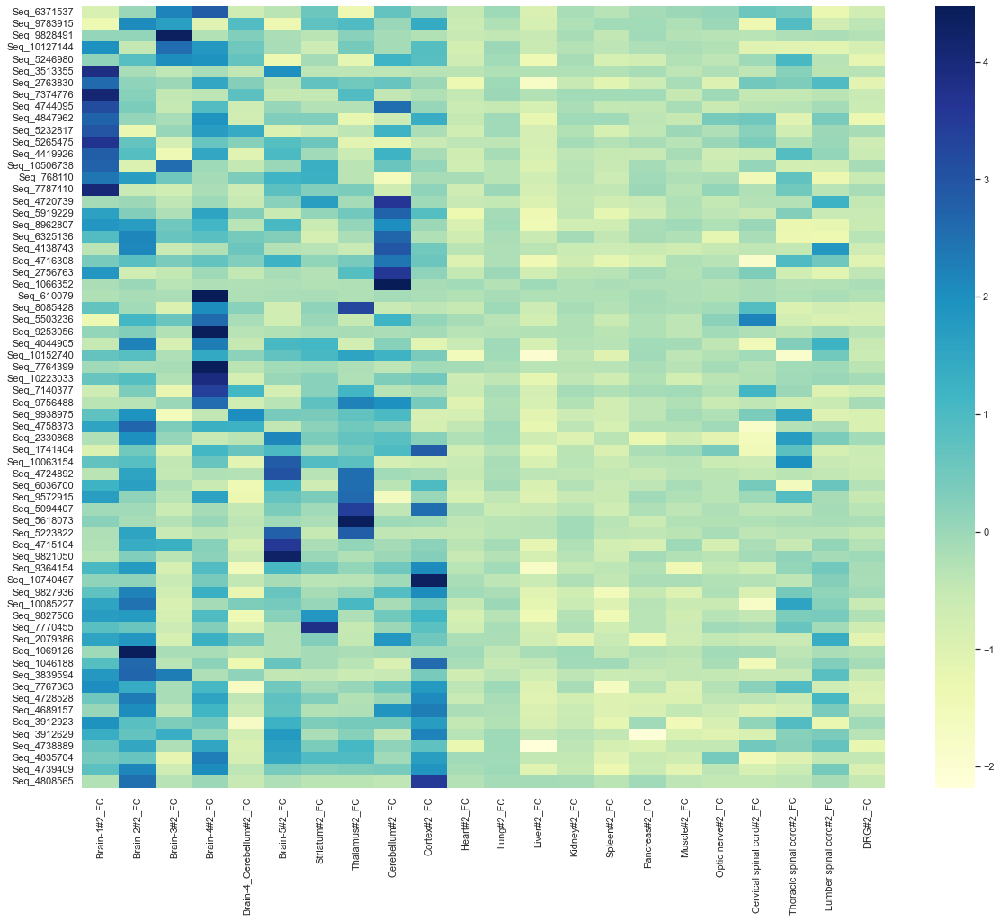

In [1128]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_filter.iloc[:, 1:len(rep2_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['Header_ID'])

In [1359]:
# make heatmap ---

fig = make_subplots(
    rows=1,
    cols=2,
    y_title='Seq_ID',
    x_title='Sample(normalized)',
    column_widths=[1, 30],
    horizontal_spacing=0.00001,
    shared_yaxes=True
)


fig.add_trace(
    go.Heatmap(
        z=rep2_filter.loc[:, ['cluster']],
        y = rep2_filter['Header_ID'],
        x=rep2_filter.loc[:, ['cluster']].columns.values,
        colorscale='rainbow',
        showscale=False
    ),
    row=1,
    col=1
)

x = rep2_filter.iloc[:, 1:len(rep2_filter.columns) - 1].columns.values
z = rep2_filter.iloc[:, 1:len(rep2_filter.columns) - 1]

fig.add_trace(
    go.Heatmap(
        colorbar=dict(
            title='z-score'
        ),
        z=z,
        x=x,
        #y=y,
        colorscale='Viridis'
    ),
    row=1,
    col=2
)

fig.update_layout(
    #plot_bgcolor='white'
    height=800,
    width=700,
    font=dict(
        size=5
    )
)

fig.update_annotations(
   font=dict(size=10),
)

fig.update_yaxes(autorange='reversed')

fig.update_layout(
    title=dict(
        text='Brain_High_heatmap_rep2',
        x=0.5,
        xanchor='center'
    ),
)
fig.show()
htmlfile = os.path.join(
    '/Users/tomoyauchiyama/code/CNN/test/PG4699',
    'PG4699_Brain_High_heatmap_rep2.html'
)
fig.write_html(htmlfile)

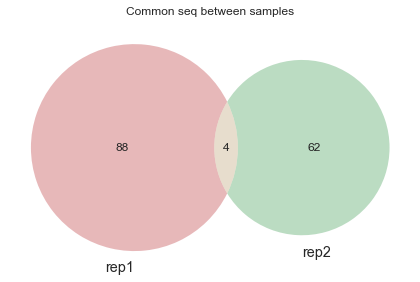

In [1129]:
column = 'Common seq between samples'

plt.figure(figsize=(6,6))
venn2(subsets=(set(rep1_filter['Header_ID']), set(rep2_filter['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()
plt.show()

In [1130]:
common_seq = list(set(rep1_filter['Header_ID']) & set(rep2_filter['Header_ID']))
print(common_seq)

['Seq_5265475', 'Seq_9827936', 'Seq_5919229', 'Seq_4739409']


In [1144]:
rep12_sel

,Header_ID,Sequence,Reverse_complementary,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,Seq_6375,AAAACTACGGGGCGTGATTGGATGCAG,CTGCATCCAATCACGCCCCGTAGTTTT,54,67,55,74,83,92,83,...,1.896552,1.000000e+00,1.275862,1.000000e+00,0.827586,1.000000e+00,1.379310,1.000000e+00,1.172414,1.000000e+00
1,Seq_10846,AAACAGACTGGGCAGACTTGGGAGAGG,CCTCTCCCAAGTCTGCCCAGTCTGTTT,28,34,33,35,27,36,44,...,0.644444,1.000000e+00,0.733333,1.000000e+00,1.000000,1.000000e+00,0.711111,1.000000e+00,0.600000,1.000000e+00
2,Seq_49364,AAGAAGGAGGGGGATAATTGGGATCGG,CCGATCCCAATTATCCCCCTCCTTCTT,1443,388,914,1317,839,702,951,...,0.396892,1.293513e-179,0.755529,3.418788e-20,0.363419,0.000000e+00,0.401076,5.968659e-271,0.327555,1.066589e-283
3,Seq_52061,AAGAAGGGGGGGGAGGATTGGGGGCGT,ACGCCCCCAATCCTCCCCCCCCTTCTT,42,47,38,61,43,109,45,...,0.716049,1.000000e+00,1.888889,1.000000e+00,0.617284,1.000000e+00,0.493827,1.000000e+00,0.814815,1.000000e+00
4,Seq_56859,AAGAATAATGGGAAGCATTGGGAGCAG,CTGCTCCCAATGCTTCCCATTATTCTT,45,48,67,66,61,89,62,...,1.708333,1.000000e+00,1.250000,1.000000e+00,1.416667,1.000000e+00,1.166667,1.000000e+00,1.625000,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2523,Seq_10740289,TTTTCGAATGGGGCTACGTGGGAGACT,AGTCTCCCACGTAGCCCCATTCGAAAA,8517,5161,6156,9390,8544,6559,6997,...,2.501360,0.000000e+00,1.337867,3.763494e-36,1.909412,1.421802e-110,2.057943,2.903575e-158,2.106910,2.934360e-247
2524,Seq_10740467,TTTTCGAATGGGGCTACTTGGGAGACT,AGTCTCCCAAGTAGCCCCATTCGAAAA,18,17,21,31,31,36,24,...,3.900000,1.000000e+00,1.700000,1.000000e+00,2.500000,1.000000e+00,2.500000,1.000000e+00,2.600000,1.000000e+00
2525,Seq_10742571,TTTTCGCGTGGGGAGGCTTGGGAGAAG,CTTCTCCCAAGCCTCCCCACGCGAAAA,328,757,766,862,897,14,1034,...,0.422274,3.774200e-17,0.575406,2.074634e-06,0.677494,1.184091e-08,0.839907,3.705825e-01,0.573086,4.632842e-10
2526,Seq_10747946,TTTTCTGATGGGTCGAATTGGGCTATG,CATAGCCCAATTCGACCCATCAGAAAA,340,485,679,479,34,839,509,...,0.166667,1.047145e-11,1.301587,1.000000e+00,2.619048,1.848985e-08,2.666667,2.579370e-09,1.111111,1.000000e+00


In [1257]:
idx_rep1 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep1_sel_sort['Header_ID']]
brain_rep1 = pd.concat(
   [rep12_sel.loc[idx_rep1, :].reset_index(drop=True), rep1_sel_sort['cluster'].reset_index(drop=True)], axis=1
)
idx_rep2 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep2_sel_sort['Header_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.loc[idx_rep2, :].reset_index(drop=True), rep2_sel_sort['cluster'].reset_index(drop=True)], axis=1
)

In [1258]:
print(brain_rep1.shape)
print(brain_rep2.shape)

(752, 176)
(754, 176)


In [1259]:
idx_rep1 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep1_sel_sort['Header_ID']]
brain_rep1 = pd.concat(
   [rep12_sel.loc[idx_rep1, :].reset_index(drop=True), rep1_sel_sort['cluster'].reset_index(drop=True)], axis=1
)
idx_rep2 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep2_sel_sort['Header_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.loc[idx_rep2, :].reset_index(drop=True), rep2_sel_sort['cluster'].reset_index(drop=True)], axis=1
)

#outf1 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_1_nerve.txt'
#brain_rep1.to_csv(outf1, sep='\t', index=False)
#outf2 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_2_nerve.txt'
#brain_rep2.to_csv(outf2, sep='\t', index=False)
outfile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_nerve.xlsx'
with pd.ExcelWriter(outfile) as writer:
    brain_rep1.to_excel(writer, sheet_name='100-131', index=False)
    brain_rep2.to_excel(writer, sheet_name='200-231', index=False)

### 各グループの配列における特徴 ------

In [1260]:
idx_rep1 = [brain_rep1[brain_rep1['Header_ID'] == seqID].index[0] for seqID in rep1_filter['Header_ID']]
rep1_filter = brain_rep1.loc[idx_rep1, :].reset_index(drop=True)

idx_rep2 = [brain_rep2[brain_rep2['Header_ID'] == seqID].index[0] for seqID in rep2_filter['Header_ID']]
rep2_filter = brain_rep2.loc[idx_rep2, :].reset_index(drop=True)

outfile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_High_Common_Consensus_frequency_nerve.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_filter.to_excel(writer, sheet_name='100-131', index=False)
    rep2_filter.to_excel(writer, sheet_name='200-231', index=False)

In [1149]:
idx_rep1 = [brain_rep1[brain_rep1['Header_ID'] == seqID].index[0] for seqID in rep1_filter['Header_ID']]
rep1_filter_seq = brain_rep1.loc[idx_rep1, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

idx_rep2 = [brain_rep2[brain_rep2['Header_ID'] == seqID].index[0] for seqID in rep2_filter['Header_ID']]
rep2_filter_seq = brain_rep2.loc[idx_rep2, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

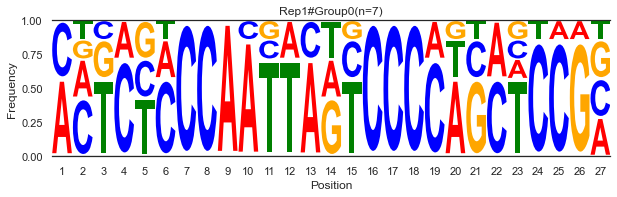

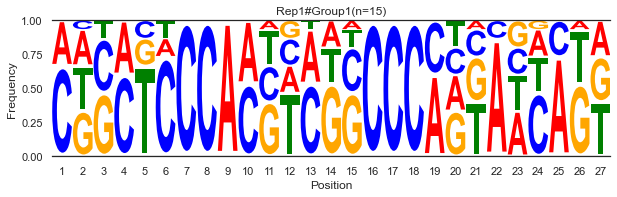

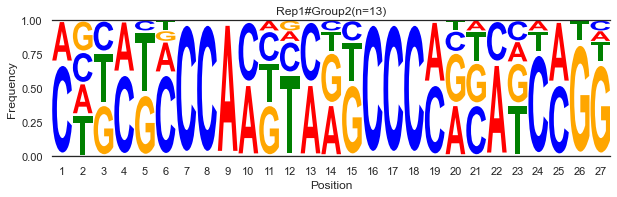

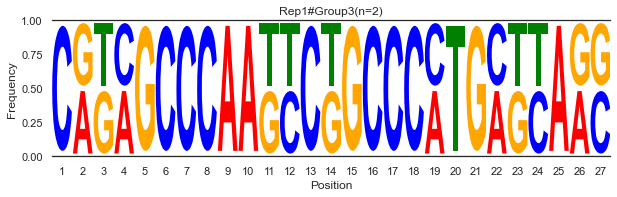

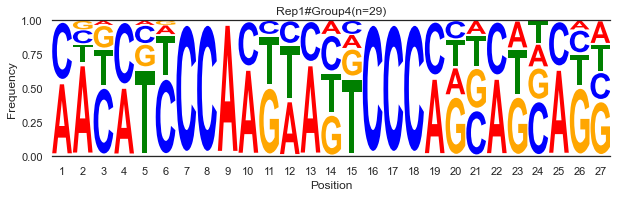

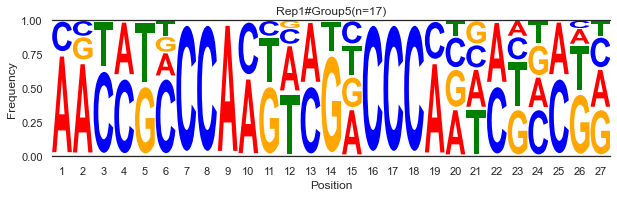

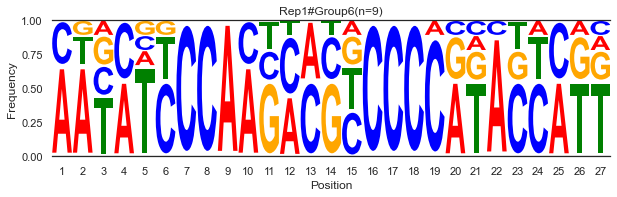

In [1150]:
rep1_groups = []
for i in rep1_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep1_filter_seq[rep1_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep1#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep1#Group'+ str(i)
    rep1_groups.append(name)
    logo_fig(pos_freq, title)

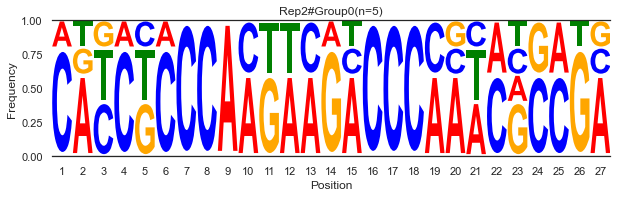

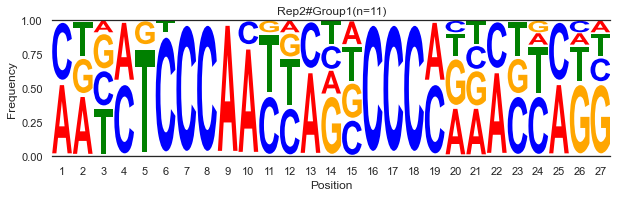

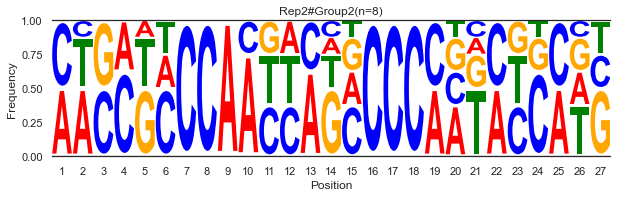

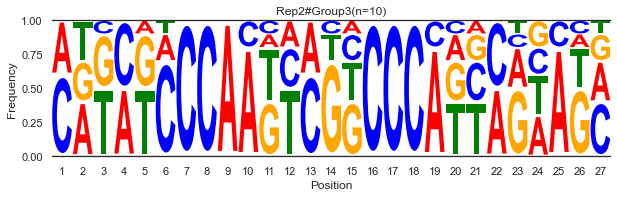

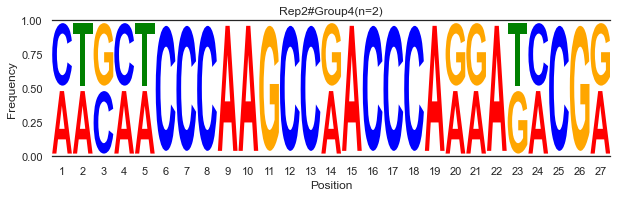

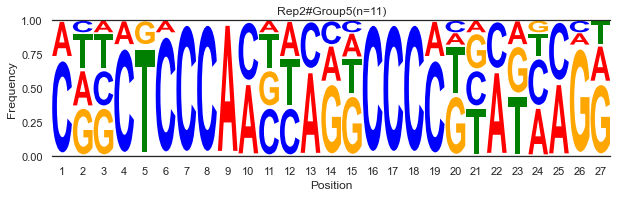

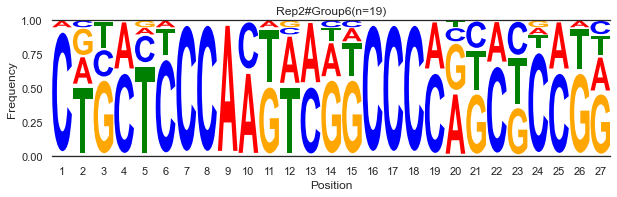

In [1151]:
rep2_groups = []
for i in rep2_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep2_filter_seq[rep2_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep2#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep2#Group'+ str(i)
    rep2_groups.append(name)
    logo_fig(pos_freq, title)

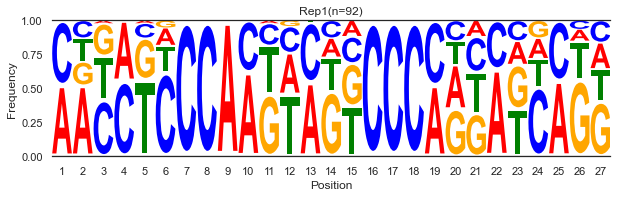

In [1152]:
nucl = pd.DataFrame()
seqs = rep1_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep1'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

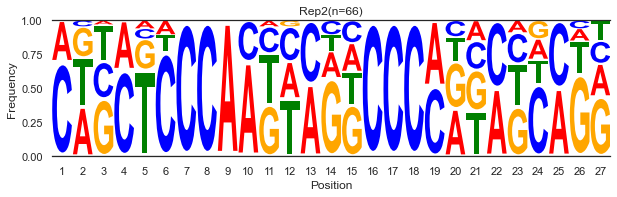

In [1153]:
nucl = pd.DataFrame()
seqs = rep2_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep2'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

In [1155]:
# tissue grouping (DRG#1: 内臓組織)----
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC'
]
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
    'DRG#1_FC'
]
# tissue grouping (DRG#2: 内臓組織)----
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC'
]
others_2 = [
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC',
    'Spleen#2_FC',
    'DRG#2_FC'
]

In [1156]:
#infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
rep1 = pd.read_excel(infile, sheet_name='100-131')
rep2 = pd.read_excel(infile, sheet_name='200-231')

In [1157]:
print(rep1.shape)
print(rep2.shape)
headerID = rep1['Header_ID']

(2528, 21)
(2528, 23)


In [1158]:
group_1 = pd.DataFrame()
for i in range(len(rep1)):
    b = rep1.loc[i, brain_1].mean()
    n = rep1.loc[i, nerve_1].mean()
    o = rep1.loc[i, others_1].mean()
    col = pd.Series([b, n, o])
    group_1 = group_1.append(col, ignore_index=True)
group_1.columns = ['Brain#1', 'Nerve#1', 'Others#1']
rep1_group = pd.concat([headerID, group_1], axis=1)

In [1159]:
rep1_group

,Header_ID,Brain#1,Nerve#1,Others#1
0,Seq_6375,0.399326,0.313360,-0.874450
1,Seq_10846,-0.082966,-0.525452,0.488578
2,Seq_49364,-0.167529,-0.362816,0.521092
3,Seq_52061,-0.280495,-0.070124,0.514241
4,Seq_56859,0.145094,0.244021,-0.404503
...,...,...,...,...
2523,Seq_10740289,0.275440,-0.125724,-0.375251
2524,Seq_10740467,0.275468,-0.007445,-0.454150
2525,Seq_10742571,0.098185,0.170551,-0.277342
2526,Seq_10747946,0.172692,0.519364,-0.634063


In [1160]:
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 0) & (rep1_group['Others#1'] < 0) & (rep1_group['Nerve#1'] < 0)]

In [1161]:
group_1_sel.shape

(633, 4)

<AxesSubplot:>

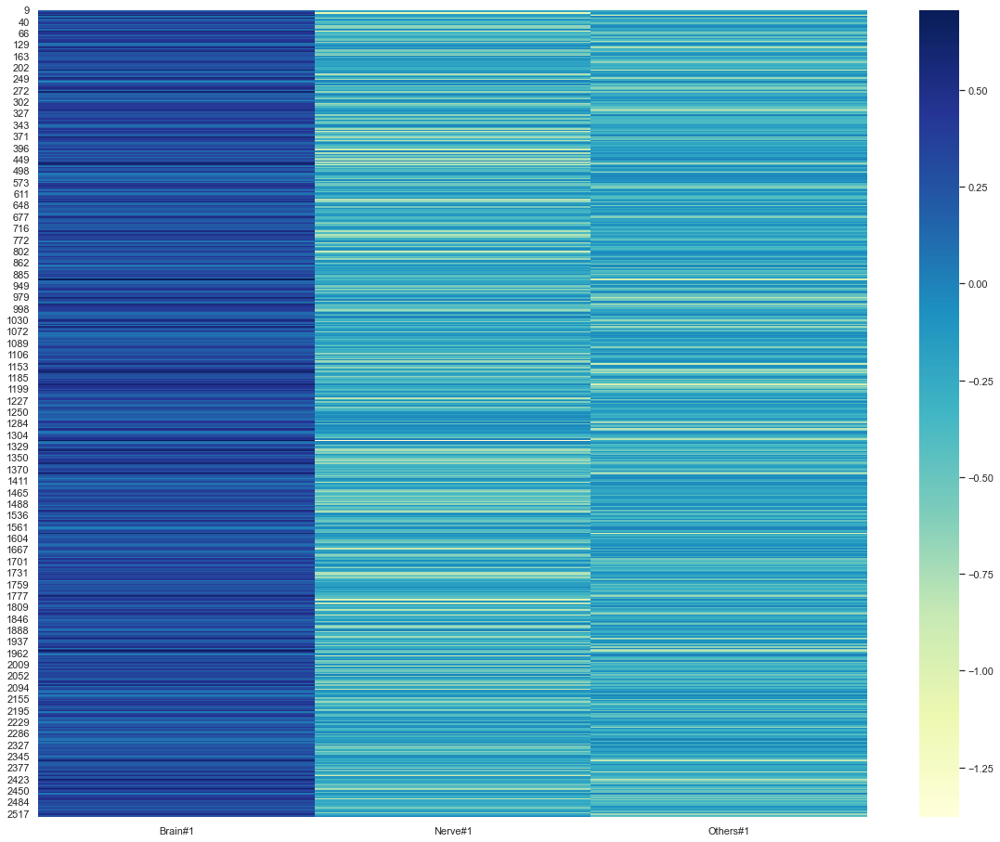

In [1162]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_1_sel.iloc[:, 1:], cmap='YlGnBu')

In [1163]:
group_2 = pd.DataFrame()
for i in range(len(rep2_z_mod)):
    b = rep2.loc[i, brain_2].mean()
    n = rep2.loc[i, nerve_2].mean()
    o = rep2.loc[i, others_2].mean()
    col = pd.Series([b, n, o])
    group_2 = group_2.append(col, ignore_index=True)
group_2.columns = ['Brain#2', 'Nerve#2', 'Others#2']
rep2_group = pd.concat([headerID, group_2], axis=1)

In [1164]:
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 0) & (rep2_group['Others#2'] < 0) & (rep2_group['Nerve#2'] < 0)]

In [1165]:
group_2_sel.shape

(727, 4)

<AxesSubplot:>

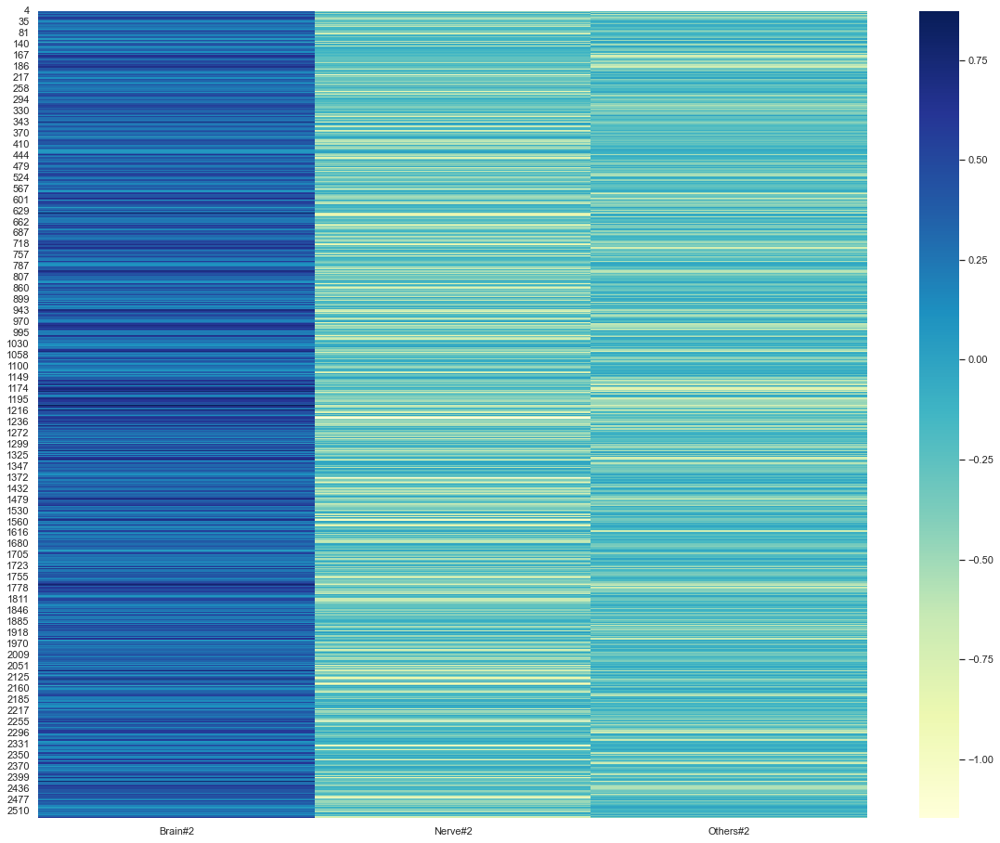

In [1166]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_2_sel.iloc[:, 1:], cmap='YlGnBu')

In [1167]:
idx_rep1 = sorted([rep1[rep1['Header_ID'] == seqID].index[0] for seqID in group_1_sel['Header_ID']])
rep1_sel = pd.concat([group_1_sel['Header_ID'].reset_index(drop=True), rep1.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)
idx_rep2 = sorted([rep2[rep2['Header_ID'] == seqID].index[0] for seqID in group_2_sel['Header_ID']])
rep2_sel = pd.concat([group_2_sel['Header_ID'].reset_index(drop=True), rep2.loc[idx_rep2, rep2_columns].reset_index(drop=True)], axis=1)

print(rep1_sel.shape)
print(rep2_sel.shape)

(633, 21)
(727, 23)


<AxesSubplot:>

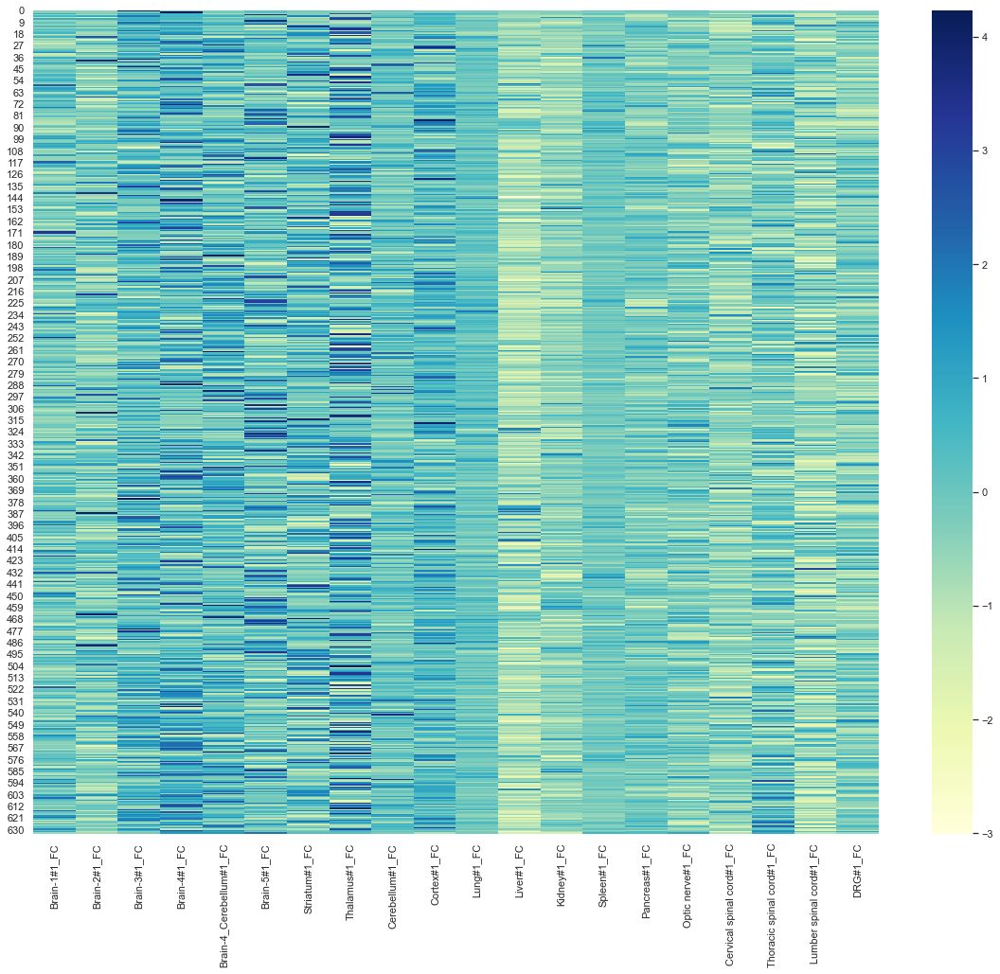

In [1168]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

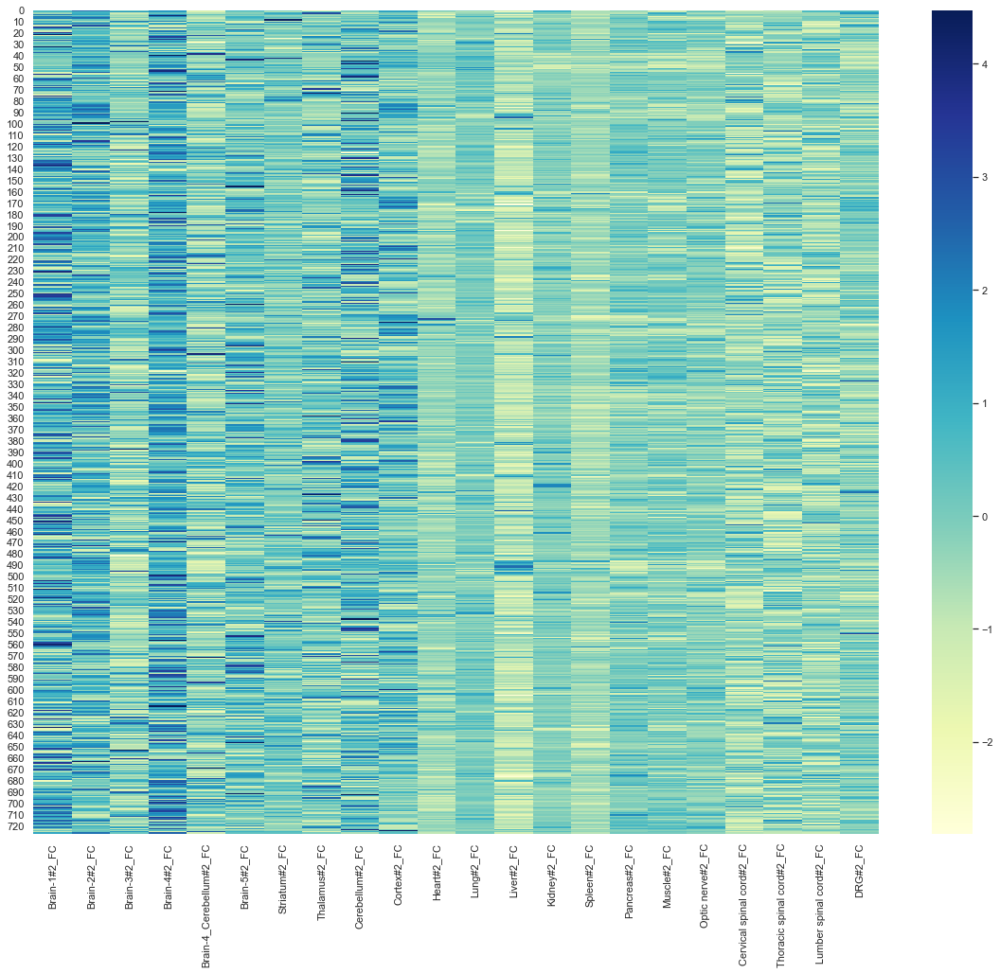

In [1169]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel.iloc[:, 1:], cmap='YlGnBu')

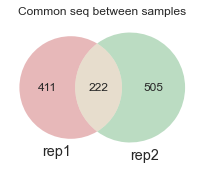

In [1170]:
column = 'Common seq between samples'

plt.figure(figsize=(3,3))
venn2(subsets=(set(rep1_sel['Header_ID']), set(rep2_sel['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()

In [1171]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import linkage

num = 10 # クラスター数を10個までの範囲で比較
NUM_CLUSTERS_RANGE = range(2, num+1)  
X1 = rep1_sel.iloc[:, 1:]
X2 = rep2_sel.iloc[:, 1:]

davies_bouldin_index1 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X1)
    labels = kmeans.labels_
    davies_bouldin_index1.append(davies_bouldin_score(X1, labels))

davies_bouldin_index2 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X2)
    labels = kmeans.labels_
    davies_bouldin_index2.append(davies_bouldin_score(X2, labels))


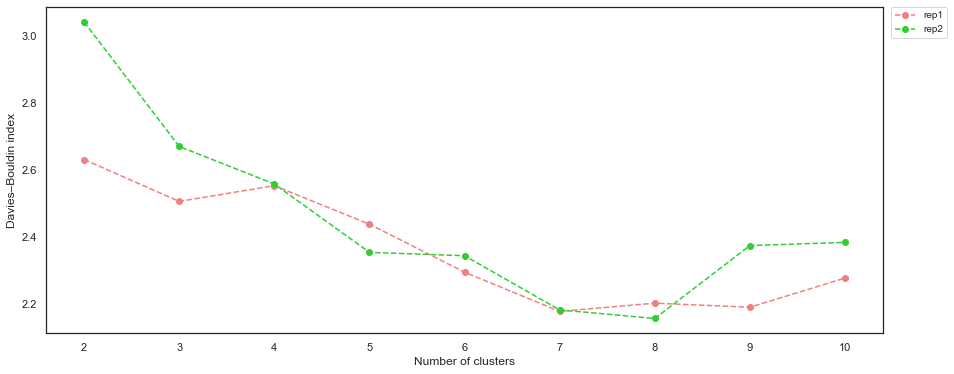

In [1172]:
sns.set_style("white")
plt.figure(figsize=(15, 6))
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index1, marker='o', linestyle='--', c='lightcoral', label='rep1')
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index2, marker='o', linestyle='--', c='limegreen', label='rep2')
plt.xlabel('Number of clusters')
plt.ylabel('Davies–Bouldin index')
#plt.axvline(x=7, color='gray', linestyle='--')
plt.legend(
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10
)
plt.show()

rep1:k=7、rep2:k=8に決定

In [1173]:
np.random.seed(0)
model = KMeans(n_clusters=7, init='k-means++',  random_state=1)
model.fit(rep1_sel.iloc[:, 1:])
rep1_sel['cluster'] = model.labels_
rep1_sel_sort = rep1_sel.sort_values('cluster')

<AxesSubplot:>

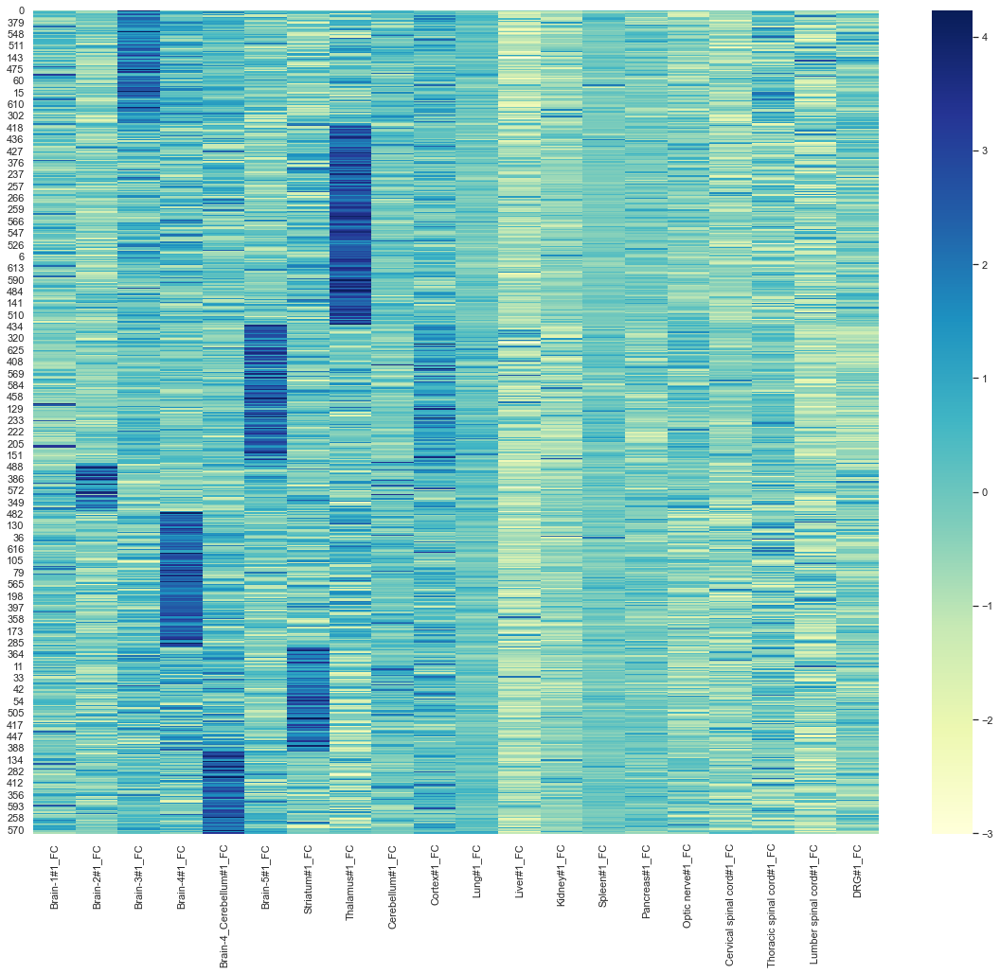

In [1174]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel_sort.iloc[:, 1:len(rep1_sel_sort.columns) - 1], cmap='YlGnBu')

In [1187]:
np.random.seed(0)
model = KMeans(n_clusters=8, init='k-means++',  random_state=1)
model.fit(rep2_sel.iloc[:, 1:])
rep2_sel['cluster'] = model.labels_
rep2_sel_sort = rep2_sel.sort_values('cluster')

<AxesSubplot:>

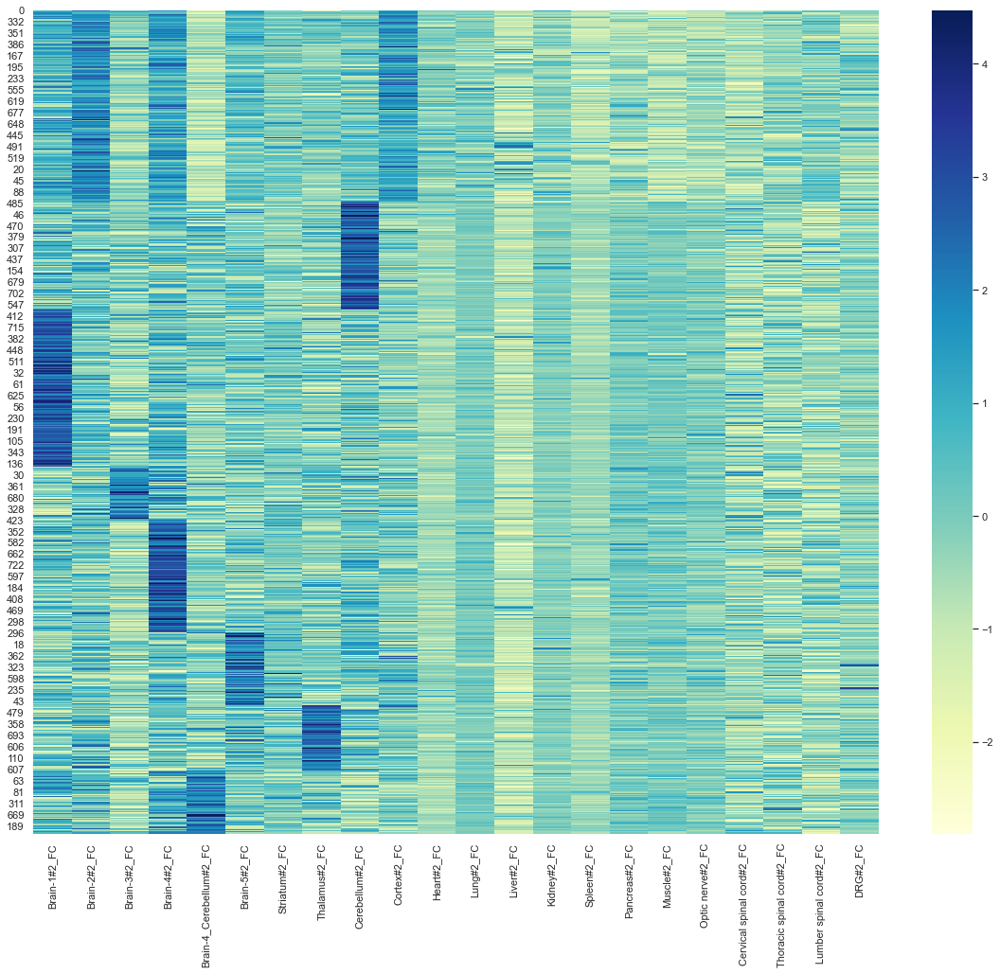

In [1188]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel_sort.iloc[:, 1:len(rep2_sel_sort.columns) - 1], cmap='YlGnBu')

In [1193]:
rep1_filter = rep1_sel_sort[
    (rep1_sel_sort['Lung#1_FC'] < 0 ) &
    (rep1_sel_sort['Liver#1_FC'] < 0) & 
    (rep1_sel_sort['Kidney#1_FC'] < 0) &
    (rep1_sel_sort['Pancreas#1_FC'] < 0) &
    (rep1_sel_sort['Spleen#1_FC'] < 0) &
    (rep1_sel_sort['DRG#1_FC'] < 0)
]

In [1194]:
rep1_filter.shape

(66, 22)

<AxesSubplot:>

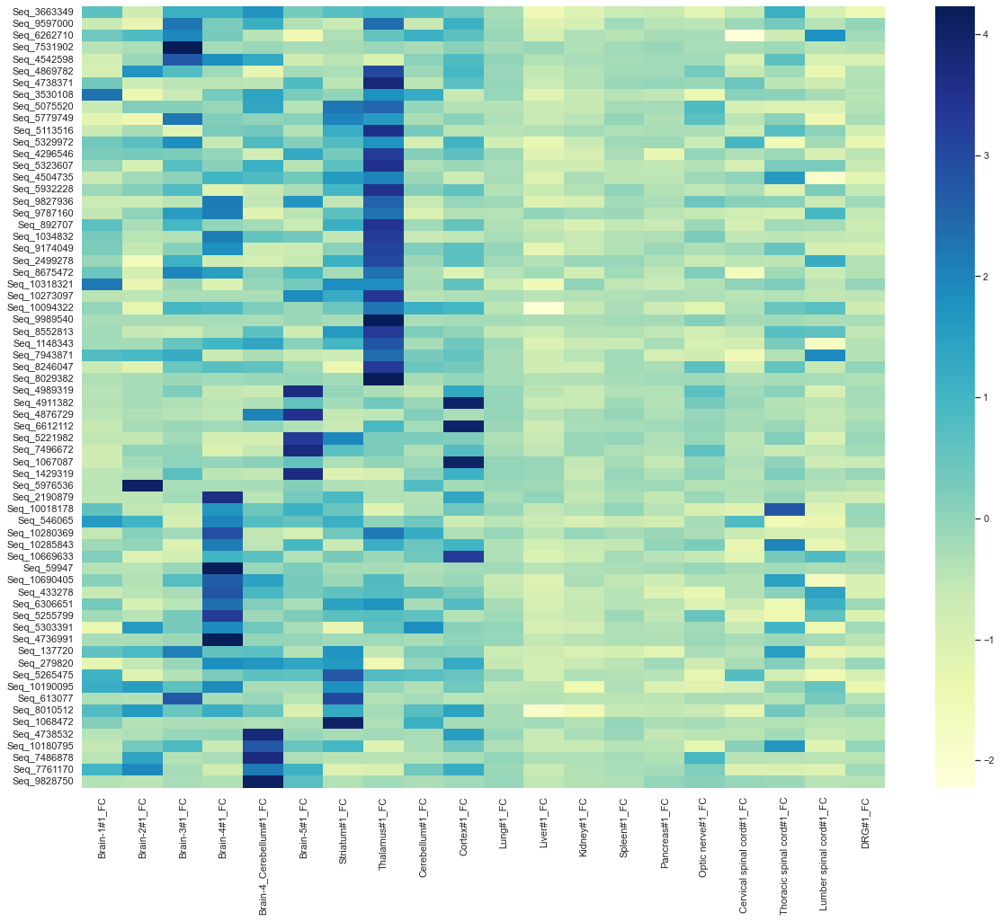

In [1195]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep1_filter['Header_ID'])

In [1196]:
rep2_filter = rep2_sel_sort[
    (rep2_sel_sort['Heart#2_FC'] < 0 ) &
    (rep2_sel_sort['Muscle#2_FC'] < 0) &
    (rep2_sel_sort['Lung#2_FC'] < 0 ) &
    (rep2_sel_sort['Liver#2_FC'] < 0) & 
    (rep2_sel_sort['Kidney#2_FC'] < 0) &
    (rep2_sel_sort['Pancreas#2_FC'] < 0) &
    (rep2_sel_sort['Spleen#2_FC'] < 0) &
    (rep2_sel_sort['DRG#2_FC'] < 0)
]

In [1207]:
rep2_filter.shape

(53, 24)

<AxesSubplot:>

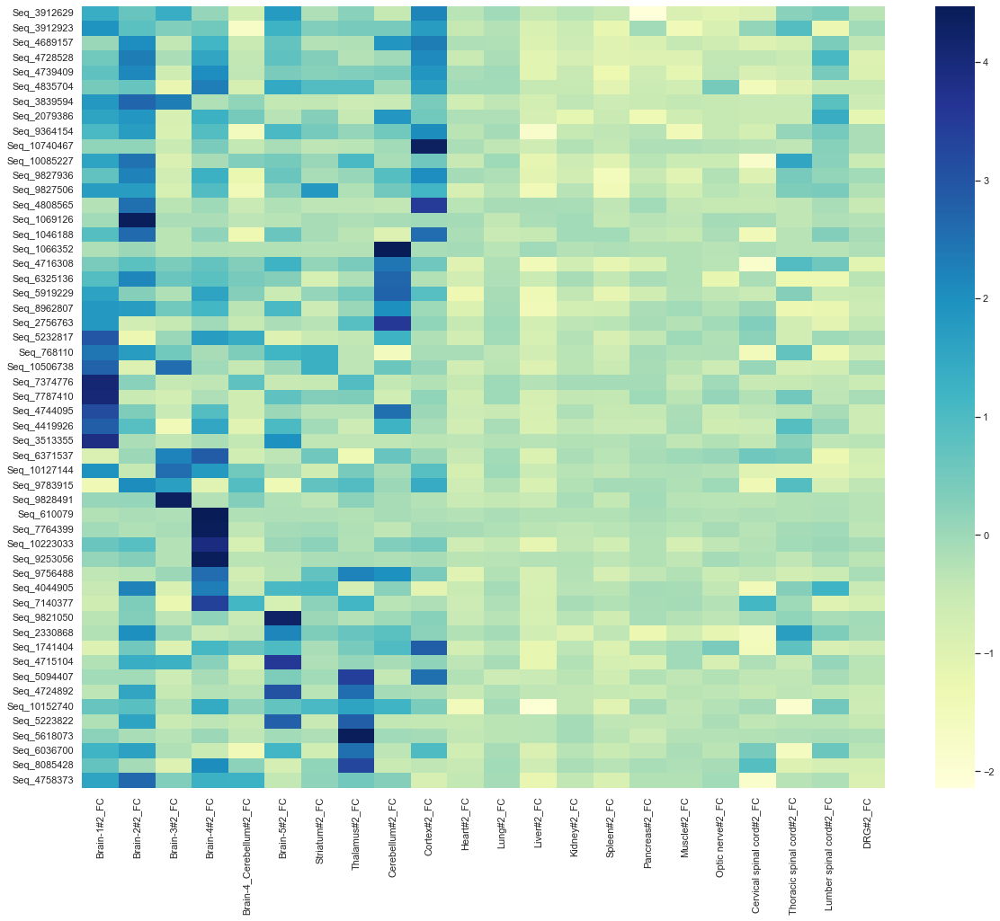

In [1198]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_filter.iloc[:, 1:len(rep2_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['Header_ID'])

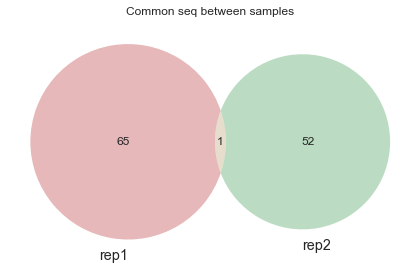

In [1199]:
column = 'Common seq between samples'

plt.figure(figsize=(6,6))
venn2(subsets=(set(rep1_filter['Header_ID']), set(rep2_filter['Header_ID'])), set_labels=('rep1', 'rep2'))
plt.title(column)
plt.tight_layout()
plt.show()

In [1208]:
idx_rep1 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep1_sel_sort['Header_ID']]
brain_rep1 = pd.concat(
   [rep12_sel.loc[idx_rep1, :].reset_index(drop=True), rep1_sel_sort['cluster'].reset_index(drop=True)], axis=1
)
idx_rep2 = [rep12_sel[rep12_sel['Header_ID'] == seqID].index[0] for seqID in rep2_sel_sort['Header_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.loc[idx_rep2, :].reset_index(drop=True), rep2_sel_sort['cluster'].reset_index(drop=True)], axis=1
)
#outf1 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_1_others.txt'
#brain_rep1.to_csv(outf1, sep='\t', index=False)
#outf2 = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_2_others.txt'
#brain_rep2.to_csv(outf2, sep='\t', index=False)
outfile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_Cluster_Common_Consensus_frequency_others.xlsx'
with pd.ExcelWriter(outfile) as writer:
    brain_rep1.to_excel(writer, sheet_name='100-131', index=False)
    brain_rep2.to_excel(writer, sheet_name='200-231', index=False)

### 各グループの配列における特徴 ------

In [1211]:
idx_rep1 = [brain_rep1[brain_rep1['Header_ID'] == seqID].index[0] for seqID in rep1_filter['Header_ID']]
rep1_filter = brain_rep1.loc[idx_rep1, :].reset_index(drop=True)

idx_rep2 = [brain_rep2[brain_rep2['Header_ID'] == seqID].index[0] for seqID in rep2_filter['Header_ID']]
rep2_filter = brain_rep2.loc[idx_rep2, :].reset_index(drop=True)

outfile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Brain_High_Common_Consensus_frequency_others.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_filter.to_excel(writer, sheet_name='100-131', index=False)
    rep2_filter.to_excel(writer, sheet_name='200-231', index=False)

In [1202]:
idx_rep1 = [brain_rep1[brain_rep1['Header_ID'] == seqID].index[0] for seqID in rep1_filter['Header_ID']]
rep1_filter_seq = brain_rep1.loc[idx_rep1, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

idx_rep2 = [brain_rep2[brain_rep2['Header_ID'] == seqID].index[0] for seqID in rep2_filter['Header_ID']]
rep2_filter_seq = brain_rep2.loc[idx_rep2, ['Header_ID', 'Reverse_complementary', 'cluster']].reset_index(drop=True)

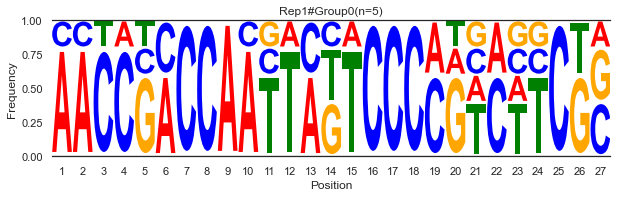

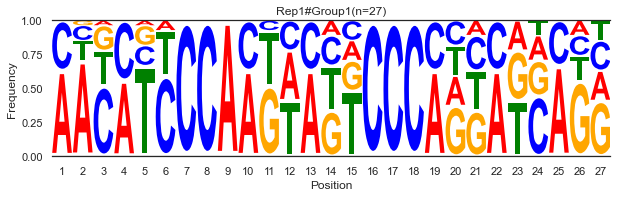

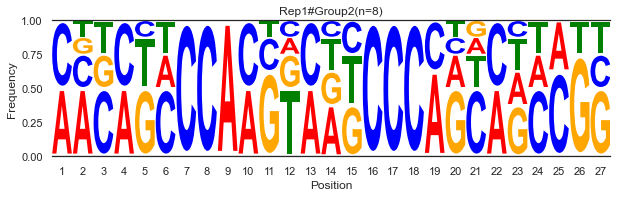

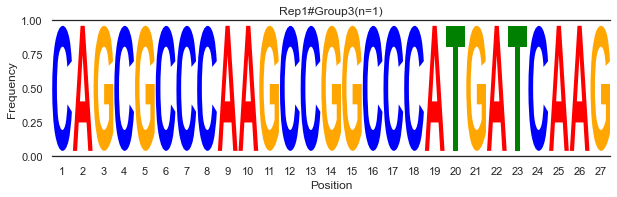

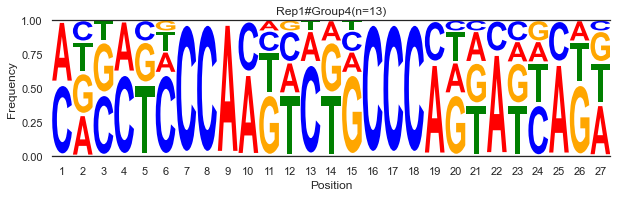

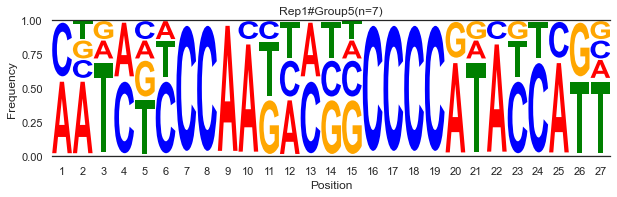

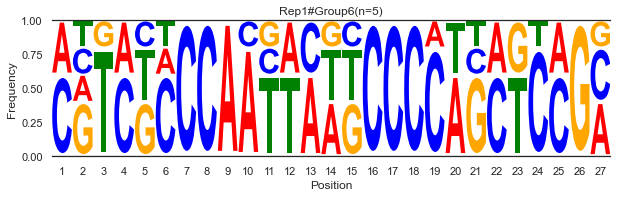

In [1203]:
rep1_groups = []
for i in rep1_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep1_filter_seq[rep1_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep1#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep1#Group'+ str(i)
    rep1_groups.append(name)
    logo_fig(pos_freq, title)

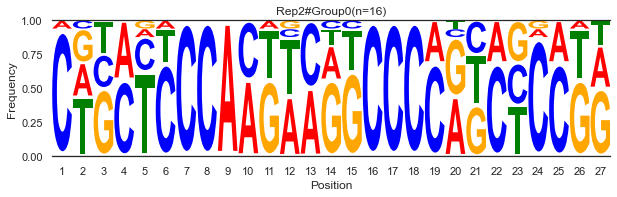

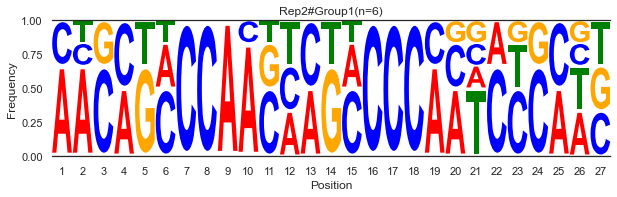

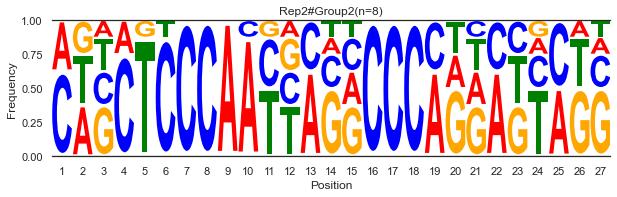

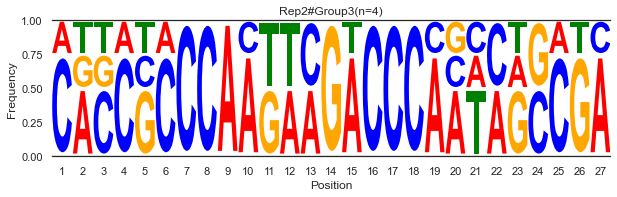

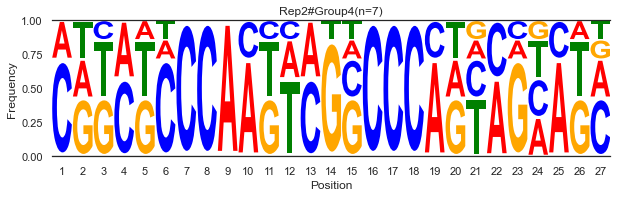

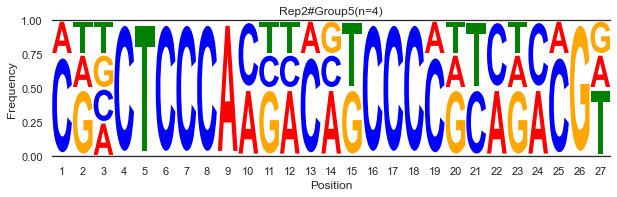

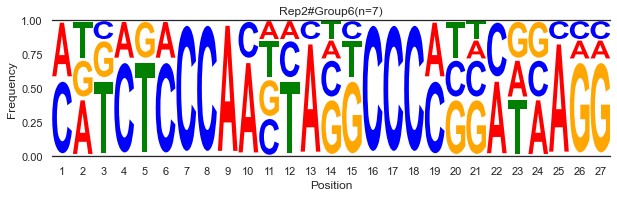

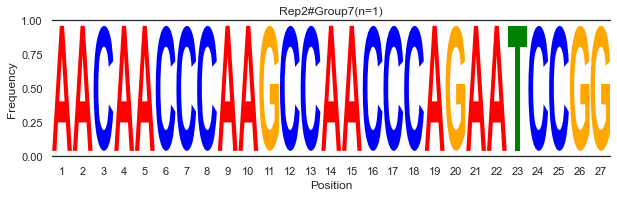

In [1204]:
rep2_groups = []
for i in rep2_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep2_filter_seq[rep2_filter_seq['cluster'] == i]['Reverse_complementary']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep2#Group'+ str(i)+'(n='+str(total)+')'
    name = 'Rep2#Group'+ str(i)
    rep2_groups.append(name)
    logo_fig(pos_freq, title)

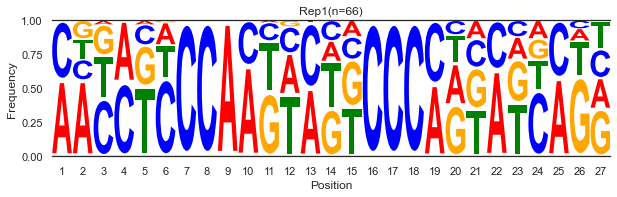

In [1205]:
nucl = pd.DataFrame()
seqs = rep1_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep1'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

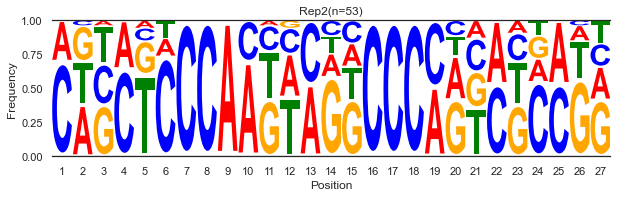

In [1206]:
nucl = pd.DataFrame()
seqs = rep2_filter_seq['Reverse_complementary']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep2'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

In [1363]:
infile = '/Users/tomoyauchiyama/code/CNN/test/PG4699/PG4699_Others_High_Common_Consensus_frequency.xlsx'
df1 = pd.read_excel(infile, sheet_name='100-131')
df2 = pd.read_excel(infile, sheet_name='200-231')

In [1366]:
df1.columns

Index(['Header_ID', 'Reverse_complementary (Sequence Read)',
       'Sequence (Target Sequence)', 'Brain-1#1_Count', 'Brain-2#1_Count',
       'Brain-3#1_Count', 'Brain-4#1_Count', 'Brain-4_Cerebellum#1_Count',
       'Brain-5#1_Count', 'Striatum#1_Count',
       ...
       'Lumber spinal cord#2_FDR', 'Spleen#2_FC', 'Spleen#2_FDR',
       'Pancreas#2_FC', 'Pancreas#2_FDR', 'Muscle#2_FC', 'Muscle#2_FDR',
       'DRG#2_FC', 'DRG#2_FDR', 'cluster'],
      dtype='object', length=176)

In [1369]:
rep1_filter_seq = df1.loc[:, ['Header_ID', 'Reverse_complementary (Sequence Read)', 'cluster']]
rep2_filter_seq = df2.loc[:, ['Header_ID', 'Reverse_complementary (Sequence Read)', 'cluster']]

In [1370]:
rep1_filter_seq

,Header_ID,Reverse_complementary (Sequence Read),cluster
0,Seq_8679888,GGTTCGCAGGGGCAGCTTTGGGAGAGG,0
1,Seq_7217441,GATTCTACTGGGTCTAATTGGGGGCGG,0
2,Seq_7451220,GCGCCTTTGGGGGATAGTTGGGCTCAG,5
3,Seq_9828403,TCGGCGGTTGGGACGTCTTGGGATCAG,5
4,Seq_5725186,CTGATTGCGGGGTCGGGGTGGGAGATT,5
...,...,...,...
182,Seq_8840155,GTGCCGCTTGGGTCGGGGTGGGAGAAT,12
183,Seq_6975897,GATCGTCAGGGGCCGACGTGGAGTTGT,12
184,Seq_10598078,TTGGCGCAGGGGCCGAAGTGGGCTGAT,12
185,Seq_8551030,GGTCCTGCGGGGACGAAGTGGGATTTG,12


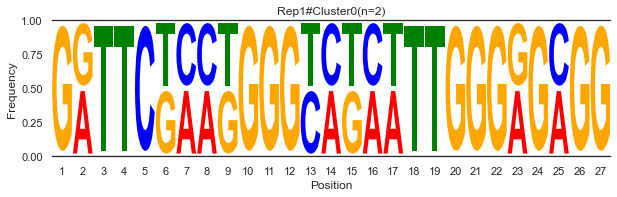

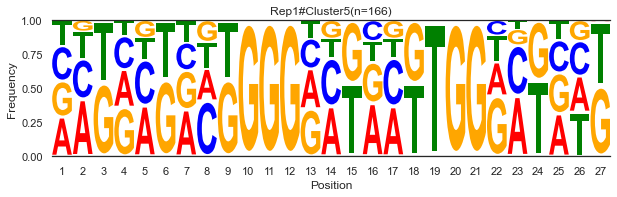

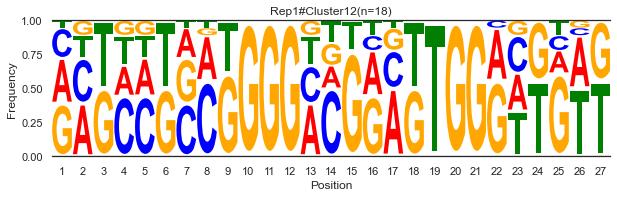

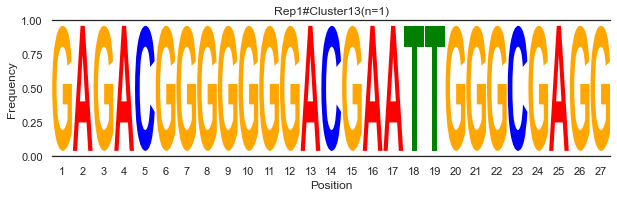

In [1372]:
rep1_groups = []
for i in rep1_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep1_filter_seq[rep1_filter_seq['cluster'] == i]['Reverse_complementary (Sequence Read)']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep1#Cluster'+ str(i)+'(n='+str(total)+')'
    name = 'Rep1#Cluster'+ str(i)
    rep1_groups.append(name)
    logo_fig(pos_freq, title)

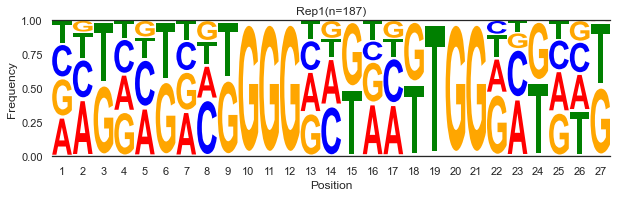

In [1377]:
nucl = pd.DataFrame()
seqs = rep1_filter_seq['Reverse_complementary (Sequence Read)']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep1'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

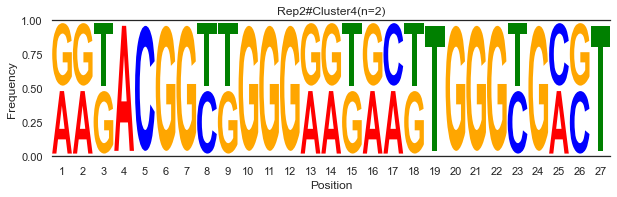

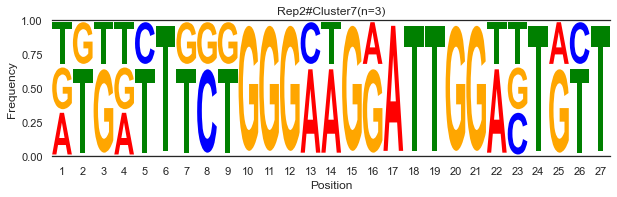

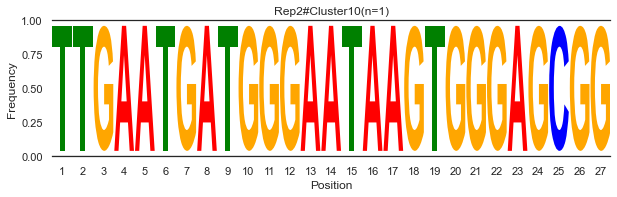

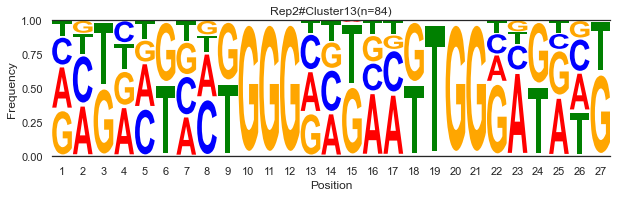

In [1374]:
rep2_groups = []
for i in rep2_filter_seq['cluster'].unique():
    nucl = pd.DataFrame()
    seqs = rep2_filter_seq[rep2_filter_seq['cluster'] == i]['Reverse_complementary (Sequence Read)']
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        A = col_list.count('A') / total
        T = col_list.count('T') / total
        G = col_list.count('G') / total
        C = col_list.count('C') / total
        #N = col_list.count('N') / total
        freq = pd.Series([A, T, G, C])
        pos_freq = pos_freq.append(freq, ignore_index=True)
    pos_freq.columns = ['A', 'T', 'G', 'C']
    pos_freq.index += 1
    title = 'Rep2#Cluster'+ str(i)+'(n='+str(total)+')'
    name = 'Rep2#Cluster'+ str(i)
    rep1_groups.append(name)
    logo_fig(pos_freq, title)

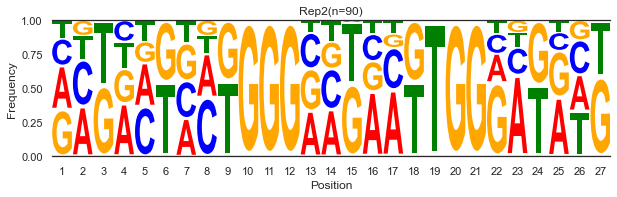

In [1375]:
nucl = pd.DataFrame()
seqs = rep2_filter_seq['Reverse_complementary (Sequence Read)']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_freq = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    A = col_list.count('A') / total
    T = col_list.count('T') / total
    G = col_list.count('G') / total
    C = col_list.count('C') / total
    #N = col_list.count('N') / total
    freq = pd.Series([A, T, G, C])
    pos_freq = pos_freq.append(freq, ignore_index=True)

pos_freq.columns = ['A', 'T', 'G', 'C']
pos_freq.index += 1
title = 'Rep2'+'(n='+str(total)+')'
logo_fig(pos_freq, title)

In [1376]:
# make heatmap ---

fig = make_subplots(
    rows=1,
    cols=2,
    y_title='Seq_ID',
    x_title='Sample(normalized)',
    column_widths=[1, 30],
    horizontal_spacing=0.00001,
    shared_yaxes=True
)


fig.add_trace(
    go.Heatmap(
        z=df1.loc[:, ['cluster']],
        y =df1['Header_ID'],
        x=df1.loc[:, ['cluster']].columns.values,
        colorscale='rainbow',
        showscale=False
    ),
    row=1,
    col=1
)

x = df1.iloc[:, 1:len(df1.columns) - 1].columns.values
z = df1.iloc[:, 1:len(df1.columns) - 1]

fig.add_trace(
    go.Heatmap(
        colorbar=dict(
            title='z-score'
        ),
        z=z,
        x=x,
        #y=y,
        colorscale='Viridis'
    ),
    row=1,
    col=2
)

fig.update_layout(
    #plot_bgcolor='white'
    height=800,
    width=700,
    font=dict(
        size=5
    )
)

fig.update_annotations(
   font=dict(size=10),
)

fig.update_yaxes(autorange='reversed')

fig.update_layout(
    title=dict(
        text='Others_High_heatmap_rep1',
        x=0.5,
        xanchor='center'
    ),
)
fig.show()
htmlfile = os.path.join(
    '/Users/tomoyauchiyama/code/CNN/test/PG4699',
    'PG4699_Others_High_heatmap_rep2.html'
)
fig.write_html(htmlfile)